<a href="https://colab.research.google.com/github/4teven/AI-is-all-you-Need/blob/main/MachineLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning




**Supervised learning**

train a model on labeled data, the task is to predict this labeling

[Self-supervised learning, generating labels, which are derived from the data itself (word embeddings, BERT)].


1.   Model:
Predicting outputs from inputs

2.   Loss Function: Used to measure the gap between the value predicted by the model and the true
3.  Objective: Optimize the function while training the training
4.   Optimization:  
Parameters that are not specified in the model (deliberately learned parameters) are filled in with values in the actual data that enable the minimization of losses


***Classification：***



1.   Decision Trees: Using trees to make decisions
2.   Liner methds: The things that make decisions when making decisions are based on linear combinations of inputs
3.   Kernel machines:  
The kernel function is used to measure the similarity of features between two samples

4.   Neural network:  
A multi-layer neural network is used to learn a feature representation that can be followed by a linear method that will have a good representation.

---


**Semi-supervised learning: **

there is some labeled data and most unlabeled data, where there are two tasks:

[learn a model to predict the labeling like supervised learning, but try to use unlabeled information; give a prediction of the labeling of the unlabeled data (self-training)];



---


**Unsupervised learning:**

the whole data is unlabeled and the task is not to predict a label (clustering algorithms, estimation of distributions (GAN));



---



**Reinforcement learning:**

the model interacts with the environment, learns after getting observations from the environment, and then does some behaviors to get feedback again (more like how humans learn);



## **Linear Regression Single Variable**

In [ ]:
import pandas as pd
import numpy as np
from sklearn import linear_model
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/homeprices.csv')
df

,area,price
0,2600,550000
1,3000,565000
2,3200,610000
3,3600,680000
4,4000,725000


Text(0, 0.5, 'Price(US$)')

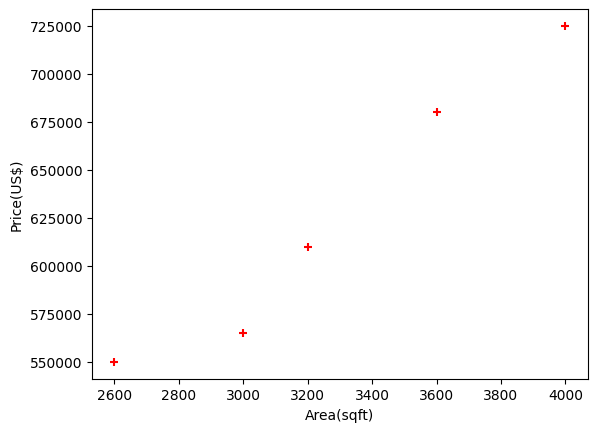

In [ ]:
%matplotlib inline
plt.scatter(df.area,df.price,color='red',marker='+')
plt.xlabel('Area(sqft)')
plt.ylabel('Price(US$)')

In [ ]:
dff = df.drop('price',axis='columns')
dff

,area
0,2600
1,3000
2,3200
3,3600
4,4000


In [ ]:
price = df.price
price

,price
0,550000
1,565000
2,610000
3,680000
4,725000


In [ ]:
model = linear_model.LinearRegression()
model.fit(df[['area']],df.price)
# same to below
# reg = linear_model.LinearRegression()
# reg.fit(dff,price)

LinearRegression()

In [ ]:
model.predict([[3300]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([628715.75342466])

In [ ]:
model.predict(pd.DataFrame([[3300]], columns=['area']))

array([628715.75342466])

In [ ]:
model.coef_

array([135.78767123])

In [ ]:
model.intercept_

180616.43835616432

In [ ]:
3300*135.78767123 + 180616.43835616432

628715.7534151643

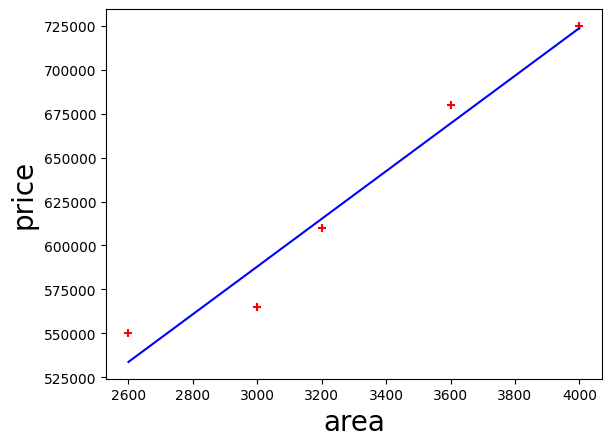

In [ ]:
%matplotlib inline
plt.xlabel('area',fontsize=20)
plt.ylabel('price',fontsize=20)
plt.scatter(df.area,df.price,color='red',marker='+')
plt.plot(df.area,model.predict(dff),color='blue')

In [ ]:
areas = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/areas.csv')
areas

,area
0,1000
1,1500
2,2300
3,3540
4,4120
5,4560
6,5490
7,3460
8,4750
9,2300


In [ ]:
dff

,area
0,2600
1,3000
2,3200
3,3600
4,4000


In [ ]:
m = linear_model.LinearRegression()
m.fit(dff,price)
p = m.predict(areas)

In [ ]:
areas['prices'] = p
areas

In [ ]:
areas.to_csv('new data.csv',index=False)



---


**Exercise**

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
ex = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/canada_per_capita_income.csv')
ex

In [ ]:
Linear= LinearRegression()
Linear.fit(ex[['year']],ex['per capita income (US$)'])

LinearRegression()

In [ ]:
Linear.predict(pd.DataFrame([[2020]], columns=['year']))

array([41288.69409442])

## **Linear Regression Multiple Variable**

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/Homeprice.csv')
data

,area,bedrooms,age,price
0,2600,3.0,20,550000
1,3000,4.0,15,565000
2,3200,NaN,18,610000
3,3600,3.0,30,595000
4,4000,5.0,8,760000
5,4100,6.0,8,810000


In [ ]:
#handling missing data
import math
median_bedrooms = math.floor(data.bedrooms.median())
data['bedrooms'] = data.bedrooms.fillna(median_bedrooms)
data

,area,bedrooms,age,price
0,2600,3.0,20,550000
1,3000,4.0,15,565000
2,3200,4.0,18,610000
3,3600,3.0,30,595000
4,4000,5.0,8,760000
5,4100,6.0,8,810000


In [ ]:
Reg = LinearRegression()
Reg.fit(data[['area','bedrooms','age']],data.price)

LinearRegression()

In [ ]:
Reg.predict(pd.DataFrame([[3000,3,40]], columns=['area','bedrooms','age']))

array([498408.25158031])

In [ ]:
print(Reg.coef_)
print(Reg.intercept_)

[  112.06244194 23388.88007794 -3231.71790863]
221323.00186540396


In [ ]:
112.06244194*3000+23388.88007794*3-3231.71790863*40 +221323.00186540396

498408.251574024



---
**Exercise**

examples:

12,10,10

2,9,6

In [ ]:
sales = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/hiring.csv')
sales

,experience,test_score(out of 10),interview_score(out of 10),salary($)
0,NaN,8.0,9,50000
1,NaN,8.0,6,45000
2,five,6.0,7,60000
3,two,10.0,10,65000
4,seven,9.0,6,70000
5,three,7.0,10,62000
6,ten,NaN,7,72000
7,eleven,7.0,8,80000


In [ ]:
sales['test_score(out of 10)'] = sales['test_score(out of 10)'].fillna(sales['test_score(out of 10)'].median())
sales

,experience,test_score(out of 10),interview_score(out of 10),salary($)
0,NaN,8.0,9,50000
1,NaN,8.0,6,45000
2,five,6.0,7,60000
3,two,10.0,10,65000
4,seven,9.0,6,70000
5,three,7.0,10,62000
6,ten,8.0,7,72000
7,eleven,7.0,8,80000


In [ ]:
sales['experience'] = sales['experience'].fillna('zero')
sales

,experience,test_score(out of 10),interview_score(out of 10),salary($)
0,zero,8.0,9,50000
1,zero,8.0,6,45000
2,five,6.0,7,60000
3,two,10.0,10,65000
4,seven,9.0,6,70000
5,three,7.0,10,62000
6,ten,8.0,7,72000
7,eleven,7.0,8,80000


In [ ]:
pip install word2number

In [ ]:
sales.experience

,experience
0,zero
1,zero
2,five
3,two
4,seven
5,three
6,ten
7,eleven


In [ ]:
from word2number import w2n
sales['experience'] = sales['experience'].apply(w2n.word_to_num)
sales

,experience,test_score(out of 10),interview_score(out of 10),salary($)
0,0,8.0,9,50000
1,0,8.0,6,45000
2,5,6.0,7,60000
3,2,10.0,10,65000
4,7,9.0,6,70000
5,3,7.0,10,62000
6,10,8.0,7,72000
7,11,7.0,8,80000


In [ ]:
sales['experience'][:2] = math.floor(sales['experience'].mean())
sales

<ipython-input-186-0d9723a7d168>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales['experience'][:2] = math.floor(sales['experience'].mean())


,experience,test_score(out of 10),interview_score(out of 10),salary($)
0,4,8.0,9,50000
1,4,8.0,6,45000
2,5,6.0,7,60000
3,2,10.0,10,65000
4,7,9.0,6,70000
5,3,7.0,10,62000
6,10,8.0,7,72000
7,11,7.0,8,80000


In [ ]:
Exreg = LinearRegression()
Exreg.fit(sales[['experience','test_score(out of 10)','interview_score(out of 10)']],sales['salary($)'])

LinearRegression()

In [ ]:
Exreg.predict(pd.DataFrame([[2,9,6]], columns=['experience','test_score(out of 10)','interview_score(out of 10)']))

array([46341.80249281])

In [ ]:
Exreg.predict(pd.DataFrame([[12,10,10]], columns=['experience','test_score(out of 10)','interview_score(out of 10)']))

array([94792.77433975])

## **Gradient Descent**

**Cost Function J(θ):**

$$ J(\theta) = \frac{1}{2m} \sum_{i=1}^{m} \left( h_\theta(x^{(i)}) - y^{(i)} \right)^2 $$

**b*:**

$$b := b- \alpha \frac{1}{m} \sum_{i=1}^{m} \left( h_\theta(x^{(i)}) - y^{(i)} \right)$$

**w*:**

$$w := w - \alpha \frac{1}{m} \sum_{i=1}^{m} \left( \left( h_\theta(x^{(i)}) - y^{(i)} \right) x^{(i)} \right)$$

**Gradient**:

We can concatenate the partial derivatives of a multivariate function with respect to all its variables to obtain the gradient vector.

Specifically, consider a function $f: \mathbb{R}^n \to \mathbb{R}$, where the input $\mathbf{x} = [x_1, x_2, \dots, x_n]^\top$ is an $n$-dimensional vector. The gradient of the function $f(\mathbf{x})$ with respect to $\mathbf{x}$ is a vector containing the partial derivatives of all components:

$$
\nabla_{\mathbf{x}} f(\mathbf{x}) = \left[ \frac{\partial f(\mathbf{x})}{\partial x_1}, \frac{\partial f(\mathbf{x})}{\partial x_2}, \dots, \frac{\partial f(\mathbf{x})}{\partial x_n} \right]^\top
$$

The symbol $\nabla_{\mathbf{x}} f(\mathbf{x})$ is often abbreviated as $\nabla f(\mathbf{x})$ when the context is clear.

Assuming $\mathbf{x}$ is an $n$-dimensional vector, the following rules are commonly used when differentiating multivariate functions:

- For any matrix $\mathbf{A} \in \mathbb{R}^{m \times n}$, $\nabla_{\mathbf{x}} \mathbf{A}\mathbf{x} = \mathbf{A}^\top$
- For any matrix $\mathbf{A} \in \mathbb{R}^{n \times m}$, $\nabla_{\mathbf{x}} \mathbf{x}^\top \mathbf{A} = \mathbf{A}$
- For any matrix $\mathbf{A} \in \mathbb{R}^{n \times n}$, $\nabla_{\mathbf{x}} \mathbf{x}^\top \mathbf{A} \mathbf{x} = (\mathbf{A} + \mathbf{A}^\top) \mathbf{x}$
- $\nabla_{\mathbf{x}} \| \mathbf{x} \|^2 = \nabla_{\mathbf{x}} \mathbf{x}^\top \mathbf{x} = 2\mathbf{x}$

Similarly, for any matrix $\mathbf{X}$, we have:

$$
\nabla_{\mathbf{X}} \| \mathbf{X} \|_F^2 = 2\mathbf{X}
$$



In [ ]:
import numpy as np
import matplotlib.pyplot as plt

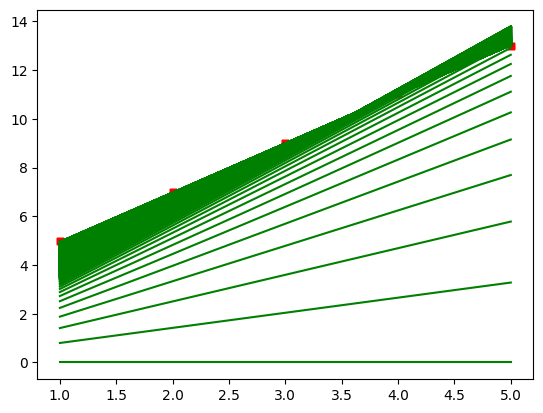

In [ ]:
%matplotlib inline
def gradient_descent(x,y):
  w_curr = b_curr = 0
  iterations = 1000
  n=len(x)
  learning_rate = 0.01
  plt.scatter(x,y,color='red',marker='+',linewidth=5)
  for i in range(iterations+1):
    y_predicted = w_curr * x + b_curr # y = wx+b
    # Plot the new predicted line
    plt.plot(x,y_predicted,color='green')
    cost = (1/n) * sum([val**2 for val in (y-y_predicted)])
    w_derivative = -(2/n)*sum(x*(y-y_predicted))
    b_derivative = -(2/n)*sum(y-y_predicted)
    w_curr = w_curr - learning_rate * w_derivative
    b_curr = b_curr - learning_rate * b_derivative
    #print("w {}, b {}, cost {}, iteration {}".format(w_curr,b_curr,cost,i))


x = np.array([1,2,3,4,5])
y = np.array([5,7,9,11,13])

gradient_descent(x,y)

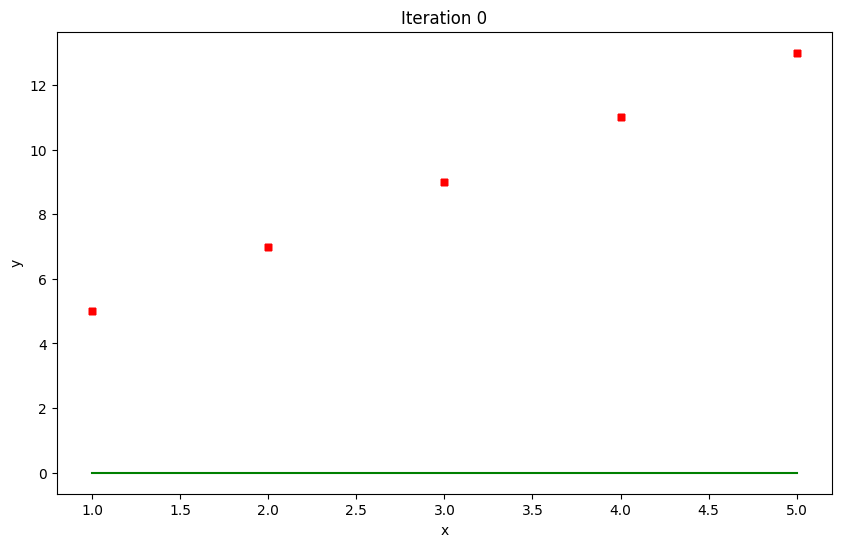

Iteration 0: w = 0.62, b = 0.18, cost = 89.0


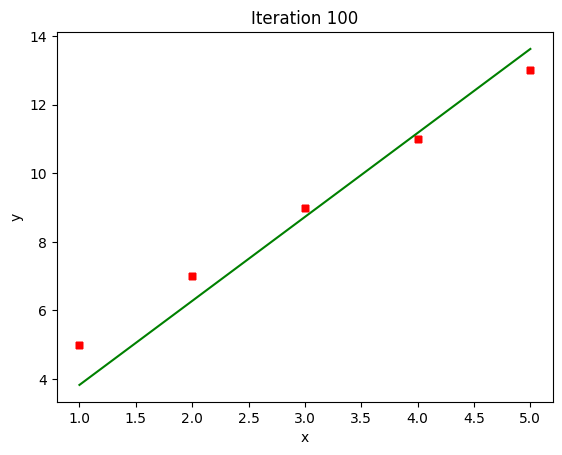

Iteration 100: w = 2.4469521472074027, b = 1.3863609314182666, cost = 0.4771638970482712


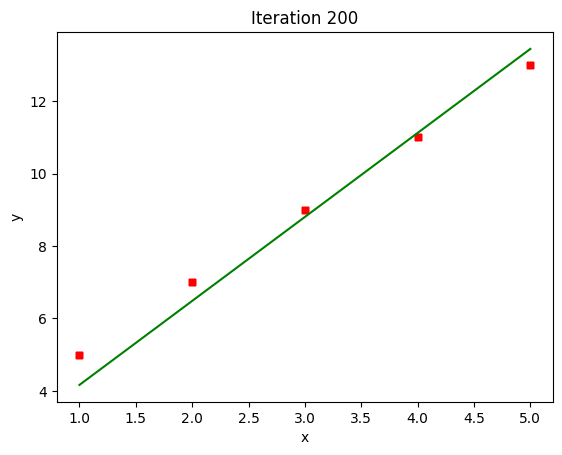

Iteration 200: w = 2.318550968403369, b = 1.8499299283889075, cost = 0.24238368296104512


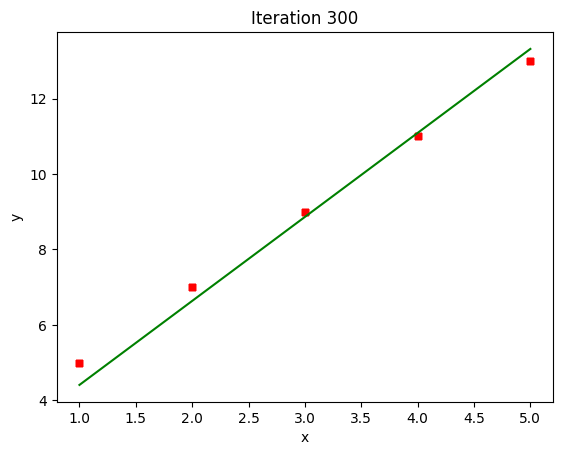

Iteration 300: w = 2.227037100288903, b = 2.1803240294752406, cost = 0.12312299846905057


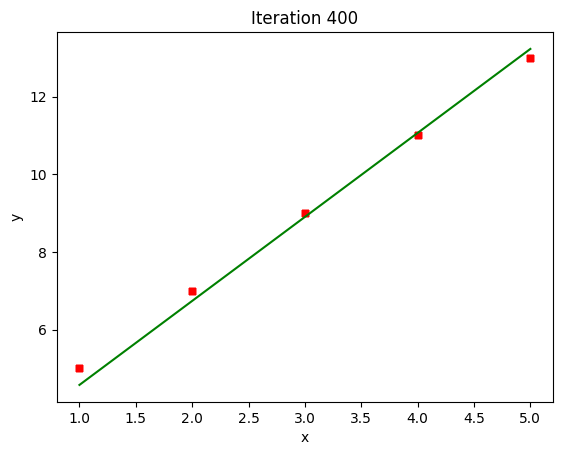

Iteration 400: w = 2.1618134930367656, b = 2.4158019469939687, cost = 0.06254246394319472


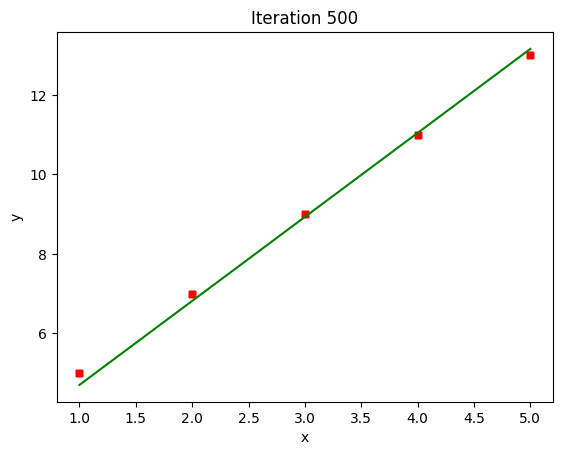

Iteration 500: w = 2.115327435451919, b = 2.5836313648214624, cost = 0.031769530020575504


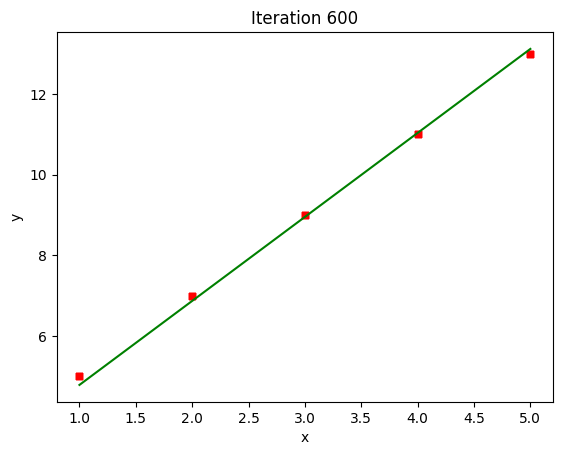

Iteration 600: w = 2.082195972154773, b = 2.703246459880537, cost = 0.016137884152517098


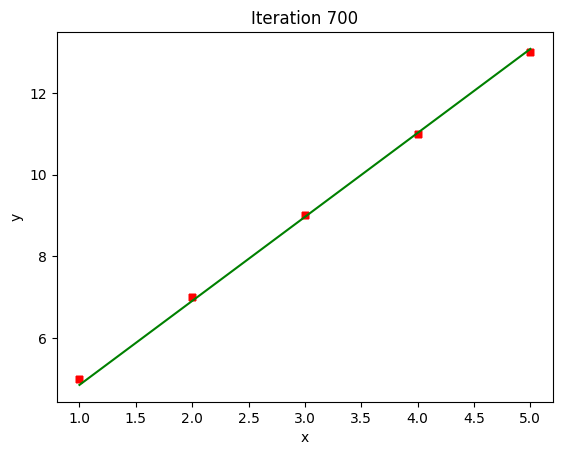

Iteration 700: w = 2.058582572412138, b = 2.788498325442612, cost = 0.008197518337583162


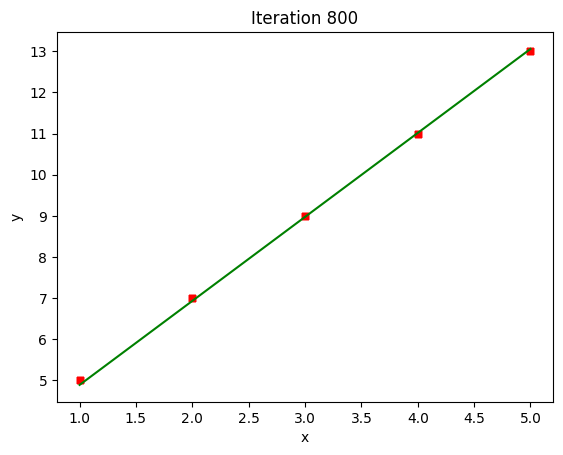

Iteration 800: w = 2.0417528706146477, b = 2.8492588889670167, cost = 0.004164071712246711


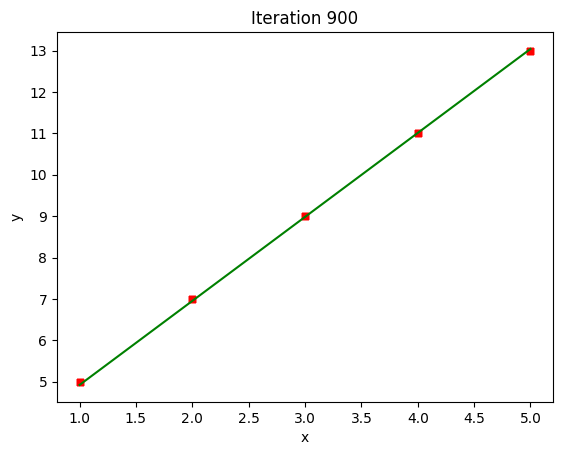

Iteration 900: w = 2.029758034391168, b = 2.8925640536747035, cost = 0.002115212496108267


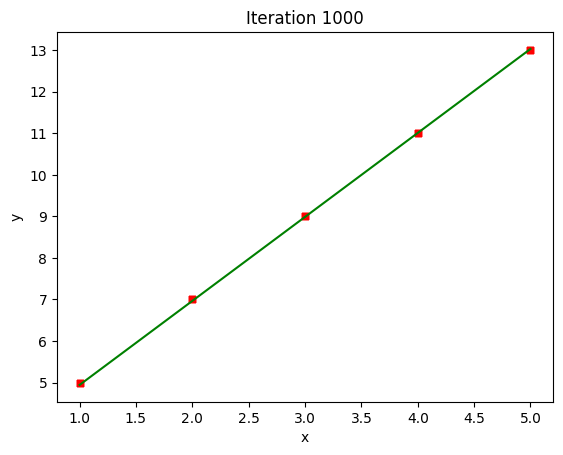

Iteration 1000: w = 2.021209095273925, b = 2.9234284364516427, cost = 0.001074458898134308


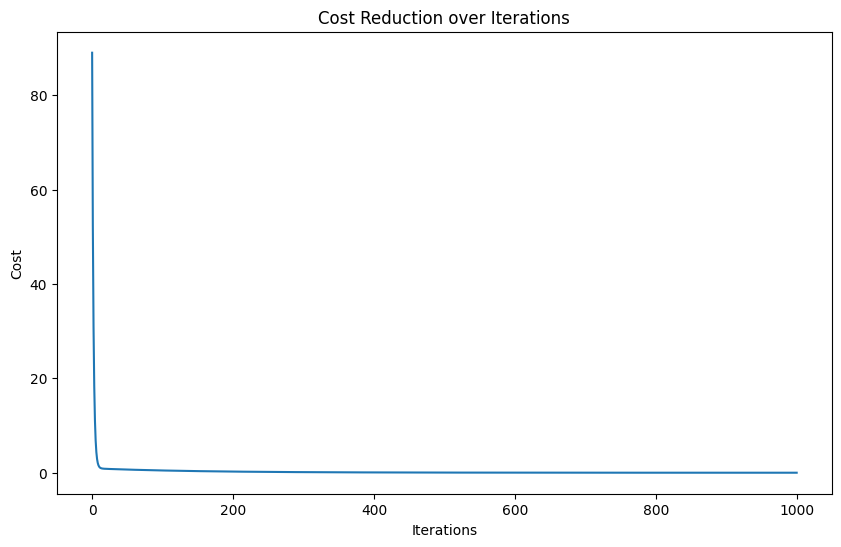

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def gradient_descent(x, y):
    w_curr = b_curr = 0
    iterations = 1000
    n = len(x)
    learning_rate = 0.01
    costs = []
    plt.figure(figsize=(10, 6))
    for i in range(iterations + 1):
        y_predicted = w_curr * x + b_curr
        cost = (1 / n) * sum([val ** 2 for val in (y - y_predicted)])
        costs.append(cost)
        w_derivative = -(2 / n) * sum(x * (y - y_predicted))
        b_derivative = -(2 / n) * sum(y - y_predicted)
        w_curr = w_curr - learning_rate * w_derivative
        b_curr = b_curr - learning_rate * b_derivative

        # Plotting the fitted line every 100 iterations
        if i % 100 == 0:
            plt.scatter(x, y, color='red', marker='+', linewidth=5)
            plt.plot(x, y_predicted, color='green')
            plt.title(f"Iteration {i}")
            plt.xlabel('x')
            plt.ylabel('y')
            plt.show()
            print(f"Iteration {i}: w = {w_curr}, b = {b_curr}, cost = {cost}")
    # Plot the loss function
    plt.figure(figsize=(10, 6))
    plt.plot(range(iterations + 1), costs)
    plt.title('Cost Reduction over Iterations')
    plt.xlabel('Iterations')
    plt.ylabel('Cost')
    plt.show()

x = np.array([1, 2, 3, 4, 5])
y = np.array([5, 7, 9, 11, 13])

gradient_descent(x, y)




>**Using Pytorch Version**





In [ ]:
import torch

In [ ]:
import random

In [ ]:
# features shape is (n,p) labels shape is (p,1)
def data_iter(batch_size, features, labels):
# data_iter is a data generator function used to generate small batches of data
# from the input features and labels according to batch_size

    num_features = len(features) # Calculate sample size

    indices = list(range(num_features))  # Generate a list of indexes from 0 to num_num_features-1

    random.shuffle(indices)  # shuffle indexs, random sample
    for i in range(0, num_features, batch_size): # Batch processing by batch_size

        batch_indices = torch.tensor(indices[i:min(i + batch_size, num_features)]) # Get an index for each batch

        yield features[batch_indices], labels[batch_indices] # Returns the features and labels of the batch


In [ ]:
w = torch.normal(0, 0.01, size=(p, 1), requires_grad=True)
# Initialize the weight vector as random values that follow a normal distribution
# with mean 0 and standard deviation 0.01 and shape (p, 1).
# requires_grad=True indicates that these weights are required to compute gradients

b = torch.zeros(1, requires_grad=True)
#Bias as 0，and trainable params

In [ ]:
for epoch in range(num_epochs):
    for X, y in data_iter(batch_size, features, labels): # Generate small batches of x and y with data_iter

        y_hat = X @ w + b  # Predicted values from linear regression models

        loss = ((y_hat - y) ** 2 / 2).mean()  # MSE
        loss.backward()  # Backprop

        for param in [w, b]:
            param -= learning_rate * param.grad  # GD to update params
            param.grad.zero_()


In [ ]:
import torch
import random

# Data generator
def data_iter(batch_size, features, labels):
    num_examples = len(features)
    indices = list(range(num_examples))
    random.shuffle(indices)  # shuffle indexs, random sample
    for i in range(0, num_examples, batch_size):
        batch_indices = torch.tensor(indices[i:min(i + batch_size, num_examples)])
        yield features[batch_indices], labels[batch_indices]

# Lienar Regression
def linreg(X, w, b):
    return X @ w + b


def squared_loss(y_hat, y):
    return ((y_hat - y.view(y_hat.size())) ** 2) / 2  # MSE


batch_size = 10
learning_rate = 0.03
num_epochs = 3

# Initialize the weights and bias
w = torch.normal(0, 0.01, size=(2, 1), requires_grad=True)  # Input Dimension set to 2
b = torch.zeros(1, requires_grad=True)

#
true_w = torch.tensor([2, -3.4])
true_b = 4.2
features = torch.randn(1000, 2)
labels = true_w[0] * features[:, 0] + true_w[1] * features[:, 1] + true_b
labels += torch.randn(labels.shape) * 0.01  # Noise


for epoch in range(num_epochs):
    for X, y in data_iter(batch_size, features, labels):
        y_hat = linreg(X, w, b)
        loss = squared_loss(y_hat, y).mean()
        loss.backward()

        with torch.no_grad():  # Do not calculate while updating
            w -= learning_rate * w.grad
            b -= learning_rate * b.grad
            w.grad.zero_()
            b.grad.zero_()

    print(f'epoch {epoch + 1}, loss {loss.item():.6f}')


epoch 1, loss 0.036846
epoch 2, loss 0.000079
epoch 3, loss 0.000029



## Saving Model



In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/homeprices.csv')

In [ ]:
model = LinearRegression()
model.fit(df[['area']],df.price)

LinearRegression()

In [ ]:
model.coef_

array([135.78767123])

In [ ]:
model.intercept_

180616.43835616432

In [ ]:
model.predict(pd.DataFrame([[5000]], columns=['area']))

array([859554.79452055])

In [ ]:
import pickle

In [ ]:
with open('model_pickle','wb') as f:
  pickle.dump(model,f)

In [ ]:
mmm = pickle.load(open('model_pickle','rb'))

In [ ]:
mmm.predict(pd.DataFrame([[5000]], columns=['area']))

array([859554.79452055])

In [ ]:
import joblib

In [ ]:
joblib.dump(model,'model_joblib')

['model_joblib']

In [ ]:
mj = joblib.load('model_joblib')

In [ ]:
mj.predict(pd.DataFrame([[5000]], columns=['area']))

array([859554.79452055])

## Dummy Variable and One Hot Encoding

**Categorical Variables**


*   *Nominal*

No relationship between each other

e.g. green, red, blue, ...

*   *Ordinal*

E.g. High, medium, low


One Hot Encoding:

Green -> [1,0,0]

Red -> [0,1,0]

Blue -> [0,0,1]


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/homeprice.csv')
df

,town,area,price
0,monroe township,2600,550000
1,monroe township,3000,565000
2,monroe township,3200,610000
3,monroe township,3600,680000
4,monroe township,4000,725000
5,west windsor,2600,585000
6,west windsor,2800,615000
7,west windsor,3300,650000
8,west windsor,3600,710000
9,robinsville,2600,575000


In [ ]:
dummies = pd.get_dummies(df.town).astype(int)
dummies

,monroe township,robinsville,west windsor
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0
5,0,0,1
6,0,0,1
7,0,0,1
8,0,0,1
9,0,1,0


In [ ]:
merged = pd.concat([df,dummies],axis='columns')
#merged = pd.concat([df, dummies], axis=1) same result with axis = columns
merged

,town,area,price,monroe township,robinsville,west windsor
0,monroe township,2600,550000,1,0,0
1,monroe township,3000,565000,1,0,0
2,monroe township,3200,610000,1,0,0
3,monroe township,3600,680000,1,0,0
4,monroe township,4000,725000,1,0,0
5,west windsor,2600,585000,0,0,1
6,west windsor,2800,615000,0,0,1
7,west windsor,3300,650000,0,0,1
8,west windsor,3600,710000,0,0,1
9,robinsville,2600,575000,0,1,0


In [ ]:
merged.drop(['town','west windsor'],axis='columns',inplace=True) #dummy variable trap
# which means it introduces multi-co-linear problem, so that the data has too much relationship between
# will affect the performance of the model
merged

,area,price,monroe township,robinsville
0,2600,550000,1,0
1,3000,565000,1,0
2,3200,610000,1,0
3,3600,680000,1,0
4,4000,725000,1,0
5,2600,585000,0,0
6,2800,615000,0,0
7,3300,650000,0,0
8,3600,710000,0,0
9,2600,575000,0,1


In [ ]:
X = merged.drop('price',axis='columns')
X

,area,monroe township,robinsville
0,2600,1,0
1,3000,1,0
2,3200,1,0
3,3600,1,0
4,4000,1,0
5,2600,0,0
6,2800,0,0
7,3300,0,0
8,3600,0,0
9,2600,0,1


In [ ]:
y = merged.price
y

,price
0,550000
1,565000
2,610000
3,680000
4,725000
5,585000
6,615000
7,650000
8,710000
9,575000


In [ ]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X,y)

LinearRegression()

In [ ]:
model.predict([[2800,0,1]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([590775.63964739])

In [ ]:
model.predict(pd.DataFrame([[2800,0,1]], columns=['area','monroe township','robinsville']))

array([590775.63964739])

In [ ]:
model.score(X,y)

0.9573929037221872

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [ ]:
dfle = df
dfle.town = le.fit_transform(dfle.town)

In [ ]:
dfle

,town,area,price
0,0,2600,550000
1,0,3000,565000
2,0,3200,610000
3,0,3600,680000
4,0,4000,725000
5,2,2600,585000
6,2,2800,615000
7,2,3300,650000
8,2,3600,710000
9,1,2600,575000


In [ ]:
X = dfle[['town','area']].values
X

array([[   0, 2600],
       [   0, 3000],
       [   0, 3200],
       [   0, 3600],
       [   0, 4000],
       [   2, 2600],
       [   2, 2800],
       [   2, 3300],
       [   2, 3600],
       [   1, 2600],
       [   1, 2900],
       [   1, 3100],
       [   1, 3600]])

In [ ]:
y = dfle.price
y

,price
0,550000
1,565000
2,610000
3,680000
4,725000
5,585000
6,615000
7,650000
8,710000
9,575000


In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
ct = ColumnTransformer([('town', OneHotEncoder(), [0])], remainder = 'passthrough')

In [ ]:
X = ct.fit_transform(X)
X

array([[1.0e+00, 0.0e+00, 0.0e+00, 2.6e+03],
       [1.0e+00, 0.0e+00, 0.0e+00, 3.0e+03],
       [1.0e+00, 0.0e+00, 0.0e+00, 3.2e+03],
       [1.0e+00, 0.0e+00, 0.0e+00, 3.6e+03],
       [1.0e+00, 0.0e+00, 0.0e+00, 4.0e+03],
       [0.0e+00, 0.0e+00, 1.0e+00, 2.6e+03],
       [0.0e+00, 0.0e+00, 1.0e+00, 2.8e+03],
       [0.0e+00, 0.0e+00, 1.0e+00, 3.3e+03],
       [0.0e+00, 0.0e+00, 1.0e+00, 3.6e+03],
       [0.0e+00, 1.0e+00, 0.0e+00, 2.6e+03],
       [0.0e+00, 1.0e+00, 0.0e+00, 2.9e+03],
       [0.0e+00, 1.0e+00, 0.0e+00, 3.1e+03],
       [0.0e+00, 1.0e+00, 0.0e+00, 3.6e+03]])

In [ ]:
X = X[:,1:] # drop one column as well
X

array([[0.0e+00, 0.0e+00, 2.6e+03],
       [0.0e+00, 0.0e+00, 3.0e+03],
       [0.0e+00, 0.0e+00, 3.2e+03],
       [0.0e+00, 0.0e+00, 3.6e+03],
       [0.0e+00, 0.0e+00, 4.0e+03],
       [0.0e+00, 1.0e+00, 2.6e+03],
       [0.0e+00, 1.0e+00, 2.8e+03],
       [0.0e+00, 1.0e+00, 3.3e+03],
       [0.0e+00, 1.0e+00, 3.6e+03],
       [1.0e+00, 0.0e+00, 2.6e+03],
       [1.0e+00, 0.0e+00, 2.9e+03],
       [1.0e+00, 0.0e+00, 3.1e+03],
       [1.0e+00, 0.0e+00, 3.6e+03]])

In [ ]:
model.fit(X,y)

LinearRegression()

In [ ]:
model.predict([[1,0,2800]])

array([590775.63964739])

In [ ]:
model.predict([[0,1,3400]])

array([681241.6684584])



---
Exercise:

Mercedez Benz 4 yr old , 45000

BMW 7 yr old, 86000

Accuracy




In [ ]:
exx = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/carprices.csv')
exx

,Car Model,Mileage,Sell Price($),Age(yrs)
0,BMW X5,69000,18000,6
1,BMW X5,35000,34000,3
2,BMW X5,57000,26100,5
3,BMW X5,22500,40000,2
4,BMW X5,46000,31500,4
5,Audi A5,59000,29400,5
6,Audi A5,52000,32000,5
7,Audi A5,72000,19300,6
8,Audi A5,91000,12000,8
9,Mercedez Benz C class,67000,22000,6


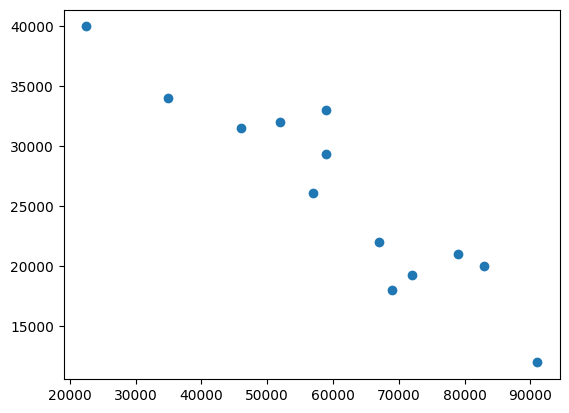

In [ ]:
plt.scatter(exx.Mileage,exx['Sell Price($)'])

In [ ]:
dummy = pd.get_dummies(exx['Car Model']).astype(int)
dummy

,Audi A5,BMW X5,Mercedez Benz C class
0,0,1,0
1,0,1,0
2,0,1,0
3,0,1,0
4,0,1,0
5,1,0,0
6,1,0,0
7,1,0,0
8,1,0,0
9,0,0,1


In [ ]:
merged = pd.concat([exx,dummy],axis='columns')
merged

,Car Model,Mileage,Sell Price($),Age(yrs),Audi A5,BMW X5,Mercedez Benz C class
0,BMW X5,69000,18000,6,0,1,0
1,BMW X5,35000,34000,3,0,1,0
2,BMW X5,57000,26100,5,0,1,0
3,BMW X5,22500,40000,2,0,1,0
4,BMW X5,46000,31500,4,0,1,0
5,Audi A5,59000,29400,5,1,0,0
6,Audi A5,52000,32000,5,1,0,0
7,Audi A5,72000,19300,6,1,0,0
8,Audi A5,91000,12000,8,1,0,0
9,Mercedez Benz C class,67000,22000,6,0,0,1


In [ ]:
final = merged.drop(['Car Model','Mercedez Benz C class'],axis='columns')
final

,Mileage,Sell Price($),Age(yrs),Audi A5,BMW X5
0,69000,18000,6,0,1
1,35000,34000,3,0,1
2,57000,26100,5,0,1
3,22500,40000,2,0,1
4,46000,31500,4,0,1
5,59000,29400,5,1,0
6,52000,32000,5,1,0
7,72000,19300,6,1,0
8,91000,12000,8,1,0
9,67000,22000,6,0,0


In [ ]:
X = final.drop('Sell Price($)',axis='columns')
X

,Mileage,Age(yrs),Audi A5,BMW X5
0,69000,6,0,1
1,35000,3,0,1
2,57000,5,0,1
3,22500,2,0,1
4,46000,4,0,1
5,59000,5,1,0
6,52000,5,1,0
7,72000,6,1,0
8,91000,8,1,0
9,67000,6,0,0


In [ ]:
y = final['Sell Price($)']
y

,Sell Price($)
0,18000
1,34000
2,26100
3,40000
4,31500
5,29400
6,32000
7,19300
8,12000
9,22000


In [ ]:
model = LinearRegression()
model.fit(X,y)

LinearRegression()

In [ ]:
model.predict([[45000,4,0,0]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([36991.31721061])

In [ ]:
model.predict([[86000,7,0,1]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([11080.74313219])

In [ ]:
model.score(X,y)

0.9417050937281082

## Logistic Regression

 $ \ sigmoid(z) = \frac{1}{1 + e^{-z}} $ ~ (0,1)

 $ \ y = \frac{1}{1 + e^{-(m*x+b)}} $



In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/insurance_data.csv')

In [ ]:
df.head()

,age,bought_insurance
0,22,0
1,25,0
2,47,1
3,52,0
4,46,1


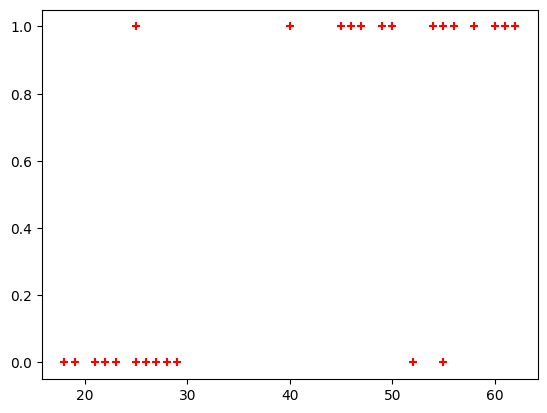

In [ ]:
plt.scatter(df.age,df.bought_insurance,marker='+',color='red')

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(df[['age']],df.bought_insurance,train_size=0.8)

In [ ]:
model = LogisticRegression()
model.fit(X_train,y_train)

LogisticRegression()

In [ ]:
X_test

,age
19,18
4,46
21,26
6,55
5,56
8,62


In [ ]:
model.predict(X_test)

array([0, 1, 0, 1, 1, 1])

In [ ]:
model.score(X_test,y_test)

0.8333333333333334

In [ ]:
model.predict_proba(X_test)
# [P(0),P(1)]

array([[0.95012771, 0.04987229],
       [0.18753511, 0.81246489],
       [0.84372455, 0.15627545],
       [0.05291774, 0.94708226],
       [0.04555268, 0.95444732],
       [0.01820017, 0.98179983]])

In [ ]:
model.predict([[25]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


array([0])

In [ ]:
hr = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/HR_comma_sep.csv')

In [ ]:
hr.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


In [ ]:
left = hr[hr.left==1]
left.shape

(3571, 10)

In [ ]:
retained = hr[hr.left==0]
retained.shape

(11428, 10)

In [ ]:
hr.groupby('left').mean(numeric_only=True) # set numeric_only to True to calculate the mean of only numeric columns

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years
left,,,,,,,
0,0.666810,0.715473,3.786664,199.060203,3.380032,0.175009,0.026251
1,0.440098,0.718113,3.855503,207.419210,3.876505,0.047326,0.005321


<Axes: xlabel='salary'>

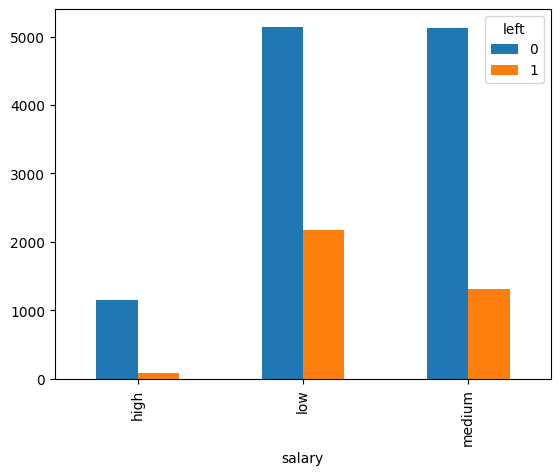

In [ ]:
pd.crosstab(hr.salary,hr.left).plot(kind='bar')

<Axes: xlabel='Department'>

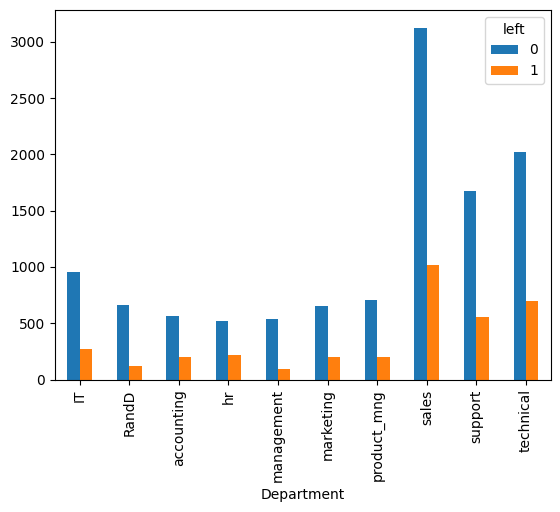

In [ ]:
pd.crosstab(hr.Department,hr.left).plot(kind='bar')

In [ ]:
subhr = hr[['satisfaction_level','average_montly_hours','promotion_last_5years','salary']]
subhr.head()

,satisfaction_level,average_montly_hours,promotion_last_5years,salary
0,0.38,157,0,low
1,0.80,262,0,medium
2,0.11,272,0,medium
3,0.72,223,0,low
4,0.37,159,0,low


In [ ]:
salary_dummies = pd.get_dummies(subhr.salary,prefix='salary').astype(int)
hr_with_dummies = pd.concat([subhr,salary_dummies],axis='columns')
hr_with_dummies.head()

,satisfaction_level,average_montly_hours,promotion_last_5years,salary,salary_high,salary_low,salary_medium
0,0.38,157,0,low,0,1,0
1,0.80,262,0,medium,0,0,1
2,0.11,272,0,medium,0,0,1
3,0.72,223,0,low,0,1,0
4,0.37,159,0,low,0,1,0


In [ ]:
hr_with_dummies.drop('salary',axis='columns',inplace=True)
hr_with_dummies.head()

,satisfaction_level,average_montly_hours,promotion_last_5years,salary_high,salary_low,salary_medium
0,0.38,157,0,0,1,0
1,0.80,262,0,0,0,1
2,0.11,272,0,0,0,1
3,0.72,223,0,0,1,0
4,0.37,159,0,0,1,0


In [ ]:
X = hr_with_dummies
y = hr.left

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,train_size=0.3)

In [ ]:
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [ ]:
model.predict(X_test)

array([1, 1, 1, ..., 0, 0, 0])

In [ ]:
model.score(X_test,y_test)

0.7761904761904762



---
### Multiclass


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

from sklearn.datasets import load_digits

In [ ]:
digits = load_digits()

In [ ]:
dir(digits)

['DESCR', 'data', 'feature_names', 'frame', 'images', 'target', 'target_names']

In [ ]:
digits.data[0]

array([ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.,  0.,  0., 13., 15., 10.,
       15.,  5.,  0.,  0.,  3., 15.,  2.,  0., 11.,  8.,  0.,  0.,  4.,
       12.,  0.,  0.,  8.,  8.,  0.,  0.,  5.,  8.,  0.,  0.,  9.,  8.,
        0.,  0.,  4., 11.,  0.,  1., 12.,  7.,  0.,  0.,  2., 14.,  5.,
       10., 12.,  0.,  0.,  0.,  0.,  6., 13., 10.,  0.,  0.,  0.])

<Figure size 640x480 with 0 Axes>

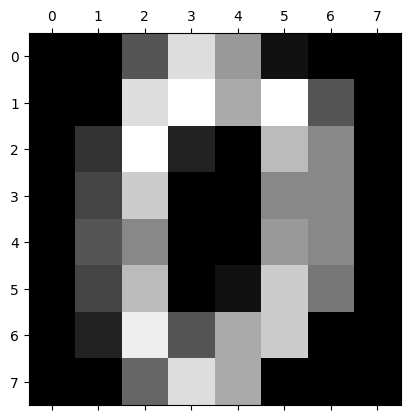

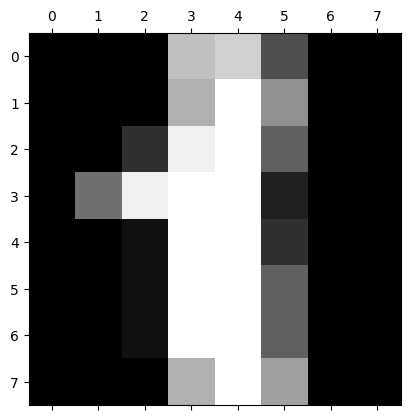

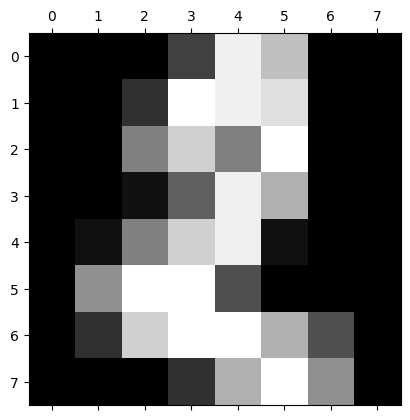

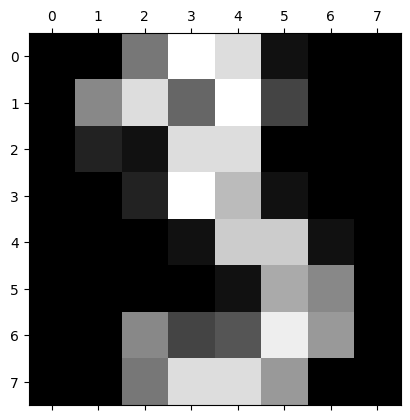

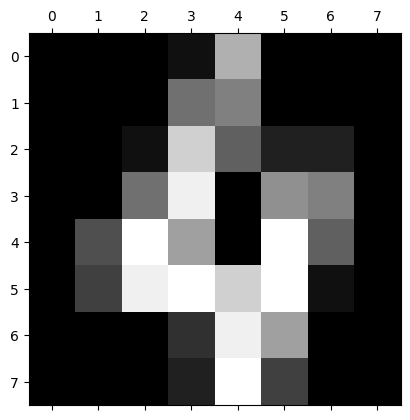

In [ ]:
plt.gray()
for i in range(5):
  plt.matshow(digits.images[i])

In [ ]:
digits.target[0:5]

array([0, 1, 2, 3, 4])

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(digits.data,digits.target,test_size=0.2)

In [ ]:
len(X_train)

1437

In [ ]:
len(X_test)

360

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
model.score(X_test, y_test)

0.9694444444444444

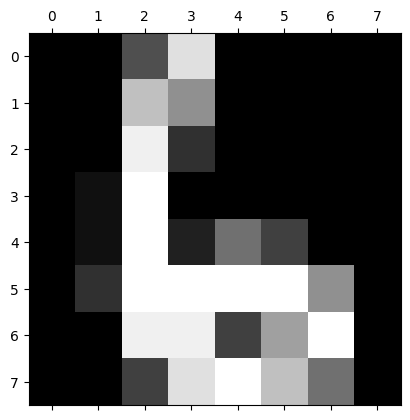

In [ ]:
plt.matshow(digits.images[67])

In [ ]:
digits.target[67]

6

In [ ]:
model.predict(digits.data[67].reshape(1,-1))

array([6])

In [ ]:
model.predict(digits.data[0:5])

array([0, 1, 2, 3, 4])

In [ ]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
y_pred = model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
cm

array([[36,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 34,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  1, 39,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0, 32,  0,  1,  0,  0,  1,  0],
       [ 0,  0,  0,  0, 36,  0,  1,  0,  0,  2],
       [ 0,  0,  0,  0,  0, 26,  0,  0,  0,  1],
       [ 0,  0,  0,  0,  0,  0, 38,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 36,  0,  2],
       [ 0,  1,  0,  0,  0,  0,  0,  0, 42,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  1, 30]])

Text(95.72222222222221, 0.5, 'Truth')

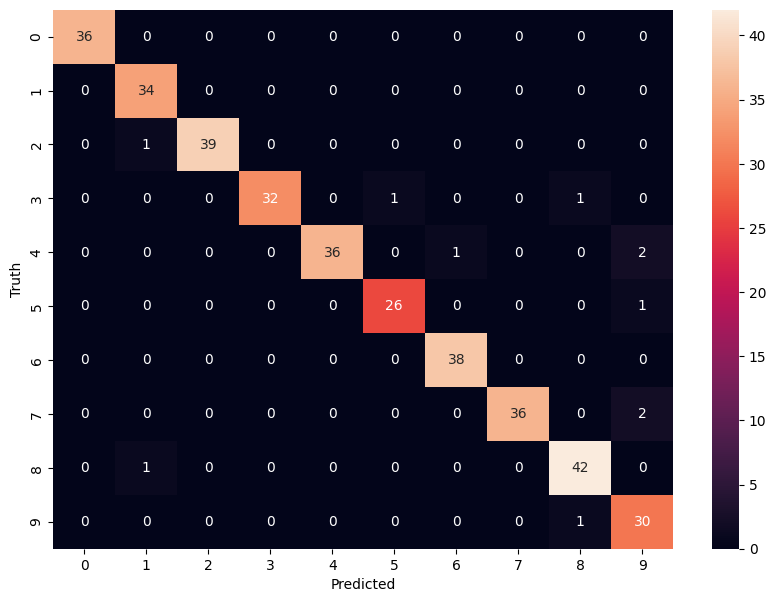

In [ ]:
import seaborn as sn
plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

For example, this heat map shows the error that model makes:
For number 8 which is Truth value, and the model predicted as 2, the prob of happenning is 1.




---

Exercise:

Use sklearn.datasets iris flower dataset to train your model using logistic regression. You need to figure out accuracy
of your model and use that to predict different samples in your test dataset. In iris dataset there are 150 samples containing following features,

1. Sepal Length
2. Sepal Width
3. Petal Length
4. Petal Width

Using above 4 features you will clasify a flower in one of the three categories,

1. Setosa
2. Versicolour
3. Virginica

## Newton's Method

Newton's Method is an Approxation Method to find the root of the function

(In ML, it is used to find the way to minize $ 𝓵(\theta)$ of Θ)

* Quadratic convergence, faster than Bisection Method
* Requires fewer convergence

**Newton's Method for Multivariable Functions**

Compared to the univariate case, the Taylor expansion for multivariable functions is more complex, and it involves the second-order partial derivatives forming the Hessian matrix.

**Hessian Matrix**

$$
H(f) = \begin{pmatrix}
\frac{\partial^2 f}{\partial x_1^2} & \frac{\partial^2 f}{\partial x_1 \partial x_2} & \cdots & \frac{\partial^2 f}{\partial x_1 \partial x_n} \\
\frac{\partial^2 f}{\partial x_2 \partial x_1} & \frac{\partial^2 f}{\partial x_2^2} & \cdots & \frac{\partial^2 f}{\partial x_2 \partial x_n} \\
\vdots & \vdots & \ddots & \vdots \\
\frac{\partial^2 f}{\partial x_n \partial x_1} & \frac{\partial^2 f}{\partial x_n \partial x_2} & \cdots & \frac{\partial^2 f}{\partial x_n^2}
\end{pmatrix} \in \mathbb{R}^{N \times N}
$$





Note:
  * If the dimension is huge, the copmputation work is relatively large

Solution Steps

The Newton's method for a one-dimensional case can be extended to the multivariable case as follows:

$$
x_{k+1} = x_k - H_k^{-1} \nabla f(x_k)
$$

Where $H(x) $ is the Hessian matrix of$ f(x)$.

1. Set the initial point $ x_0 $
2. Calculate $ \nabla f(x_k) $. If the gradient is zero, stop.
3. Calculate $ H_k $ and set $ x_{k+1} = x_k - H_k^{-1} \nabla f(x_k)$
4. Set $ k = k + 1 $ and repeat step 2


Newton's method is essentially using a quadratic curve to approximate the local curvature of your current position, whereas gradient descent uses a tangent plane to approximate the local curvature.


For a differentiable function, performing a Taylor expansion at a point allows the expansion to retain as many terms as needed. The closer to the curve in a local region, the better the approximation, but the corresponding computation becomes more significant. However, it allows more accurate estimates for distant points.


Example:

Using Newton's Method to Solve $f(x) = x^2 - C$ (where $x > 0$)


Equivalent to finding $\sqrt{C}$, the steps are as follows:

1. First, perform a first-order Taylor expansion of $f(x)$ at $x_k$ as follows:
   $$f(x) = f(x_k) + f'(x_k)(x - x_k)$$

2. Solve for the root of the equation:
   $$f(x_k) + f'(x_k)(x - x_k) = 0$$
   which gives:
   $$x = x_k - \frac{f(x_k)}{f'(x_k)}$$

3. The iterative formula is:
   $$x_{k+1} = x_k - \frac{f(x_k)}{f'(x_k)}$$

4. When the distance between $x_k$ and $x_{k+1}$ is sufficiently small
   (e.g., $  fabs(x_k - x_{k+1})< 1e-7$), we can consider the iteration complete.



In [ ]:
import math

def newton_sqrt(C, epsilon=1e-7):
    x0 = C
    while True:
        x1 = 0.5 * (x0 + C / x0)
        if abs(x1 - x0) < epsilon:
            break
        x0 = x1
    return x1

# Example usage
C = 25
result = newton_sqrt(C)
print(f"The square root of {C} is approximately {result}")

The square root of 25 is approximately 5.0


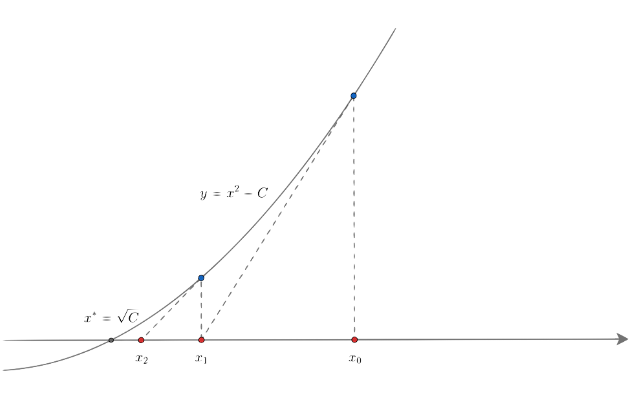

## Softmax

The Softmax function is defined as follows for a vector $\mathbf{z} = [z_1, z_2, \ldots, z_K]$:

$$
\sigma(z_i) = \frac{e^{z_i}}{\sum_{j=1}^{K} e^{z_j}} \quad \text{for } i = 1, 2, \ldots, K
$$

Where:
- $z_i$ is the raw score for class i
- $K$ is the total number of classes
- $\sigma(z_i)$ is the probability of class i after applying the Softmax function



Loss function or called Cross-entropy loss:
$$
ℓ(h(x),y) = - ∑_{j=1}^{k}p(label=h_{j}(x))logp(label=y)
$$
If using One-hot, normally we have
$$p(label=y)=1
$$
$$p(label=h(x))=0$$
$$
ℓ(h(x),y) = - logp(label=y) = -h_{y}(x)+log∑_{j=1}^{k}exp(h_{j}(x))
$$

Optimization:

We want to
$$
\text{minimize}_{\theta}\frac{1}{m}∑_{i=1}^{m}𝓵(h_{𝜃}(x^{(i)}),y^{(i)})
$$

We take $\frac{1}{m}∑_{i=1}^{m}𝓵(h_{𝜃}(x^{(i)}),y^{(i)})$ as $f(\theta)$ where f: $\mathbb{R}^{n \times k}$ → $\mathbb{R}$

$$
\nabla_{\theta} f(\theta) \in \mathbb{R}^{n \times k} =
\begin{bmatrix}
\frac{\partial f(\theta)}{\partial \theta_{11}} & \cdots & \frac{\partial f(\theta)}{\partial \theta_{1k}} \\
\vdots & \ddots & \vdots \\
\frac{\partial f(\theta)}{\partial \theta_{n1}} & \cdots & \frac{\partial f(\theta)}{\partial \theta_{nk}}
\end{bmatrix}
$$

gradient points in the direction that most increases f(locally)


To minimize a function, the **gradient descent** alogrithm proceeds by iteratively taking steps in the direction of the negative gradient

(where gradient always points in the most increases so we take the negative of gradient)

$$
\theta := \theta - \alpha \nabla_{\theta} f(\theta)
$$
Where $\alpha > 0 $ is a step size or *learning rate*

$$\nabla_{\theta} \ell_{ce}(h, y)=?$$
Recall
$$
ℓ(h(x),y) = -h_{y}(x)+log∑_{j=1}^{k}exp(h_{j}(x))
$$

$$
\frac{\partial \ell_{ce}(h, y)}{\partial h_i} = \frac{\partial}{\partial h_i} \left( -h_y + \log \sum_{j=1}^{k} \exp(h_j) \right)
$$
$$
= -𝓛\{i=y\} + \frac{\frac{\partial}{\partial h_i}(\sum_{j=1}^{k} \exp(h_j))}{\sum_{j=1}^{k} \exp(h_j)}
$$

$$
= -𝓛\{i=y\} + \frac{exp(h_j)}{\sum_{j=1}^{k} \exp(h_j)}
$$
$$
= -𝓛\{i=y\} + \frac{e^{z_j}}{\sum_{j=1}^{K} e^{z_j}}
$$
Where $-𝓛\{i=y\}$ is the indicator function equals to 1 as true value corresponding to predict value, otherwise 0

Simplify:


$$
\frac{\partial L}{\partial h_i} = - p_i + y_i
$$


- for true label $i = y$：
  $$
  \frac{\partial L}{\partial h_i} = y_i - 1
  $$
- others：
  $$
  \frac{\partial L}{\partial h_j} = y_j
  $$


**Example**:

Given the input mini-batch $ \{x^{(1)}, x^{(2)}, \ldots, x^{(m)}\}$:

   $$
   z^{[L]} =
   \begin{bmatrix}
   5 \\
   2 \\
   -1 \\
   3
   \end{bmatrix}
   $$
   $$
   t =
   \begin{bmatrix}
   e^5 \\
   e^2 \\
   e^{-1} \\
   e^3
   \end{bmatrix}
   $$


   $$
   a^{[L]} = g^{[L]}(z^{[L]}) =
   \begin{bmatrix}
   \frac{e^5}{e^5 + e^2 + e^{-1} + e^3} \\
   \frac{e^2}{e^5 + e^2 + e^{-1} + e^3} \\
   \frac{e^{-1}}{e^5 + e^2 + e^{-1} + e^3} \\
   \frac{e^3}{e^5 + e^2 + e^{-1} + e^3}
   \end{bmatrix} =
   \begin{bmatrix}
   0.842 \\
   0.042 \\
   0.002 \\
   0.114
   \end{bmatrix}
   $$

Where:
- $a^{[L]}$ represents the output probabilities after applying the Softmax function.


In [ ]:
!pip install d2l

      Successfully uninstalled matplotlib-3.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albucore 0.0.16 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
albumentations 1.4.15 requires numpy>=1.24.4, but you have numpy 1.23.5 which is incompatible.
bigframes 1.17.0 requires numpy>=1.24.0, but you have numpy 1.23.5 which is incompatible.
chex 0.1.86 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
google-colab 1.0.0 requires pandas==2.1.4, but you have pandas 2.0.3 which is incompatible.
google-colab 1.0.0 requires requests==2.32.3, but you have requests 2.31.0 which is incompatible.
mizani 0.11.4 requires pandas>=2.1.0, but you have pandas 2.0.3 which is incompatible.
pandas-stubs 2.1.4.231227 requires numpy>=1.26.0; python_version < "3.13", but you have numpy 1.23.5 which is incompatible.
plotnine 0.13.6 req

In [ ]:
%matplotlib inline
import torch
import torchvision
from torch.utils import data
from torchvision import transforms
from d2l import torch as d2l

d2l.use_svg_display()

In [ ]:
trans = transforms.ToTensor()

mnist_train = torchvision.datasets.FashionMNIST(
    root="../data", train=True, transform=trans, download=True)
mnist_test = torchvision.datasets.FashionMNIST(
    root="../data", train=False, transform=trans, download=True)

len(mnist_train), len(mnist_test)

100%|██████████| 26421880/26421880 [00:00<00:00, 115612735.57it/s]


Extracting ../data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ../data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 4655868.31it/s]


Extracting ../data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ../data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:00<00:00, 64086879.37it/s]


Extracting ../data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ../data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 12806807.23it/s]


Extracting ../data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ../data/FashionMNIST/raw



(60000, 10000)

In [ ]:
mnist_train[0][0].shape

torch.Size([1, 28, 28])

In [ ]:
def get_fashion_mnist_labels(labels):
    """Return text labels for the Fashion-MNIST dataset."""
    text_labels = ['t-shirt', 'trouser', 'pullover', 'dress', 'coat',
                   'sandal', 'shirt', 'sneaker', 'bag', 'ankle boot']
    return [text_labels[int(i)] for i in labels]

def show_images(imgs, num_rows, num_cols, titles=None, scale=1.5):
    """Plot a list of images."""
    figsize = (num_cols * scale, num_rows * scale)
    _, axes = d2l.plt.subplots(num_rows, num_cols, figsize=figsize)
    axes = axes.flatten()
    for i, (ax, img) in enumerate(zip(axes, imgs)):
        if torch.is_tensor(img):
            # Tensor Image
            ax.imshow(img.numpy())
        else:
            # PIL Image
            ax.imshow(img)


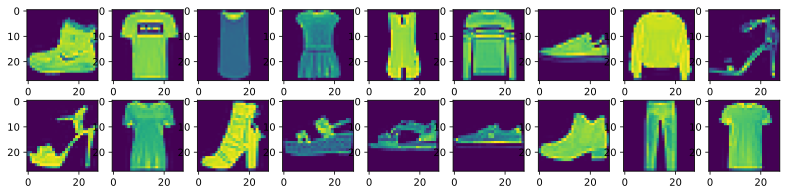

In [ ]:
X, y = next(iter(data.DataLoader(mnist_train, batch_size=18)))
show_images(X.reshape(18, 28, 28), 2, 9, titles=get_fashion_mnist_labels(y));

Test the time for loading data

In [ ]:
batch_size = 256

def get_dataloader_workers():
    """Use 4 processes to read the data."""
    return 4

train_iter = data.DataLoader(mnist_train, batch_size, shuffle=True,
                             num_workers=get_dataloader_workers())

timer = d2l.Timer()
for X, y in train_iter:
    continue
f'{timer.stop():.2f} sec'

'2.04 sec'

In [ ]:
def load_data_fashion_mnist(batch_size, resize=None):
    """Download the Fashion-MNIST dataset and then load it into memory."""
    trans = [transforms.ToTensor()]
    if resize:
        trans.insert(0, transforms.Resize(resize))
    trans = transforms.Compose(trans)
    mnist_train = torchvision.datasets.FashionMNIST(
        root="../data", train=True, transform=trans, download=True)
    mnist_test = torchvision.datasets.FashionMNIST(
        root="../data", train=False, transform=trans, download=True)
    return (data.DataLoader(mnist_train, batch_size, shuffle=True,
                            num_workers=get_dataloader_workers()),
            data.DataLoader(mnist_test, batch_size, shuffle=False,
                            num_workers=get_dataloader_workers()))

In [ ]:
import torch
from IPython import display
from d2l import torch as d2l

batch_size = 256
train_iter, test_iter = d2l.load_data_fashion_mnist(batch_size)

In [ ]:
number = 28*28
num_classes = 10

W = torch.normal(0, 0.01, size=(number, num_classes), requires_grad=True)
b = torch.zeros(num_classes, requires_grad=True)

In [ ]:
X = torch.tensor([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
X.sum(0, keepdim=True), X.sum(1, keepdim=True)

(tensor([[5., 7., 9.]]),
 tensor([[ 6.],
         [15.]]))

In [ ]:
def softmax(X):
    X_exp = torch.exp(X)
    partition = X_exp.sum(1, keepdim=True)
    return X_exp / partition  # The broadcasting mechanism is applied here

In [ ]:
def net(x):
  return softmax(torch.matmul(x.reshape(-1, W.shape[0]), W) + b)

In [ ]:
y = torch.tensor([0, 2])
y_hat = torch.tensor([[0.1, 0.3, 0.6], [0.3, 0.2, 0.5]])
y_hat[[0, 1], y] # [0,0] and [1,2]

tensor([0.1000, 0.5000])

In [ ]:
def cross_entropy(y_hat, y):
  return -torch.log(y_hat[range(len(y_hat)), y])

In [ ]:
cross_entropy(y_hat, y)

tensor([2.3026, 0.6931])

In [ ]:
def accuracy(y_hat, y):
  if len(y_hat.shape) > 1 and y_hat.shape[1] > 1:
    y_hat = y_hat.argmax(axis=1)
  cmp = y_hat.type(y.dtype) == y
  return float(cmp.type(y.dtype).sum())

accuracy(y_hat, y) / len(y)

0.5

In [ ]:
def evaluate_accuracy(net, data_iter):
  if isinstance(net, torch.nn.Module):
    net.eval()
  metric = Accumulator(2)
  for X, y in data_iter:
    metric.add(accuracy(net(X), y), y.numel())
  return metric[0] / metric[1]

In [ ]:
import torch.nn as nn
net = nn.Sequential(nn.Flatten(), nn.Linear(784, 10))

def init_weights(m):
  if type(m) == nn.Linear:
    nn.init.normal_(m.weight, std=0.01)

net.apply(init_weights);

In [ ]:
loss = nn.CrossEntropyLoss()
trainer = torch.optim.SGD(net.parameters(), lr=0.1)

In [ ]:
num_epochs = 10
d2l.train_ch3(net, train_iter, test_iter, loss, num_epochs, trainer)

## Decision Tree


Take a data, see which direction the data should go on the node, keep going down to the leaf node, you will get the label corresponding to the data

**Regression** with decision trees:

unlike the example above, the leaf node is not a specific class but a real value.



---


* **Pros and Cons：**

  - Pros:

    Can be interpreted (can give a view of the process of processing the data) [commonly used in the banking and insurance industry]

    Can deal with numerical and categorical classes of features;

  - Cons:

    Unstable (after some noise in the data, the whole tree may not look the same) [can be solved by using ensemble learning]

    Complexity of the data will generate a tree that is too complex, which can lead to overfitting (Pruning)

    Lots of judgment statements (too sequential), not good for parallelism [will suffer in terms of performance]





---



1. **Splitting Criteria**
- **Entropy** measures the impurity(Uncertainty) in a dataset:

  $$
  Entropy(S) = - \sum_{i=1}^{c} p_i \log_2 p_i
  $$

  - $p_i$: Proportion of class $i$ instances in the dataset $S$.
  - $c$: Number of classes.

  ps:  The dataset is completely pure (all instances belong to one class)

- **Information Gain** is the reduction in entropy after a dataset is split on an attribute:

  $$
  IG(S, A) = Entropy(S) - \sum_{v \in Values(A)} \frac{|S_v|}{|S|} Entropy(S_v)
  $$

  - $S_v$: Subset of $S$ where attribute $A$ has value $v$.

  Used primarily in the CART algorithm.

  Quantifies how much knowing the value of attribute A helps in predicting the class labels (how much A helps to reduce the total entropy)

  * IG-reduction, so maximize the reduction is to obtain the minimum gain for child node which optimize the final purity

- **Gini Impurity**:

  $$
  Gini(S) = 1 - \sum_{i=1}^{c} p_i^2
  $$

  - Measures the probability of incorrectly classifying a randomly chosen element.
  - The **smaller** the Gini Impurity, the **greater**
  
    (Impurity refers to how impure of a splitting)

    (By minimizing Gini impurity, the decision tree algorithm selects splits that increase the purity of the nodes, leading to better classification performance)


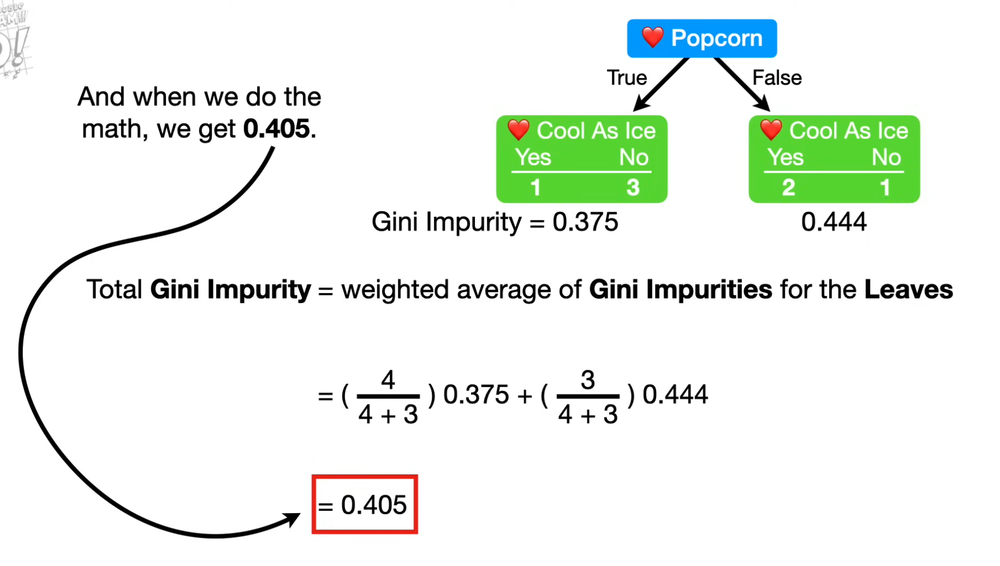

**Choose splits that minimize the variance within the subsets**

2. Tree Construction Algorithms
  1. ID3
    * Use **Information Gain** as splitting criteria
    
    * Entropy can be more sensitive to changes in the class probabilities, especially when classes are imbalanced and not able to better split trees
  
  2. CART (Classification and Regression Tree)
    * Use **Gini Impurity** for classification and **MSE** for regression
    * Binary Tree

3. Overfitting and Pruning

* Pre-Pruning

  Stopping criteria during tree construction:

  - Minimum **number of samples** required to split a node
  - Maximum **depth** of the tree
  - Minimum decrease in **impurity**


* Post-Pruning

  Prune the tree after it is fully grown

  - Cost Complexity Pruning: Balances the tree's complexity and its fit to the training data
  
    Tree Complexity Penalty:
$$
Tree \space Score = SSR + \alpha T
$$
  SSR: Sum of square residual
  - Reduced Error Pruning: Removes branches that do not contribute to the accuracy on a validation set

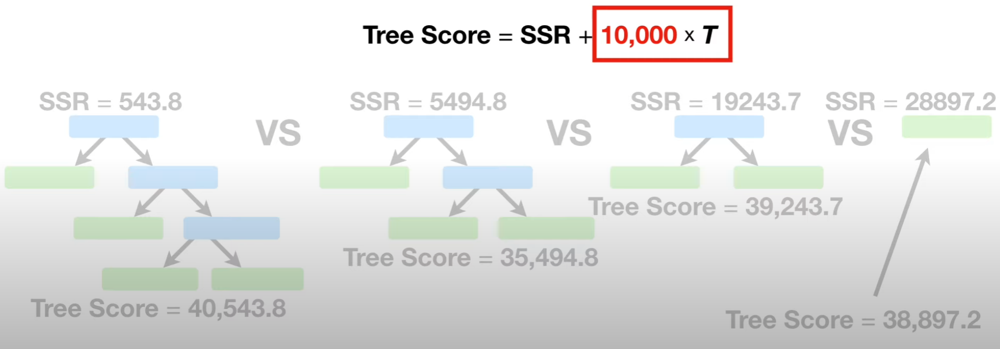

In [ ]:
def createTree(dataset,labels,featLabels):
  classList = [example[-1] for example in dataset]
  if classList.count(classList[0]) == len(classList):
  #check the predicted label are all equal or not
    return classList[0]
  if len(dataset[0])==1: # check the dataset has been iterate thoroughly
    return majorityCnt(classList)
  bestFeat = chooseBestFeat(dataset)
  bestFeatLabel = labels[bestFeat]
  featLabels.append(bestFeatLabel)
  myTree = {bestFeatLabel:{}}
  del labels[bestFeat] # after classification delete the column
  featValue = [example[bestFeat]for example in dataset]
  unique_value = set(featValue) # how many unique values the columns has
  for value in unique_value:
    sublabels = labels[:]
    myTree[bestFeatLabel][value] = createTree(splitDataset(dataset,bestFeat,value),sublabels,featLabels)

  return myTree

def majorityCnt(classList):
  classCount = {}
  for vote in classList:
    if vote not in classCount.keys():
      classCount[vote] = 0
    classCount[vote] += 1
  sortedClassCount = sorted(classCount.items(),key=operator.itemgetter(1),reverse=True)
  return sortedClassCount[0][0] # return the result that appears most frequently


def chooseBestFeat(dataset):
  numFeatures = len(dataset[0])-1
  baseEntropy = calcShannonEnt(dataset)
  bestInfoGain = 0.0
  bestFeature = -1
  for i in range(numFeatures):
    featList = [example[i] for example in dataset]
    uniqueVals = set(featList)
    newEntropy = 0.0
    for value in uniqueVals:
      subDataset = splitDataset(dataset,i,value)
      prob = len(subDataset)/float(len(dataset))
      newEntropy += prob*calcShannonEnt(subDataset)
  return bestFeature

def calcShannonEnt(dataset):
  numEntries = len(dataset)
  labelCounts = {}
  for featVec in dataset:
    currentLabel = featVec[-1]
    if currentLabel not in labelCounts.keys():
      labelCounts[currentLabel] = 0
    labelCounts[currentLabel] += 1
  shannonEnt = 0.0
  for key in labelCounts:
    prob = float(labelCounts[key])/numEntries
    shannonEnt -= prob*log(prob,2)
  return shannonEnt

def splitDataset(dataset,axis,value):
  retDataset = []
  for featVec in dataset:
    if featVec[axis] == value:
      reducedFeatVec = featVec[:axis]
      reducedFeatVec.extend(featVec[axis+1:])
      retDataset.append(reducedFeatVec)
  return retDataset



4. Optimization

  1. Ensemble Methods:

* Different Alogrithm

* Different Training

* Bagging and Random Forest (Variance)

    * Bagging(Bootstrap Aggregation)

      Train multiple trees on different subsets of the data and aggregate their predictions

    * Random Forest

      Training multiple decision trees to improve stability

      Each tree will be trained **independently** and after training these trees will act together to produce the result
      (Introduces **randomness** in feature selection)

      *For categorization, voting can be used (majority rule)*
      
      *For regression, the real value can be the result averaged over each tree*

      The randomization comes from the following two situations:

      Bagging：Sample some random samples out of the training set (put back, repeatable)

      e.g. [1,2,3,4,5]->[1,2,2,3,4]

      In the numbers that come out of bagging, some more features are randomly sampled out without using the whole feature

* Boosting (Bias)

  1. Boosting combines weak learners sequentially to form a strong learner (Each new tree focuses on correcting the errors of the previous trees)

    Sequentially complete training of multiple trees (previous is done independently)
    
  2. Use the residuals of the trained tree and the true value to train a new tree, and then add them to the previous tree after training.
    
    - Residuals are equivalent to taking an average mean square error (of the predicted value and the true value) and multiplying it by the gradient.
    
  * AdaBoost
    
      Initially, all data points have equal weights.

      At each iteration:

      Train a tree on the weighted data, increase weights of misclassified instances, final prediction is a weighted sum of the predictions.
  * Gradient Boosting Tree

  * LightGBM

  * XGBoost

* Stacking:
    
  Combines predictions from multiple models (could be different types) using a meta-model

  
   



---


The tree model is used more in industry

[simple, simple training algorithm, not too many hyperparameters, no need to adjust the parameter results are not bad]


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

In [ ]:
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.cleveland.data',header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0


In [ ]:
df.columns = ['age','sex','cp','restbp','chol','fbs','restecg','thalach','exang','oldpeak','slope','ca','thal','hd']
df.head()

,age,sex,cp,restbp,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,hd
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0


In [ ]:
df.isnull().sum()

,0
age,0
sex,0
cp,0
restbp,0
chol,0
fbs,0
restecg,0
thalach,0
exang,0
oldpeak,0


In [ ]:
df.dtypes

,0
age,float64
sex,float64
cp,float64
restbp,float64
chol,float64
fbs,float64
restecg,float64
thalach,float64
exang,float64
oldpeak,float64


In [ ]:
df.ca.unique(), df.thal.unique()

(array(['0.0', '3.0', '2.0', '1.0', '?'], dtype=object),
 array(['6.0', '3.0', '7.0', '?'], dtype=object))

In [ ]:
dff = df.loc[(df['ca']!='?')&(df['thal']!='?')]
len(dff)

297

In [ ]:
dff.ca.unique(), dff.thal.unique()

(array(['0.0', '3.0', '2.0', '1.0'], dtype=object),
 array(['6.0', '3.0', '7.0'], dtype=object))

In [ ]:
X = dff.drop('hd',axis='columns')
y = dff.hd

In [ ]:
X.dtypes

,0
age,float64
sex,float64
cp,float64
restbp,float64
chol,float64
fbs,float64
restecg,float64
thalach,float64
exang,float64
oldpeak,float64


In [ ]:
for c in dff.columns:
  print(c, dff[c].unique())

age [63. 67. 37. 41. 56. 62. 57. 53. 44. 52. 48. 54. 49. 64. 58. 60. 50. 66.
 43. 40. 69. 59. 42. 55. 61. 65. 71. 51. 46. 45. 39. 68. 47. 34. 35. 29.
 70. 77. 38. 74. 76.]
sex [1. 0.]
cp [1. 4. 3. 2.]
restbp [145. 160. 120. 130. 140. 172. 150. 110. 132. 117. 135. 112. 105. 124.
 125. 142. 128. 170. 155. 104. 180. 138. 108. 134. 122. 115. 118. 100.
 200.  94. 165. 102. 152. 101. 126. 174. 148. 178. 158. 192. 129. 144.
 123. 136. 146. 106. 156. 154. 114. 164.]
chol [233. 286. 229. 250. 204. 236. 268. 354. 254. 203. 192. 294. 256. 263.
 199. 168. 239. 275. 266. 211. 283. 284. 224. 206. 219. 340. 226. 247.
 167. 230. 335. 234. 177. 276. 353. 243. 225. 302. 212. 330. 175. 417.
 197. 198. 290. 253. 172. 273. 213. 305. 216. 304. 188. 282. 185. 232.
 326. 231. 269. 267. 248. 360. 258. 308. 245. 270. 208. 264. 321. 274.
 325. 235. 257. 164. 141. 252. 255. 201. 222. 260. 182. 303. 265. 309.
 307. 249. 186. 341. 183. 407. 217. 288. 220. 209. 227. 261. 174. 281.
 221. 205. 240. 289. 318. 298. 564.

In [ ]:
X_encoded = pd.get_dummies(dff, columns=['cp','restecg','slope','thal']).astype(float)
X_encoded.head()

,age,sex,restbp,chol,fbs,thalach,exang,oldpeak,ca,hd,...,cp_4.0,restecg_0.0,restecg_1.0,restecg_2.0,slope_1.0,slope_2.0,slope_3.0,thal_3.0,thal_6.0,thal_7.0
0,63.0,1.0,145.0,233.0,1.0,150.0,0.0,2.3,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
1,67.0,1.0,160.0,286.0,0.0,108.0,1.0,1.5,3.0,2.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
2,67.0,1.0,120.0,229.0,0.0,129.0,1.0,2.6,2.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
3,37.0,1.0,130.0,250.0,0.0,187.0,0.0,3.5,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,41.0,0.0,130.0,204.0,0.0,172.0,0.0,1.4,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0


In [ ]:
y.unique()

array([0, 2, 1, 3, 4])

In [ ]:
y = y.replace({2:1,3:1,4:1}) # replace 2,3,4 to 1
# y_notzero= y>0
# y[y_notzero]=1
y.unique()

array([0, 1])

In [ ]:
for col in X_encoded.columns:
    X_encoded[col] = pd.to_numeric(X_encoded[col], errors='coerce')

X_encoded.head()

,age,sex,restbp,chol,fbs,thalach,exang,oldpeak,ca,hd,...,cp_4.0,restecg_0.0,restecg_1.0,restecg_2.0,slope_1.0,slope_2.0,slope_3.0,thal_3.0,thal_6.0,thal_7.0
0,63.0,1.0,145.0,233.0,1.0,150.0,0.0,2.3,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
1,67.0,1.0,160.0,286.0,0.0,108.0,1.0,1.5,3.0,2.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
2,67.0,1.0,120.0,229.0,0.0,129.0,1.0,2.6,2.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
3,37.0,1.0,130.0,250.0,0.0,187.0,0.0,3.5,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,41.0,0.0,130.0,204.0,0.0,172.0,0.0,1.4,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0


In [ ]:
y.head()

,hd
0,0
1,1
2,1
3,0
4,0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_encoded,y,random_state=42)

clf = DecisionTreeClassifier(random_state=42)
clf = clf.fit(X_train,y_train)

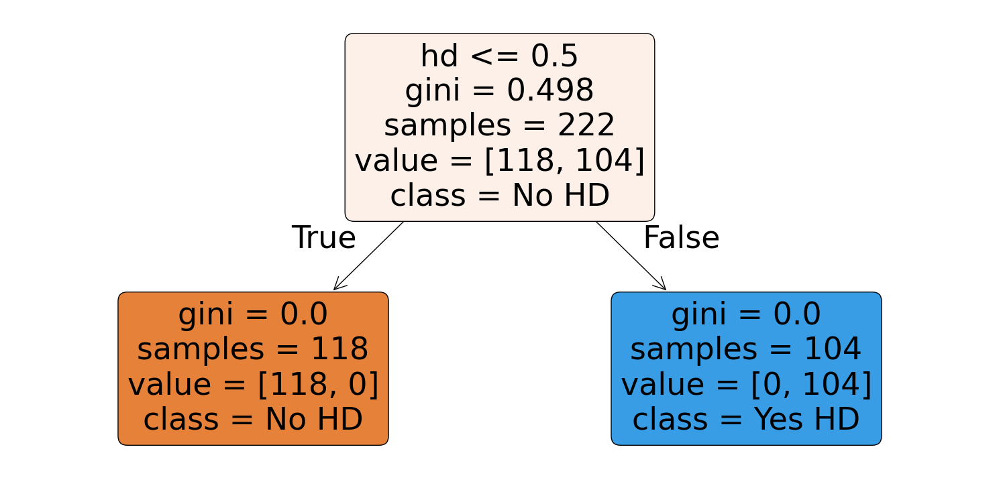

In [ ]:
plt.figure(figsize=(15,7.5))
plot_tree(clf, filled=True, rounded=True, class_names=["No HD","Yes HD"],feature_names=X_encoded.columns)
plt.tight_layout()
plt.show()

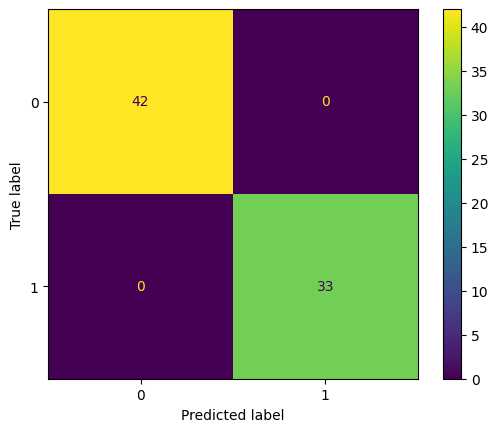

In [ ]:
ConfusionMatrixDisplay(confusion_matrix(y_test,clf.predict(X_test))).plot()

In [ ]:
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts = []

for ccp_alphas in ccp_alphas:
  dt = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alphas)
  dt.fit(X_train, y_train)
  clf_dts.append(dt)

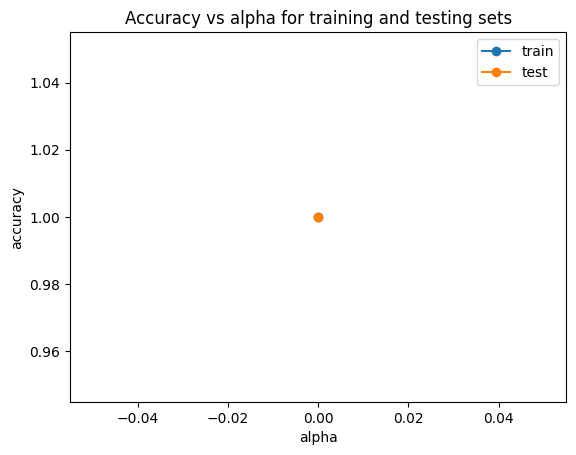

In [ ]:
train_scores = [dt.score(X_train, y_train) for dt in clf_dts]
test_scores = [dt.score(X_test, y_test) for dt in clf_dts]

fig,ax = plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy vs alpha for training and testing sets')
ax.plot(ccp_alphas, train_scores, marker='o', label='train', drawstyle='steps-post')
ax.plot(ccp_alphas, test_scores, marker='o', label='test', drawstyle='steps-post')
ax.legend()
plt.show()

<Axes: xlabel='tree'>

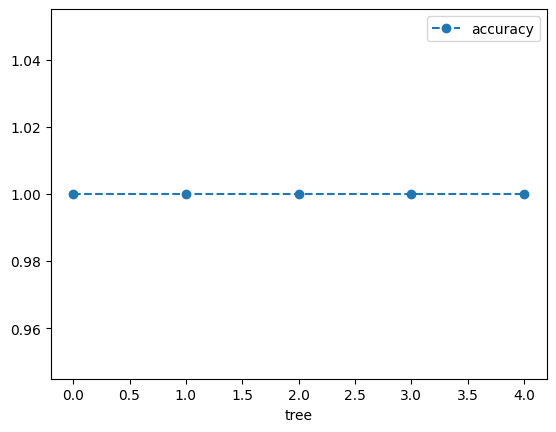

In [ ]:
clf_dt = DecisionTreeClassifier(random_state=42, ccp_alpha=0.02)
scores = cross_val_score(clf_dt, X_encoded, y, cv=5)
df = pd.DataFrame(data={'tree':range(5), 'accuracy':scores})
df.plot(x='tree',y='accuracy',marker='o',linestyle='--')



---



In [ ]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/salaries.csv')
df.head()

,company,job,degree,salary_more_then_100k
0,google,sales executive,bachelors,0
1,google,sales executive,masters,0
2,google,business manager,bachelors,1
3,google,business manager,masters,1
4,google,computer programmer,bachelors,0


In [ ]:
input = df.drop('salary_more_then_100k',axis='columns')
input.head()

,company,job,degree
0,google,sales executive,bachelors
1,google,sales executive,masters
2,google,business manager,bachelors
3,google,business manager,masters
4,google,computer programmer,bachelors


In [ ]:
target = df['salary_more_then_100k']
target.head()

,salary_more_then_100k
0,0
1,0
2,1
3,1
4,0


In [ ]:
from sklearn.preprocessing import LabelEncoder
le_company = LabelEncoder()
le_job = LabelEncoder()
le_degree = LabelEncoder()

In [ ]:
input['company_n'] = le_company.fit_transform(input['company'])
input['job_n'] = le_job.fit_transform(input['job'])
input['degree_n'] = le_degree.fit_transform(input['degree'])
input.head()

,company,job,degree,company_n,job_n,degree_n
0,google,sales executive,bachelors,2,2,0
1,google,sales executive,masters,2,2,1
2,google,business manager,bachelors,2,0,0
3,google,business manager,masters,2,0,1
4,google,computer programmer,bachelors,2,1,0


In [ ]:
X = input.drop(['company','job','degree'],axis='columns')
X.head()

,company_n,job_n,degree_n
0,2,2,0
1,2,2,1
2,2,0,0
3,2,0,1
4,2,1,0


In [ ]:
from sklearn import tree
model_tree = tree.DecisionTreeClassifier()
model_tree.fit(X,target)

DecisionTreeClassifier()

In [ ]:
model_tree.predict([[1,1,1]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


array([1])



---

Exercise:

In [ ]:
titanic = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/titanic.csv')
titanic.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [ ]:
df = titanic.drop(['PassengerId','Name','SibSp','Parch','Ticket','Cabin','Embarked'],axis='columns')
df.head()

,Survived,Pclass,Sex,Age,Fare
0,0,3,male,22.0,7.2500
1,1,1,female,38.0,71.2833
2,1,3,female,26.0,7.9250
3,1,1,female,35.0,53.1000
4,0,3,male,35.0,8.0500


In [ ]:
input = df.drop('Survived',axis='columns')
input.head()

,Pclass,Sex,Age,Fare
0,3,male,22.0,7.2500
1,1,female,38.0,71.2833
2,3,female,26.0,7.9250
3,1,female,35.0,53.1000
4,3,male,35.0,8.0500


In [ ]:
target = df.Survived
target.head()

,Survived
0,0
1,1
2,1
3,1
4,0


In [ ]:
input.Sex = input.Sex.map({'male': 1, 'female': 2})
input.head()

,Pclass,Sex,Age,Fare
0,3,1,22.0,7.2500
1,1,2,38.0,71.2833
2,3,2,26.0,7.9250
3,1,2,35.0,53.1000
4,3,1,35.0,8.0500


In [ ]:
input.Age = input.Age.fillna(input.Age.mean())
input.head()

,Pclass,Sex,Age,Fare
0,3,1,22.0,7.2500
1,1,2,38.0,71.2833
2,3,2,26.0,7.9250
3,1,2,35.0,53.1000
4,3,1,35.0,8.0500


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(input,target,test_size=0.2)

In [ ]:
model = tree.DecisionTreeClassifier()
model.fit(X_train,y_train)

DecisionTreeClassifier()

In [ ]:
model.score(X_test,y_test)

0.770949720670391

### Random forest

> Feature Importance

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [ ]:
iris = load_iris()
rf_clf = RandomForestClassifier(n_estimators=500,n_jobs=-1) # number of trees in the forest
rf_clf.fit(iris['data'], iris['target'])

for name,score in zip(iris['feature_names'],rf_clf.feature_importances_):
  print(name,score)

sepal length (cm) 0.09482789044092554
sepal width (cm) 0.02228545628069172
petal length (cm) 0.44107826293319585
petal width (cm) 0.4418083903451869


In [ ]:
from sklearn.datasets import fetch_openml
mnist = fetch_openml('mnist_784', version=1, as_frame=False)

In [ ]:
rf_clf = RandomForestClassifier(n_estimators=500,n_jobs=-1) # number of trees in the forest
rf_clf.fit(mnist['data'], mnist['target'])

RandomForestClassifier(n_estimators=500, n_jobs=-1)

In [ ]:
rf_clf.feature_importances_.shape

(784,)

In [ ]:
def plot_digit(data):
    image = data.reshape(28, 28)
    plt.imshow(image, cmap = plt.cm.hot,
               interpolation="nearest")
    plt.axis("off")

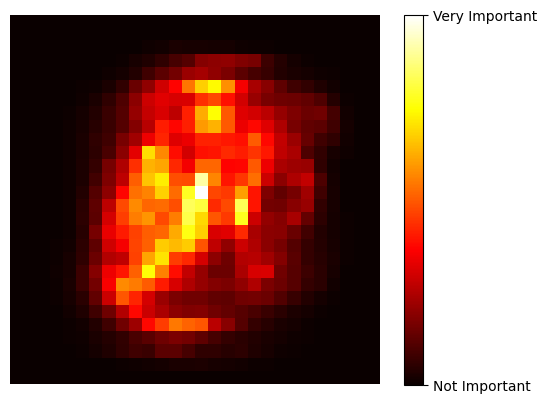

In [ ]:
plot_digit(rf_clf.feature_importances_)
char = plt.colorbar(ticks=[rf_clf.feature_importances_.min(), rf_clf.feature_importances_.max()])
char.ax.set_yticklabels(['Not Important','Very Important'],rotation=0)
plt.show()

> Voting


Soft Vote: Averaging weighted of probability

Hard Vote: Majority Vote

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=500, noise=0.30,random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=42)

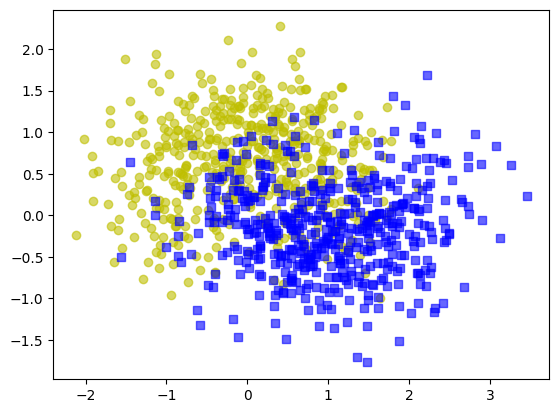

In [ ]:
import matplotlib.pyplot as plt

# Corrected scatter plot calls with 'c' and 'marker' arguments
plt.scatter(X[:,0][y==0], X[:,1][y==0], c='y', marker='o', alpha=0.6)  # Yellow circles
plt.scatter(X[:,0][y==1], X[:,1][y==1], c='b', marker='s', alpha=0.6)  # Blue squares

plt.show()

In [ ]:
from sklearn.ensemble import VotingClassifier,RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

log_clf = LogisticRegression()
rnd_clf = RandomForestClassifier()
svm_clf = SVC()
vote_clf_hard = VotingClassifier(
    estimators=[('lr',log_clf),('rf',rnd_clf),('svc',svm_clf)],
    voting='hard'
)

In [ ]:
vote_clf_hard.fit(X_train,y_train)

VotingClassifier(estimators=[('lr', LogisticRegression()),
                             ('rf', RandomForestClassifier()), ('svc', SVC())])

> Hard Vote

In [ ]:
from sklearn.metrics import accuracy_score
for clf in (log_clf,rnd_clf,svm_clf,vote_clf_hard):
  clf.fit(X_train,y_train)
  y_pred = clf.predict(X_test)
  print(clf.__class__.__name__,accuracy_score(y_test,y_pred))

LogisticRegression 0.864
RandomForestClassifier 0.896
SVC 0.896
VotingClassifier 0.904


Soft Vote

In [ ]:
log_clf = LogisticRegression(random_state=42)
rnd_clf = RandomForestClassifier(random_state=42)
svm_clf = SVC(random_state=42,probability=True)
vote_clf_soft = VotingClassifier(
    estimators=[('lr',log_clf),('rf',rnd_clf),('svc',svm_clf)],
    voting='soft'
)

In [ ]:
for clf in (log_clf,rnd_clf,svm_clf,vote_clf_soft):
  clf.fit(X_train,y_train)
  y_pred = clf.predict(X_test)
  print(clf.__class__.__name__,accuracy_score(y_test,y_pred))

LogisticRegression 0.864
RandomForestClassifier 0.896
SVC 0.896
VotingClassifier 0.92


Soft Vote: 0.92 > Hard Vote: 0.888



---



<Figure size 640x480 with 0 Axes>

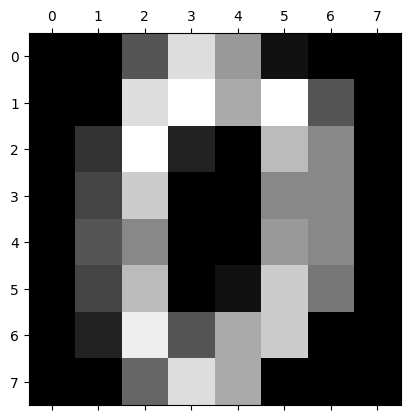

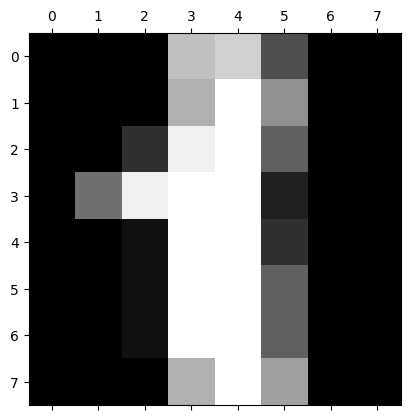

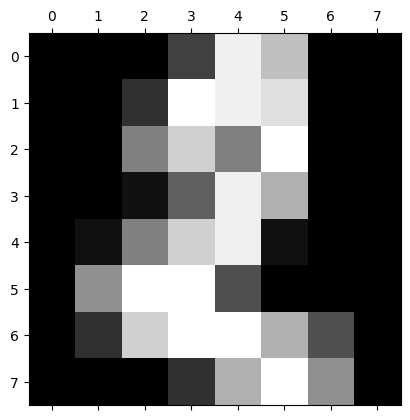

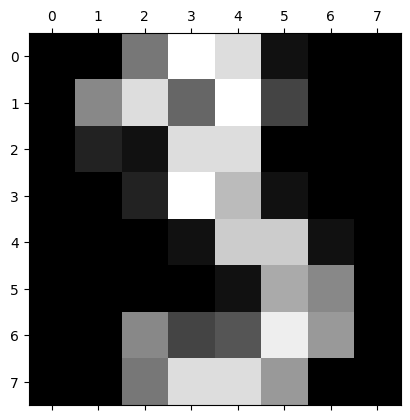

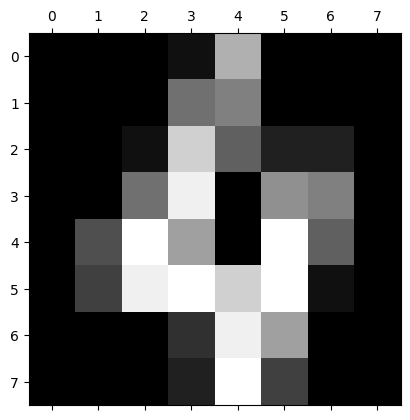

In [ ]:
digital = load_digits()
%matplotlib inline
plt.gray()
for i in range(5):
  plt.matshow(digital.images[i])

In [ ]:
data = pd.DataFrame(digital.data)
data.head()

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0


In [ ]:
data['target'] = digital.target
data.head()

,0,1,2,3,4,5,6,7,8,9,...,55,56,57,58,59,60,61,62,63,target
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0,0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0,1
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0,2
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0,3
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0,4


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data.drop(['target'],axis='columns'),data.target,test_size=0.2)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model_forest = RandomForestClassifier(n_estimators=100) # number of trees in the forest
model_forest.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
model_forest.score(X_test, y_test)

0.975

In [ ]:
y_pred = model_forest.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
cm

array([[28,  0,  0,  0,  1,  0,  0,  0,  0,  0],
       [ 0, 48,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0, 33,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0, 30,  0,  2,  0,  0,  3,  0],
       [ 0,  0,  0,  0, 38,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0, 32,  1,  0,  0,  1],
       [ 0,  0,  0,  0,  0,  0, 37,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 36,  0,  0],
       [ 0,  0,  0,  0,  0,  1,  0,  0, 30,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 39]])

Text(95.72222222222221, 0.5, 'Truth')

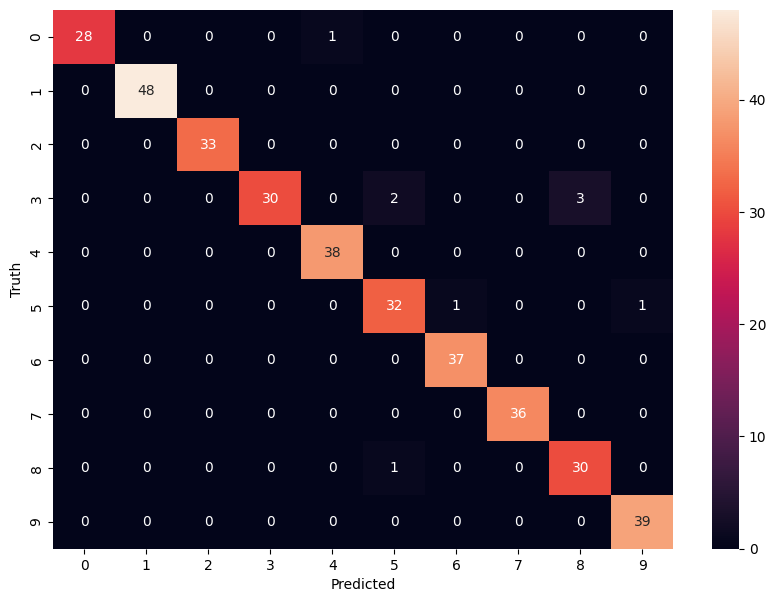

In [ ]:
import seaborn as sn
plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')



---
Exercise


In [ ]:
ir = load_iris()
ir_df = pd.DataFrame(ir.data, columns = ir.feature_names)
ir_df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [ ]:
ir_target = ir.target
ir_target = pd.DataFrame(ir_target, columns = ['target'])

,target
0,0
1,0
2,0
3,0
4,0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(ir_df,ir_target,test_size=0.2)
model_forest_iris = RandomForestClassifier(n_estimators=1000)
model_forest_iris.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(n_estimators=1000)

In [ ]:
model_forest_iris.score(X_test, y_test)

0.9666666666666667

### Bagging



> Bagging - Bootstrp Aggregating

* Bagging trains n base learners in parallel
* Make decision by averaging learners' outputs(regression) or majority voting(classification)
* Each learner is trained on data by bootstrap sampling
  * Assume m training examples, then randomly sampling m examples with replacement
  * Around 1-1/e ≈ 63% examples will be sampled, the remain 37% may not be sampled and can be used for validation. (Out of bag)





---



In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

bag_clf = BaggingClassifier(
    DecisionTreeClassifier(),
    n_estimators=500,
    max_samples=100,
    bootstrap=True, # replace or not
    n_jobs=-1,# multi threads
    random_state=42
)
bag_clf.fit(X_train, y_train)
y_pred_bag = bag_clf.predict(X_test)
acc = accuracy_score(y_test, y_pred_bag)
print(acc)

0.904


In [ ]:
dt_clf = DecisionTreeClassifier(random_state=42)
dt_clf.fit(X_train, y_train)
y_pred_dt = dt_clf.predict(X_test)
acc_dt = accuracy_score(y_test, y_pred_dt)
print(acc_dt)

0.856


> Decision Boundary

In [ ]:
import numpy as np

In [ ]:
from matplotlib.colors import ListedColormap
def plot_decision_boundary(clf, X, y, axes=[-1.5,2.5,-1,1.5],alpha=0.5,contour=True):
    x1s = np.linspace(axes[0], axes[1], 100)
    x2s = np.linspace(axes[2], axes[3], 100)
    x1, x2 = np.meshgrid(x1s, x2s)
    x_new = np.c_[x1.ravel(), x2.ravel()]
    y_pred = clf.predict(x_new).reshape(x1.shape)
    plt.contourf(x1, x2, y_pred, alpha=alpha, cmap=plt.cm.brg)
    if contour:
        plt.contour(x1, x2, y_pred, cmap=plt.cm.brg,alpha=0.8)
    plt.scatter(X[:,0][y==0], X[:,1][y==0], c='y', marker='o', alpha=0.6)  # Yellow circles
    plt.scatter(X[:,0][y==1], X[:,1][y==1], c='b', marker='s', alpha=0.6)  # Blue squares
    plt.axis(axes)
    plt.xlabel(r"$x_1$", fontsize=18)
    plt.ylabel(r"$x_2$", fontsize=18, rotation=0)


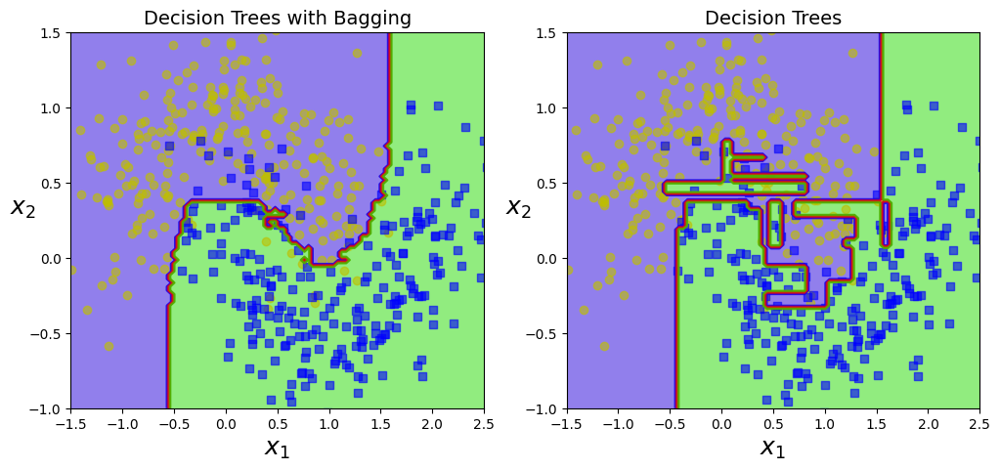

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plot_decision_boundary(bag_clf, X, y)
plt.title("Decision Trees with Bagging", fontsize=14)
plt.subplot(122)
plot_decision_boundary(dt_clf, X, y)
plt.title("Decision Trees", fontsize=14)
plt.show()

> Out of Bag (OOB)

In [ ]:
bag_clf_oob = BaggingClassifier(
    DecisionTreeClassifier(),
    n_estimators=500,
    max_samples=100,
    bootstrap=True, # replace or not
    n_jobs=-1,# multi
    random_state=42,
    oob_score=True
)
bag_clf_oob.fit(X_train, y_train)
bag_clf_oob.oob_score_

0.9253333333333333

In [ ]:
bag_clf_oob.oob_decision_function_

array([[0.35579515, 0.64420485],
       [0.43513514, 0.56486486],
       [1.        , 0.        ],
       [0.01030928, 0.98969072],
       [0.03174603, 0.96825397],
       [0.07672634, 0.92327366],
       [0.39189189, 0.60810811],
       [0.06145251, 0.93854749],
       [0.92689295, 0.07310705],
       [0.88205128, 0.11794872],
       [0.59850374, 0.40149626],
       [0.04896907, 0.95103093],
       [0.7565445 , 0.2434555 ],
       [0.81377551, 0.18622449],
       [0.88528678, 0.11471322],
       [0.07407407, 0.92592593],
       [0.04738155, 0.95261845],
       [0.92051282, 0.07948718],
       [0.69974555, 0.30025445],
       [0.94358974, 0.05641026],
       [0.06100796, 0.93899204],
       [0.224     , 0.776     ],
       [0.9125964 , 0.0874036 ],
       [0.98746867, 0.01253133],
       [0.95967742, 0.04032258],
       [0.        , 1.        ],
       [0.94255875, 0.05744125],
       [1.        , 0.        ],
       [0.03466667, 0.96533333],
       [0.7020202 , 0.2979798 ],
       [0.



---



In [ ]:
# Bagging implementation and explanation
class Bagging:
    def __init__(self, base_learner, n_learners):
        self.learners = [clone(base_learner) for _ in range(n_learners)]
# 1. `__init__` Method:
#    - Initializes the Bagging class, accepting a base learner (`base_learner`) and the number of learners (`n_learners`).
#    - Uses the `clone` method to replicate the base learner, creating multiple instances and storing them in the `self.learners` list.

    def fit(self, X, y):
        for learner in self.learners:
            examples = np.random.choice(
                np.arange(len(X)), int(len(X)), replace=True)
            learner.fit(X.iloc[examples, :], y.iloc[examples])
# 2. `fit` Method:
#    - Generates different training data subsets for each base learner through random sampling and trains each learner.
#    - Uses `np.random.choice` with replacement to ensure each learner sees a different subset of the training data.


    def predict(self, X):
        preds = [learner.predict(X) for learner in self.learners]
        return np.array(preds).mean(axis=0)
# 3. `predict` Method:
#    - Makes predictions using each base learner and averages all the predictions to produce the final Bagging model output.
#    - `np.array(preds).mean(axis=0)` averages the predictions from multiple learners to reduce the bias of individual learners.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.base import clone

X, y = make_classification(n_samples=500, n_features=10, n_classes=2, random_state=42)
X = pd.DataFrame(X)
y = pd.Series(y)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize a base learner (Decision Tree)
base_learner = DecisionTreeClassifier()

# Create Bagging model with 10 base learners
bagging_model = Bagging(base_learner, n_learners=10)

# Train the Bagging model
bagging_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = bagging_model.predict(X_test)

# Evaluate the model
accuracy = np.mean(y_pred.round() == y_test)
print(f'Bagging Model Accuracy: {accuracy:.2f}')

Bagging Model Accuracy: 0.92




---



In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/diabetes.csv')
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
df.isnull().sum()

,0
Pregnancies,0
Glucose,0
BloodPressure,0
SkinThickness,0
Insulin,0
BMI,0
DiabetesPedigreeFunction,0
Age,0
Outcome,0


In [ ]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [ ]:
df.value_counts(df['Outcome']==1)/len(df)

,count
Outcome,
False,0.651042
True,0.348958


In [ ]:
X = df.drop('Outcome',axis='columns')
y = df.Outcome

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, stratify=y, random_state=10)
# stratify 参数用于确保拆分后的训练集和测试集中，目标变量（y）的分布与原始数据集保持一致，特别是对于分类任务中的类别不平衡情况非常有用
#在分类问题中，如果目标变量的类别分布不平衡，比如某些类别的数据量远少于其他类别，直接进行随机拆分可能会导致训练集和测试集中的类别分布不均衡，进而影响模型的性能

In [ ]:
y_train.value_counts()/len(y_train)

,count
Outcome,
0,0.651042
1,0.348958


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier

In [ ]:
cross_val_score(DecisionTreeClassifier(), X, y, cv=5).mean()

0.7175621763857057

In [ ]:
# Using bagging

In [ ]:
from sklearn.ensemble import BaggingClassifier
bag_model = BaggingClassifier(
    estimator=DecisionTreeClassifier(),
    n_estimators=100, # number of trees
    max_samples=0.8, # max number of samples to train
    oob_score=True, # out of bag score
    random_state=0
)
bag_model.fit(X_train, y_train)
bag_model.oob_score_

0.7534722222222222

In [ ]:
bag_model_cross = BaggingClassifier(
    estimator=DecisionTreeClassifier(),
    n_estimators=100, # number of trees
    max_samples=0.8, # max number of samples to train
    oob_score=True, # out of bag score
    random_state=0
)
cross_val_score(bag_model_cross, X, y, cv=5).mean()

0.7578728461081402

In [ ]:
cross_val_score(RandomForestClassifier(), X, y, cv=5).mean()

0.7683133859604449

In [ ]:
bag_model_r = BaggingClassifier(
    estimator=RandomForestClassifier(),# Random forest is one kind of bagging so do not need any more
    n_estimators=50, # number of trees
    max_samples=0.8, # max number of samples to train
    oob_score=True, # out of bag score
    random_state=0
)
cross_val_score(bag_model_r, X, y, cv=5).mean()

0.7669977081741788



---

Exercise

In [ ]:
heart = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/heart.csv')
heart.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [ ]:
heart.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


In [ ]:
#Outlier detection
heart[heart.Cholesterol>(heart.Cholesterol.mean()+3*heart.Cholesterol.std())]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
76,32,M,ASY,118,529,0,Normal,130,N,0.0,Flat,1
149,54,M,ASY,130,603,1,Normal,125,Y,1.0,Flat,1
616,67,F,NAP,115,564,0,LVH,160,N,1.6,Flat,0


In [ ]:
heart = heart[heart.Cholesterol<=(heart.Cholesterol.mean()+3*heart.Cholesterol.std())]

In [ ]:
heart[heart.RestingBP>(heart.RestingBP.mean()+3*heart.RestingBP.std())]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
109,39,M,ATA,190,241,0,Normal,106,N,0.0,Up,0
241,54,M,ASY,200,198,0,Normal,142,Y,2.0,Flat,1
365,64,F,ASY,200,0,0,Normal,140,Y,1.0,Flat,1
399,61,M,NAP,200,0,1,ST,70,N,0.0,Flat,1
592,61,M,ASY,190,287,1,LVH,150,Y,2.0,Down,1
732,56,F,ASY,200,288,1,LVH,133,Y,4.0,Down,1
759,54,M,ATA,192,283,0,LVH,195,N,0.0,Up,1


In [ ]:
heart = heart[heart.RestingBP<=(heart.RestingBP.mean()+3*heart.RestingBP.std())]

In [ ]:
heart[heart.Oldpeak>(heart.Oldpeak.mean()+3*heart.Oldpeak.std())]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
166,50,M,ASY,140,231,0,ST,140,Y,5.0,Flat,1
702,59,M,TA,178,270,0,LVH,145,N,4.2,Down,0
771,55,M,ASY,140,217,0,Normal,111,Y,5.6,Down,1
791,51,M,ASY,140,298,0,Normal,122,Y,4.2,Flat,1
850,62,F,ASY,160,164,0,LVH,145,N,6.2,Down,1
900,58,M,ASY,114,318,0,ST,140,N,4.4,Down,1


In [ ]:
heart = heart[heart.Oldpeak<=(heart.Oldpeak.mean()+3*heart.Oldpeak.std())]

In [ ]:
heart.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [ ]:
# prompt:  DataFrame“heart”: compiling the text label into numbers

# Create a dictionary to map categorical values to numerical values
label_mapping = {
    'Sex': {'M': 1, 'F': 0},
    'ChestPainType': {'ATA': 0, 'NAP': 1, 'ASY': 2, 'TA': 3},
    'RestingECG': {'Normal': 0, 'ST': 1, 'LVH': 2},
    'ExerciseAngina': {'N': 0, 'Y': 1},
    'ST_Slope': {'Up': 0, 'Flat': 1, 'Down': 2}
}

# Iterate through the columns and replace the text labels with numerical values
for column, mapping in label_mapping.items():
    heart[column] = heart[column].map(mapping)


In [ ]:
X= heart.drop('HeartDisease',axis='columns')
y = heart.HeartDisease

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=20)

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
cross_val_score(SVC(), X, y, cv=5).mean()

0.6906445672191528

In [ ]:
cross_val_score(DecisionTreeClassifier(), X, y, cv=5).mean()

0.7427378759975446

In [ ]:
bag_model = BaggingClassifier(
    estimator=SVC(),
    n_estimators=100,
    max_samples=0.8,
    oob_score=True,
    random_state=0
)
cross_val_score(bag_model, X, y, cv=5).mean()

0.6839656230816453

In [ ]:
bag_model = BaggingClassifier(
    estimator=DecisionTreeClassifier(random_state=0),
    n_estimators=100,
    max_samples=0.8,
    oob_score=True,
    random_state=0
)
cross_val_score(bag_model, X, y, cv=5).mean()

0.8047943523634131

In [ ]:
cross_val_score(RandomForestClassifier(), X, y, cv=5).mean()

0.8225537139349296



> Unstable Learners

* Bagging reduces variance, especially for unstable leaners
  * Models with high variance is unstable





### Boosting

* Boosting combines weak leaners into a strong one
  * Primarily to reduce bias

* Learn n weak learners sequentially, at step i:
  * Train a weak learner $h_i$ evaluate its $ϵ_t$
  * Re-sample data according to $ϵ_t$ to focus on wrongly predicted samples

* Notable examples include AdaBoost, gradient boosting



> **Gradient Boosting**

* Denote by $H_t(x)$ the model at time t, with $H_1(x)=0$

* At step t=1
  * Train a new model $h_t$ on residuals: $\{(x_i, y_i - H_t(x_i))\}_{i=1,\ldots,m}$

  * $H_{t+1}(x)= H_t(x) + ŋ f_t(x)$
    * The learning rate ŋ regularizes the model by shrinkage

* The residuals equal to $-\frac{\partial L}{\partial H}$ if using MSE as the loss
  * Other boosting algorithms (e.g. AdaBoost) can also be

In [ ]:
import numpy as np
from sklearn.base import clone

# Gradient Boosting implementation
class GradientBoosting:
# 1. `__init__` Method:
#    - Initializes the GradientBoosting class, accepting a base learner (`base_learner`), the number of learners (`n_learners`), and the learning rate (`learning_rate`).
#    - Uses the `clone` method to replicate the base learner, creating multiple instances and storing them in the `self.learners` list.
#    - Stores the learning rate in `self.lr`.
    def __init__(self, base_learner, n_learners, learning_rate):
        self.learners = [clone(base_learner) for _ in range(n_learners)]
        self.lr = learning_rate
# 2. `fit` Method:
#    - Fits the learners sequentially by training each learner on the current residuals.
#    - The residual is computed by subtracting the predictions of the current learner, multiplied by the learning rate, from the previous residual.
    def fit(self, X, y):
        residual = y.copy()
        for learner in self.learners:
            learner.fit(X, residual)
            residual -= self.lr * learner.predict(X)
# 3. `predict` Method:
#    - Makes predictions using each base learner and sums the predictions, scaled by the learning rate, to produce the final Gradient Boosting model output.
#    - `np.array(preds).sum(axis=0) * self.lr` aggregates the predictions from multiple learners and scales them by the learning rate.
    def predict(self, X):
        preds = [learner.predict(X) for learner in self.learners]
        return np.array(preds).sum(axis=0) * self.lr

> AdaBoost



In contrast to Random Forest, a Forest of trees made with AdaBoost, the trees are usually just a node and two leaves called **Stump** (Weak Learners)

Steps:

  1. Combines lots of Stump to make classification

  2. Some stumps get more say in classification than others


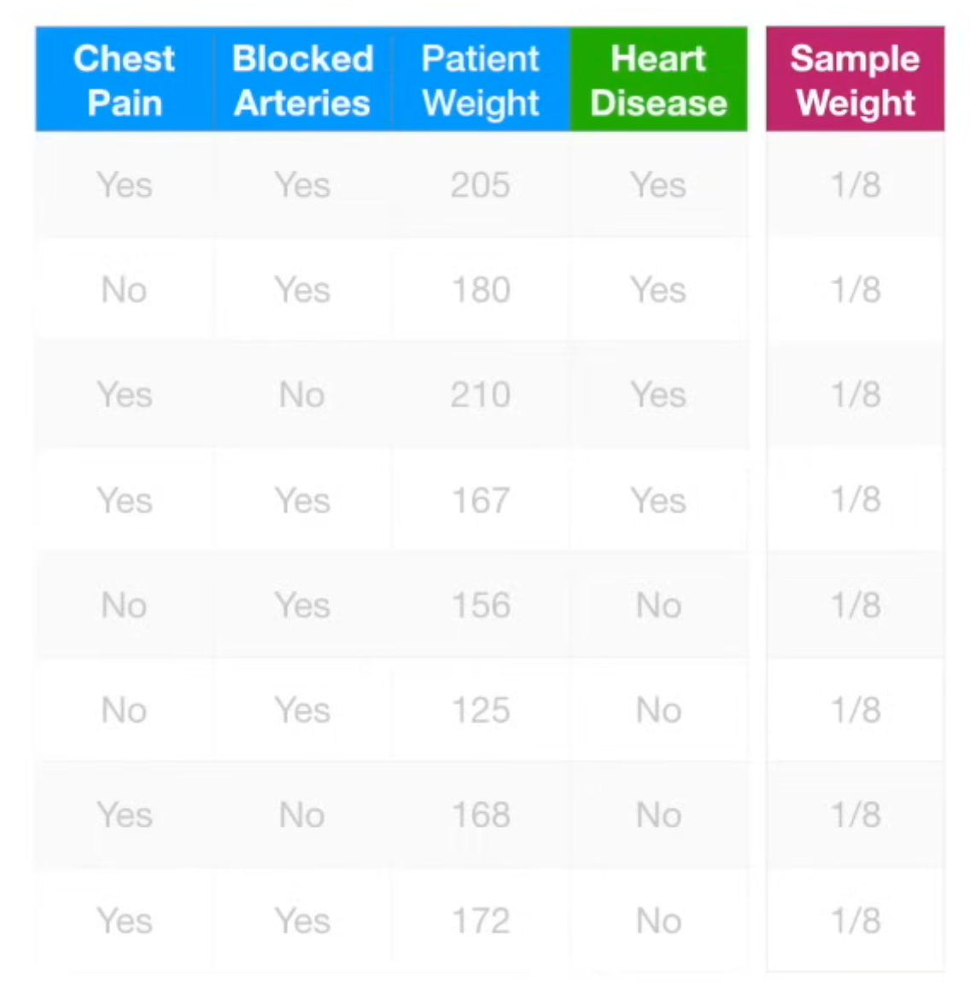

Note:
  * Sample Weights add up to 1, **Total Error** will always between 0 (Perfect) and 1 (Bad)
  * Use **Total Error** to determine **Amount of Say** this stump has by:
  $$
  \text{Amount of Say} = \frac{1}{2}log{\frac{1-Total Error}{Total Error}}
  $$


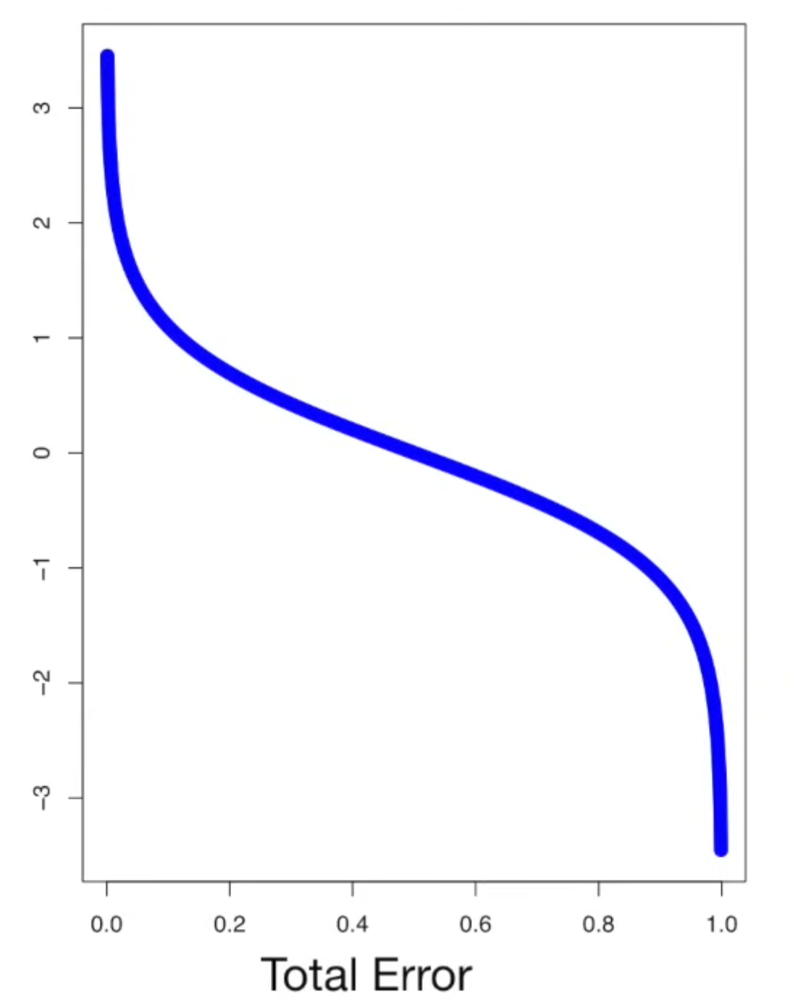

Note:
  * The less the **error**, the greater the **Amount of say**

Increase: (For misclassification)

New Sample Weight = Sample Weight × $e^{\text{amount of say}}$ $=\frac{1}{8}e^{\text{amount of say}}$


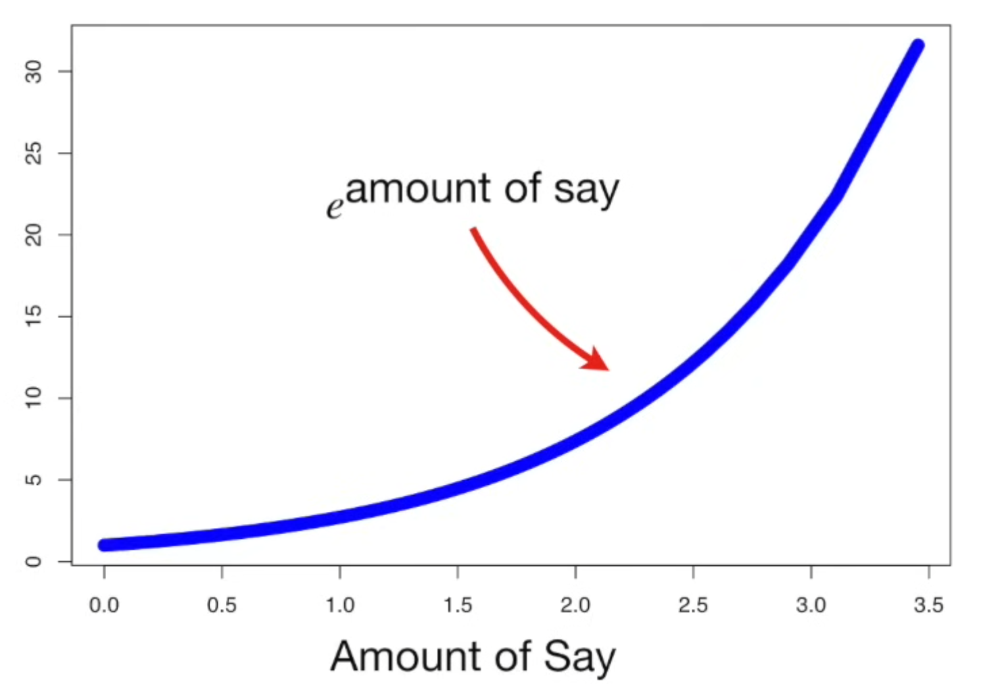

Note:

  * Amount of Say is relatively low - the last stump did not do a good job


Decrease: (For Correctly classified)

New Sample Weight = Sample Weight × $e^{-\text{amount of say}}$ $=\frac{1}{8}e^{-\text{amount of say}}$

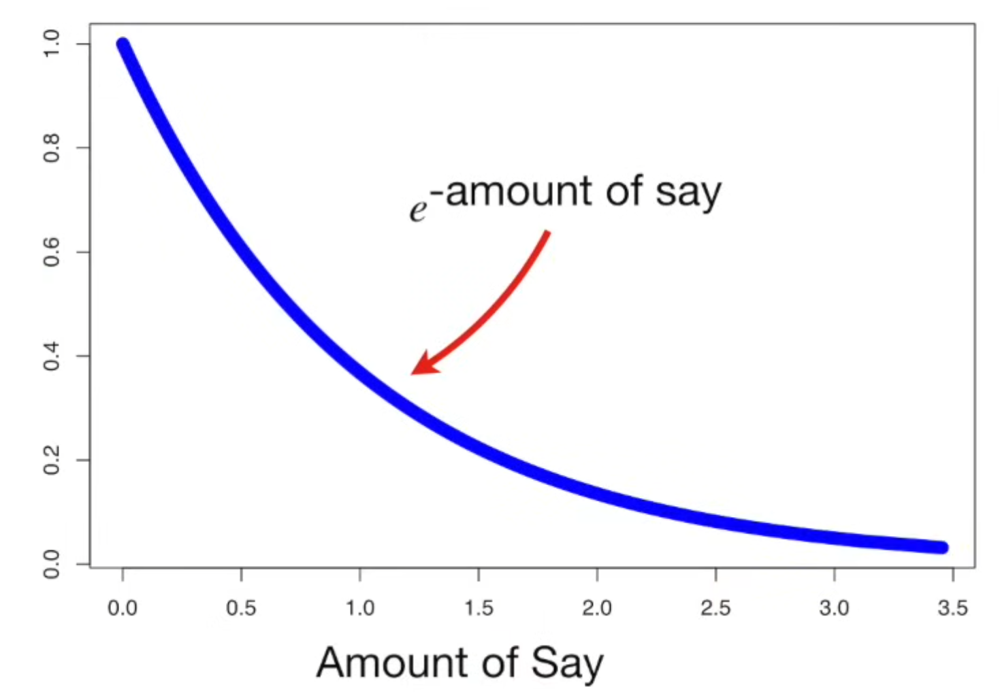

Note:
  * If Amount of say is relatively large, new weight would be very small
    (This ensure that the correct classified has less weight)

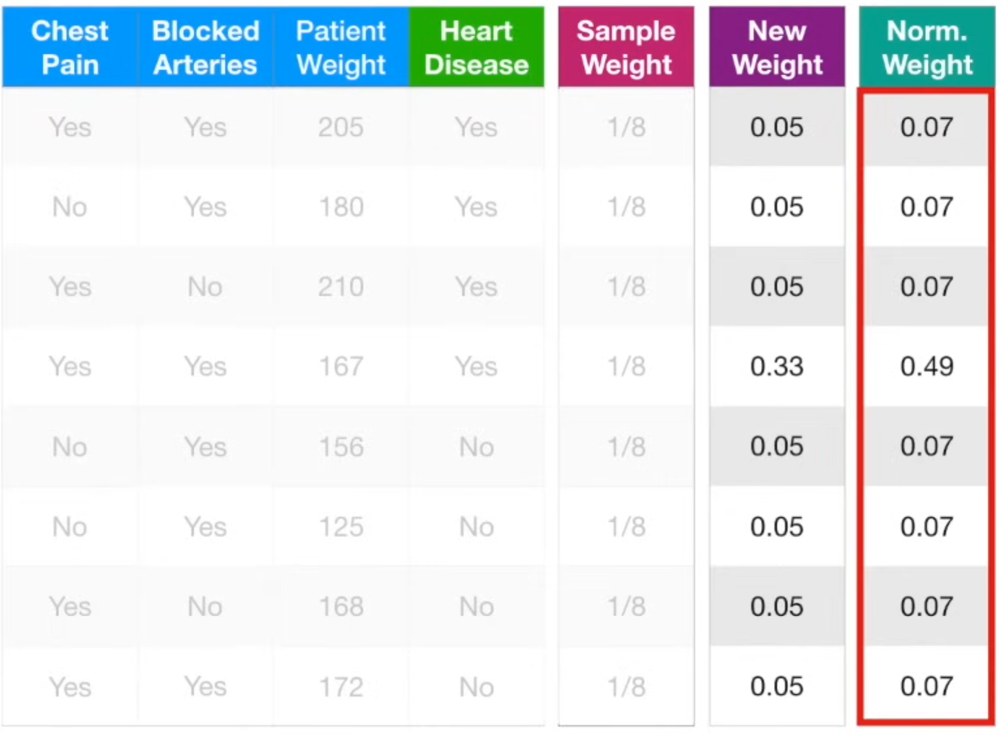


  3. Each stump is made by taking the previous stump's mistakes into account

    * Make a new collection of samples that contains duplicate copies of the samples with largest **Sample weight**

    1. Pick random number from 0 to 1

    2. Use the Sample weight as distributions and check whether the random number falls in which sample's weight distribution region

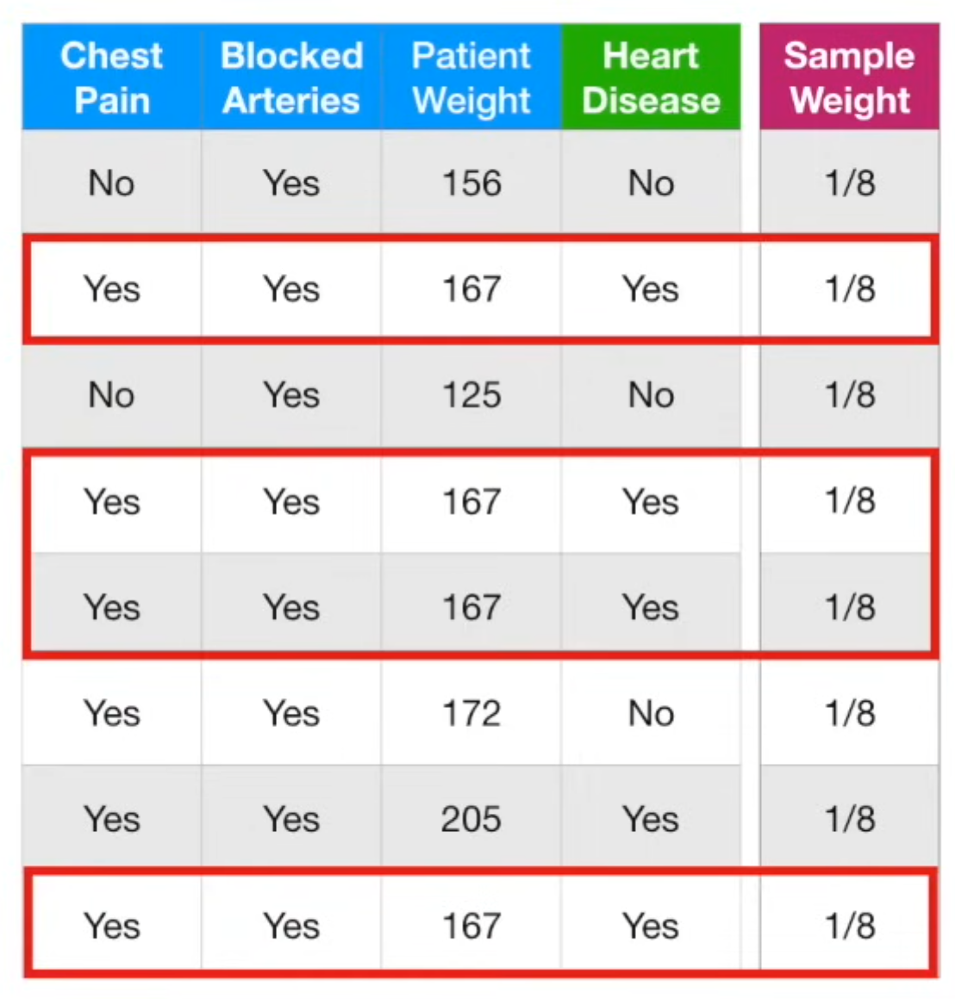

And do over agian!

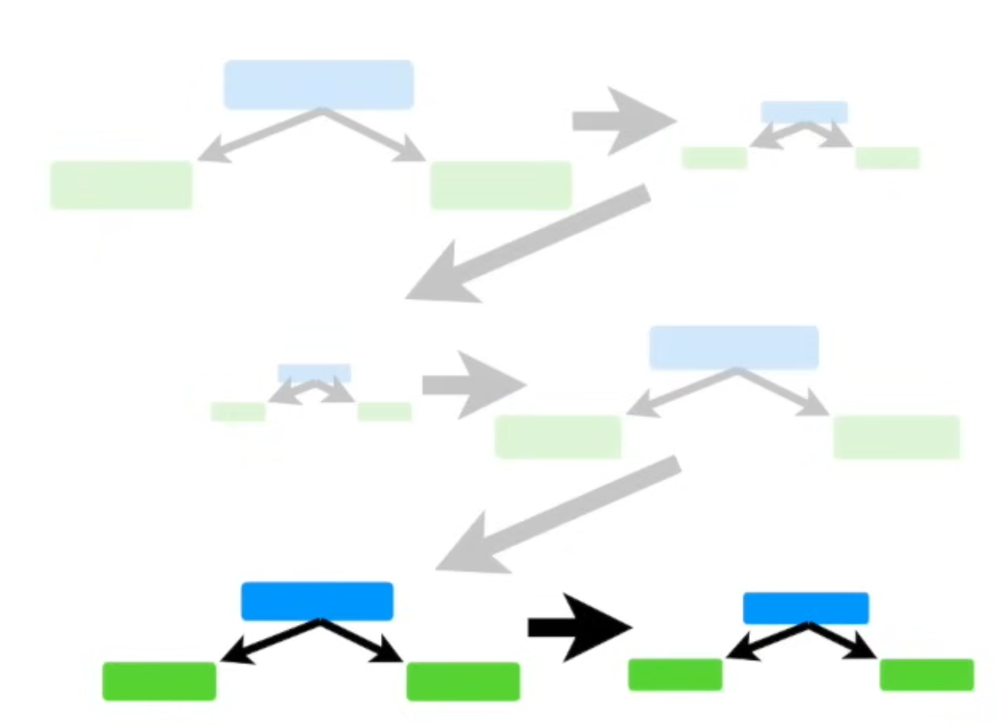

In [ ]:
from sklearn.svm import SVC
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

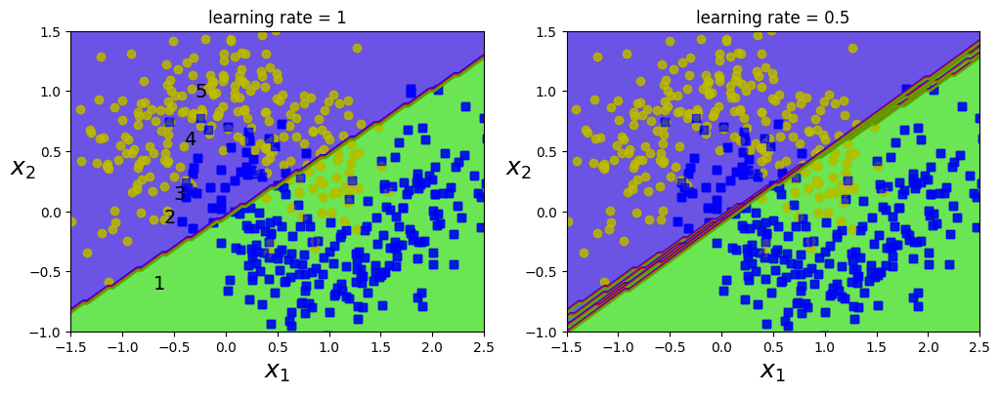

In [ ]:
m = len(X_train)

plt.figure(figsize=(12,4))
for subplot, lr in ((121,1),(122,0.5)):
    sample_weight = np.ones(m)
    plt.subplot(subplot)
    for i in range(5):
      svm_boost = SVC(kernel='linear',C=0.05,random_state=42)
      svm_boost.fit(X_train,y_train,sample_weight=sample_weight)
      y_p = svm_boost.predict(X_train)
      sample_weight[y_p!=y_train]=sample_weight[y_p!=y_train]*lr
      plot_decision_boundary(svm_boost,X,y,alpha=0.2)
      plt.title("learning rate = {}".format(lr))
    if subplot ==121:
        plt.text(-0.7,-0.65,"1",fontsize=14)
        plt.text(-0.6,-0.10,"2",fontsize=14)
        plt.text(-0.5,0.10,"3",fontsize=14)
        plt.text(-0.4,0.55,"4",fontsize=14)
        plt.text(-0.3,0.95,"5",fontsize=14)

plt.show()

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
ada_clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1),n_estimators=200,learning_rate=0.5,random_state = 42)
ada_clf.fit(X_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1),
                   learning_rate=0.5, n_estimators=200, random_state=42)

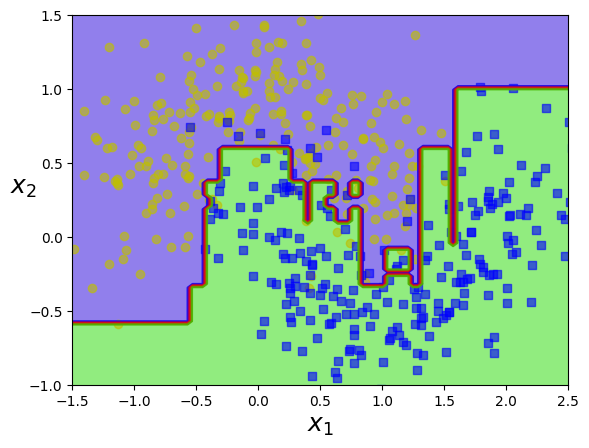

In [ ]:
plot_decision_boundary(ada_clf,X,y)

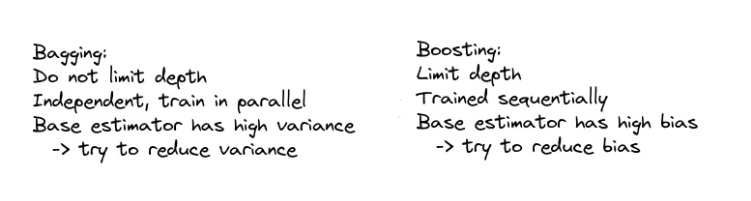



---



### Early Stopping

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=49)

In [ ]:
from sklearn.metrics import mean_squared_error

gbrt = GradientBoostingRegressor(max_depth=2, n_estimators=120, random_state=42)
gbrt.fit(X_train, y_train)

errors = [mean_squared_error(y_test,y_pred) for y_pred in gbrt.staged_predict(X_test)]
bst_n_estimators = np.argmin(errors) + 1

In [ ]:
bst_n_estimators

66

In [ ]:
gbrt_b = GradientBoostingRegressor(max_depth=2, n_estimators=bst_n_estimators, random_state=42)
gbrt_b.fit(X_train, y_train)

GradientBoostingRegressor(max_depth=2, n_estimators=66, random_state=42)

In [ ]:
min_error = np.min(errors)
min_error

0.0021071618250743233

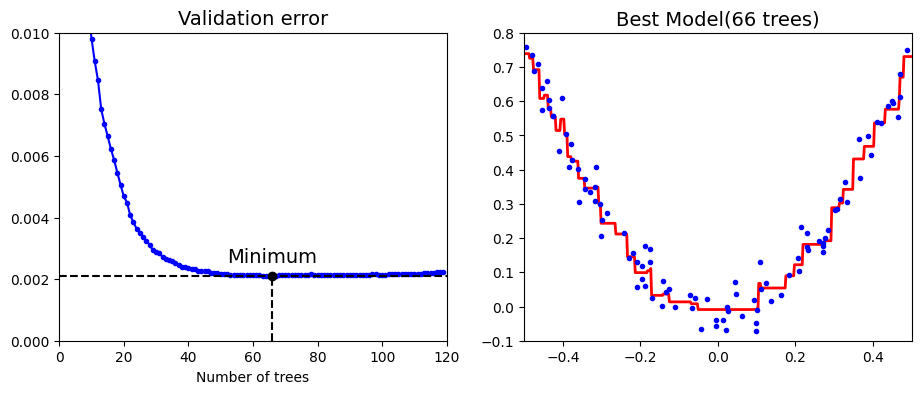

In [ ]:
plt.figure(figsize=(11,4))
plt.subplot(121)
plt.plot(errors, "b.-")
plt.plot([bst_n_estimators, bst_n_estimators], [0, min_error], "k--")
plt.plot([0, 120], [min_error, min_error], "k--")
plt.plot(bst_n_estimators, min_error, "ko")
plt.text(bst_n_estimators, min_error*1.2, "Minimum", ha="center", fontsize=14)
plt.axis([0, 120, 0, 0.01])
plt.xlabel("Number of trees")
plt.title("Validation error", fontsize=14)

plt.subplot(122)
plot_predictions([gbrt_b], X, y, axes=[-0.5, 0.5, -0.1, 0.8])
plt.title("Best Model(%d trees)"%bst_n_estimators, fontsize=14)

plt.show()


In [ ]:
gbrt_ws = GradientBoostingRegressor(max_depth=2, warm_start=True, random_state=42)
min_error = float("inf")
error_going_up = 0
for n_estimators in range(1,120):
    gbrt_ws.n_estimators = n_estimators
    gbrt_ws.fit(X_train, y_train)
    y_pred = gbrt_ws.predict(X_test)
    val_error = mean_squared_error(y_test, y_pred)
    if val_error < min_error:
        min_error = val_error
        error_going_up = 0
    else:
        error_going_up += 1
        if error_going_up == 4:
            break  # early stopping

In [ ]:
n_estimators

70

### GBDT



> Gradient Boosting Decision Tree (GBDT)

* Use decision tree as the weak learner

  Gradient Boosting is very likely to overfit, so:

  * Regularize by a small max_depth and randomly sampling features

* Sequentially constructing trees runs slow
  * Popular libraries use acelerated algorithms, e.g. XGBoost, lightGBM



Gradient Boosting Decision Trees (GBDT) is an ensemble learning technique that builds a model in a stage-wise fashion by sequentially adding weak learners (decision trees).

Each new tree is trained to minimize the errors (residuals) of the previous ensemble, effectively boosting performance.

$$
F_{(x)} = \sum_{m=1}^M \alpha_m T_m{(x)}
$$
Where $T_m{(x)}$ presents the m-th Decision Tree and $\alpha_m $ is the weight for each Tree

* Initial Model:

  Define the initial model $F_0(x)$ as a constant model (e.g., mean value):
$$
F_0(x) = \arg\min_{\gamma} \sum_{i=1}^N L(y_i, \gamma)
$$
  where $ L $ is the loss function.

* Iteration Update:

  The decision tree constructed through iteration is used to update the model $ F(x) $. In the $ m $-th iteration, a decision tree is constructed to fit the residuals from the previous prediction:
$$
r_i^{(m)} = -\frac{\partial L(y_i, F_{m-1}(x_i))}{\partial F_{m-1}(x_i)}
$$
  Then, the residuals $r_i^{(m)} $ are used to train the $ m $-th decision tree to produce a new predictive model $h_m(x)$.

* Model Update:

  The updated model is:
$$
F_m(x) = F_{m-1}(x) + \alpha h_m(x)
$$
  where $\alpha$ is the learning rate used to control the contribution of each tree.




---



In [ ]:
np.random.seed(42)
X = np.random.rand(100,1)-0.5
y = 3*X[:,0]**2 + 0.05 * np.random.randn(100)

In [ ]:
from sklearn.tree import DecisionTreeRegressor
tree_reg1 = DecisionTreeRegressor(max_depth=2)
tree_reg1.fit(X, y)

DecisionTreeRegressor(max_depth=2)

In [ ]:
y2 = y - tree_reg1.predict(X) # residual
tree_reg2 = DecisionTreeRegressor(max_depth=2)
tree_reg2.fit(X, y2)

DecisionTreeRegressor(max_depth=2)

In [ ]:
y3 = y2 - tree_reg2.predict(X) # residual
tree_reg3 = DecisionTreeRegressor(max_depth=2)
tree_reg3.fit(X, y3)

DecisionTreeRegressor(max_depth=2)

In [ ]:
X_new = np.array([[0.8]])
y_pred = sum(tree.predict(X_new) for tree in (tree_reg1, tree_reg2, tree_reg3))
y_pred

array([0.75026781])

In [ ]:
tree_reg1.predict(X_new), tree_reg2.predict(X_new), tree_reg3.predict(X_new)

(array([0.52856846]), array([0.03991297]), array([0.18178637]))

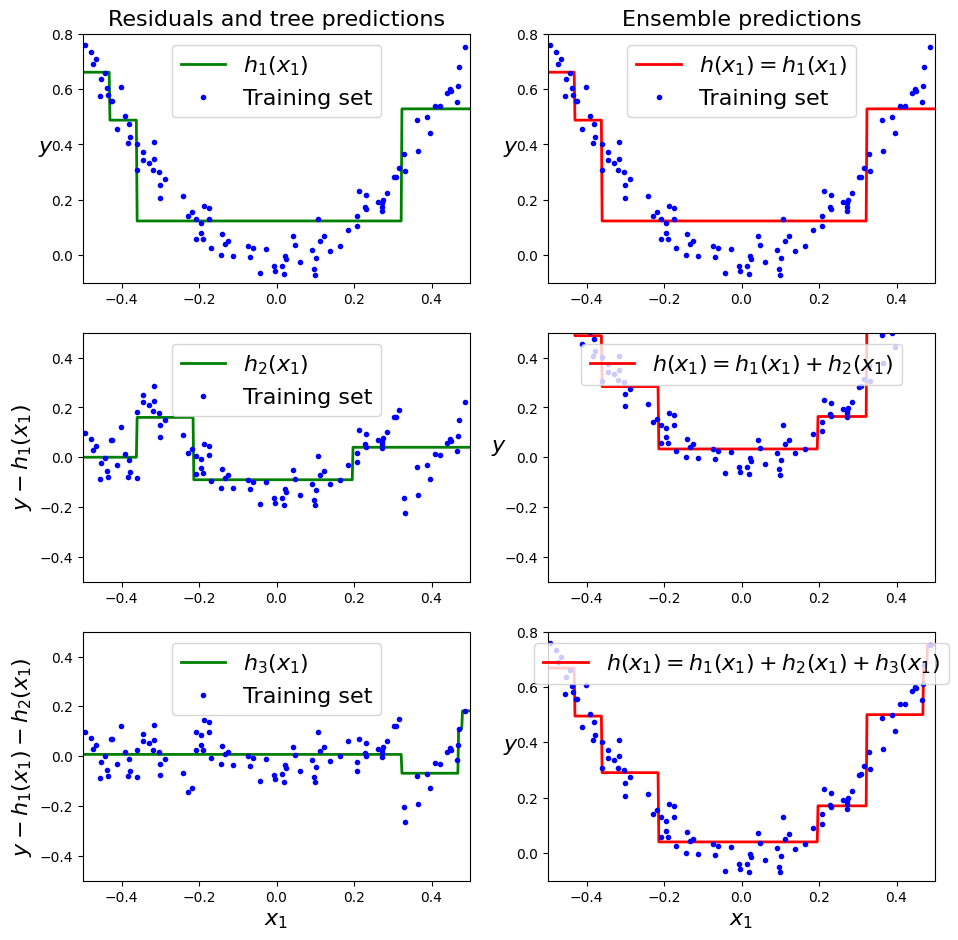

In [ ]:
def plot_predictions(regressors, X, y, axes, label=None, style="r-", data_style='b.', data_label=None):
    x1 = np.linspace(axes[0], axes[1], 500)
    y_pred = sum(regressor.predict(x1.reshape(-1, 1)) for regressor in regressors)
    plt.plot(x1, y_pred, style, linewidth=2, label=label)
    plt.plot(X[:, 0], y, data_style, label=data_label)
    if label or data_label:
        plt.legend(loc="upper center", fontsize=16)
    plt.axis(axes)

plt.figure(figsize=(11, 11))

plt.subplot(321)
plot_predictions([tree_reg1], X, y, axes=[-0.5, 0.5, -0.1, 0.8], label="$h_1(x_1)$", style="g-", data_label="Training set")
plt.ylabel("$y$", fontsize=16, rotation=0)
plt.title("Residuals and tree predictions", fontsize=16)

plt.subplot(322)
plot_predictions([tree_reg1], X, y, axes=[-0.5, 0.5, -0.1, 0.8], label="$h(x_1) = h_1(x_1)$", data_label="Training set")
plt.ylabel("$y$", fontsize=16, rotation=0)
plt.title("Ensemble predictions", fontsize=16)

plt.subplot(323)
plot_predictions([tree_reg2], X, y2, axes=[-0.5, 0.5, -0.5, 0.5], label="$h_2(x_1)$", style="g-", data_label="Training set")
plt.ylabel("$y - h_1(x_1)$", fontsize=16)

plt.subplot(324)
plot_predictions([tree_reg1, tree_reg2], X, y, axes=[-0.5, 0.5, -0.5, 0.5], label="$h(x_1) = h_1(x_1) + h_2(x_1)$")
plt.ylabel("$y$", fontsize=16, rotation=0)

plt.subplot(325)
plot_predictions([tree_reg3], X, y3, axes=[-0.5, 0.5, -0.5, 0.5], label="$h_3(x_1)$", style="g-", data_label="Training set")
plt.ylabel("$y - h_1(x_1) - h_2(x_1)$", fontsize=16)
plt.xlabel("$x_1$", fontsize=16)

plt.subplot(326)
plot_predictions([tree_reg1, tree_reg2, tree_reg3], X, y, axes=[-0.5, 0.5, -0.1, 0.8], label="$h(x_1) = h_1(x_1) + h_2(x_1) + h_3(x_1)$")
plt.xlabel("$x_1$", fontsize=16)
plt.ylabel("$y$", fontsize=16, rotation=0)

plt.show()

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

gbrt = GradientBoostingRegressor(max_depth=2, n_estimators=3, learning_rate=1.0,random_state=42)
gbrt.fit(X, y)

GradientBoostingRegressor(learning_rate=1.0, max_depth=2, n_estimators=3,
                          random_state=42)

In [ ]:
gbrt_l = GradientBoostingRegressor(max_depth=2, n_estimators=3, learning_rate=0.1,random_state=42)
gbrt_l.fit(X, y)

GradientBoostingRegressor(max_depth=2, n_estimators=3, random_state=42)

In [ ]:
gbrt_ll = GradientBoostingRegressor(max_depth=2, n_estimators=300, learning_rate=0.1,random_state=42)
gbrt_ll.fit(X, y)

GradientBoostingRegressor(max_depth=2, n_estimators=300, random_state=42)

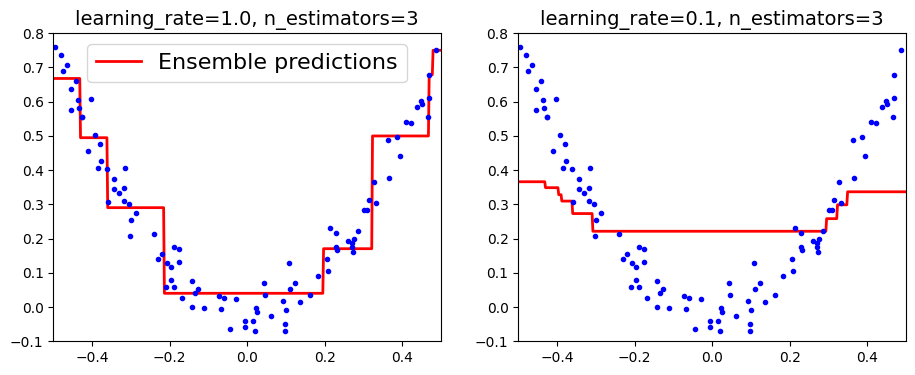

In [ ]:
plt.figure(figsize=(11, 4))

plt.subplot(121)
plot_predictions([gbrt], X, y, axes=[-0.5, 0.5, -0.1, 0.8], label="Ensemble predictions")
plt.title("learning_rate={}, n_estimators={}".format(gbrt.learning_rate, gbrt.n_estimators), fontsize=14)

plt.subplot(122)
plot_predictions([gbrt_l], X, y, axes=[-0.5, 0.5, -0.1, 0.8])
plt.title("learning_rate={}, n_estimators={}".format(gbrt_l.learning_rate, gbrt_l.n_estimators), fontsize=14)

plt.show()

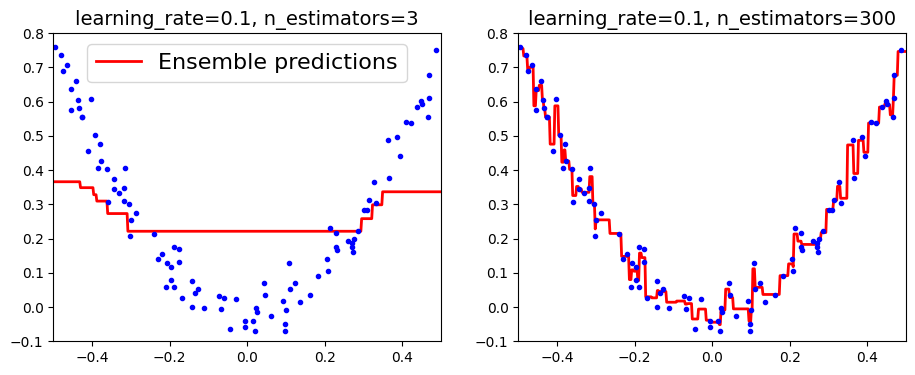

In [ ]:
plt.figure(figsize=(11, 4))

plt.subplot(121)
plot_predictions([gbrt_l], X, y, axes=[-0.5, 0.5, -0.1, 0.8], label="Ensemble predictions")
plt.title("learning_rate={}, n_estimators={}".format(gbrt_l.learning_rate, gbrt_l.n_estimators), fontsize=14)

plt.subplot(122)
plot_predictions([gbrt_ll], X, y, axes=[-0.5, 0.5, -0.1, 0.8])
plt.title("learning_rate={}, n_estimators={}".format(gbrt_ll.learning_rate, gbrt_ll.n_estimators), fontsize=14)

plt.show()

### LightGBM

LightGMB is a high-performance gradient boosting based on Decision Tree.

Key features:

* **Histogram-based Algorithms**: Uses discretized continuous features into histograms for faster computation, during computation, only calculate the splitting gain for each box rather than each data point
* **Leaf-wise Tree Growth**: Grows trees vertically by splitting the leaf with the highest loss reduction

Steps:

- **Feature Binning**: Transform continuous feature values into discrete intervals.

- **Iteratively Build Trees**:
  - In each iteration, select the leaf node from the current tree that minimizes error reduction the most to split further.
  - Calculate the splitting gain for each bin and select the optimal split.

- **Update Model**: Add the predictions from the new tree to the current model.

- **Output Model**: Output the final model after all iterations are completed.


| Feature           | GBDT                           | LightGBM                           |
|-------------------|--------------------------------|------------------------------------|
| Core Concept      | Iteratively constructs decision trees to fit residuals | Fast GBDT based on a histogram     |
| Tree Building Strategy | Grows level-wise            | Grows leaf-wise                    |
| Parallelization   | Difficult                      | Supported                          |
| Suitable Data     | Small to medium-sized data     | Large-scale data, high-dimensional features |
| Advantages        | Flexible model, capable of handling non-linear relationships | Fast training, low resource usage, suitable for high-dimensional and large data |
| Disadvantages     | Long training time, difficult to parallelize | Risk of overfitting, especially in small datasets |


Assuming a set of multi-classification samples

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.datasets import make_classification
from sklearn.ensemble import GradientBoostingClassifier
import lightgbm as lgb
import time
import matplotlib.pyplot as plt
import seaborn as sns

np.random.seed(42)

X, y = make_classification(n_samples=10000, n_features=10, n_informative=6,
                           n_redundant=2, n_classes=2, random_state=42)


X = pd.DataFrame(X, columns=[f"feature_{i}" for i in range(10)])
for i in range(5, 10):
    X[f'feature_{i}'] = pd.cut(X[f'feature_{i}'], bins=4, labels=[0, 1, 2, 3])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
gbdt_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

start_time = time.time()
gbdt_model.fit(X_train, y_train)
gbdt_train_time = time.time() - start_time

y_pred_gbdt = gbdt_model.predict(X_test)
y_proba_gbdt = gbdt_model.predict_proba(X_test)[:, 1]
gbdt_accuracy = accuracy_score(y_test, y_pred_gbdt)
gbdt_auc = roc_auc_score(y_test, y_proba_gbdt)

print(f"GBDT Accuracy: {gbdt_accuracy:.4f}")
print(f"GBDT AUC: {gbdt_auc:.4f}")
print(f"GBDT Training Time: {gbdt_train_time:.4f} seconds")

GBDT Accuracy: 0.8963
GBDT AUC: 0.9611
GBDT Training Time: 1.6374 seconds


In [ ]:
train_data = lgb.Dataset(X_train, label=y_train, categorical_feature=[f'feature_{i}' for i in range(5, 10)])
test_data = lgb.Dataset(X_test, label=y_test, categorical_feature=[f'feature_{i}' for i in range(5, 10)], reference=train_data)

lgb_params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'metric': ['auc'],
    'num_leaves': 31,
    'learning_rate': 0.1,
    'verbose': -1
}

start_time = time.time()
lgb_model = lgb.train(lgb_params, train_data, valid_sets=[test_data], num_boost_round=100,
                      callbacks=[lgb.early_stopping(stopping_rounds=10, verbose=False)])  # Pass early stopping as a callback
lgb_train_time = time.time() - start_time

y_proba_lgb = lgb_model.predict(X_test)
y_pred_lgb = (y_proba_lgb >= 0.5).astype(int)
lgb_accuracy = accuracy_score(y_test, y_pred_lgb)
lgb_auc = roc_auc_score(y_test, y_proba_lgb)

print(f"LightGBM Accuracy: {lgb_accuracy:.4f}")
print(f"LightGBM AUC: {lgb_auc:.4f}")
print(f"LightGBM Training Time: {lgb_train_time:.4f} seconds")

LightGBM Accuracy: 0.9380
LightGBM AUC: 0.9763
LightGBM Training Time: 0.2270 seconds


<ipython-input-10-c152ff2e25bc>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['GBDT', 'LightGBM'], y=[gbdt_train_time, lgb_train_time], ax=axes[0], palette="viridis")
<ipython-input-10-c152ff2e25bc>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['GBDT', 'LightGBM'], y=[gbdt_accuracy, lgb_accuracy], ax=axes[1], palette="viridis")
<ipython-input-10-c152ff2e25bc>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['GBDT', 'LightGBM'], y=[gbdt_auc, lgb_auc], ax=axes[2], palette="viridis")


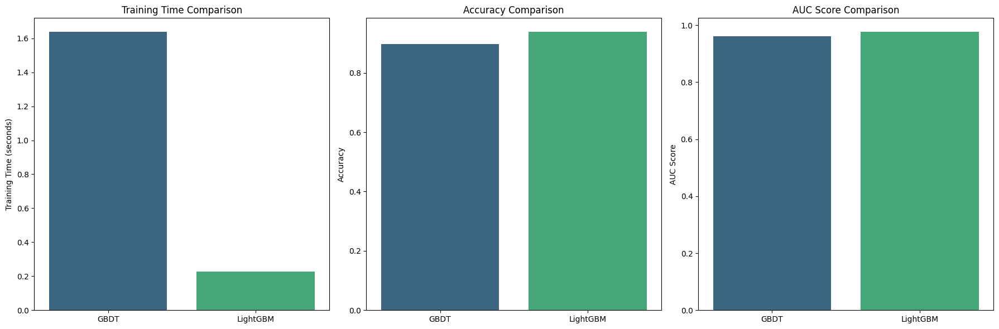

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))


sns.barplot(x=['GBDT', 'LightGBM'], y=[gbdt_train_time, lgb_train_time], ax=axes[0], palette="viridis")
axes[0].set_title('Training Time Comparison')
axes[0].set_ylabel('Training Time (seconds)')


sns.barplot(x=['GBDT', 'LightGBM'], y=[gbdt_accuracy, lgb_accuracy], ax=axes[1], palette="viridis")
axes[1].set_title('Accuracy Comparison')
axes[1].set_ylabel('Accuracy')


sns.barplot(x=['GBDT', 'LightGBM'], y=[gbdt_auc, lgb_auc], ax=axes[2], palette="viridis")
axes[2].set_title('AUC Score Comparison')
axes[2].set_ylabel('AUC Score')

plt.tight_layout()
plt.show()

### XGBoost


XGBoost (Extreme Gradient Boosting) is an optimized distributed **gradient boosting** library designed to be highly efficient, flexible, and portable.

It has become one of the most popular machine learning algorithms due to its performance and speed, especially in structured or tabular data.

How it works:
* Gradient Boosting involves building an ensemble of weak learners (typically decision trees) in a stage-wise manner
* Each new tree is trained on the residuals (errors) of the previous trees

**Objective function:**

XGBoost combines the training loss and a regularization term:
$$
\text{Obj} = \sum_{i=1}^{n} l(y_i, \hat{y}_i^{(t)}) + \sum_{k=1}^{t} \Omega(f_k)
$$

- $ l $: Differentiable convex loss function that measures the difference between the prediction $ \hat{y}_i^{(t)} $ and the target $ y_i $.
- $ \Omega(f_k) $: Regularization term for the $ k $-th tree, controlling model complexity.


**Gradient Boosting:**

XGBoost minimize the loss function by gradually adding trees, every steps take is based on the previous step to improve the prediction

To say, we have t-1 trees, the goal of $t$-th tree is to minimize the loss function:

$$
\mathcal{L}^{(t)} = \sum_{i=1}^{n} l \left( y_i, \hat{y}_i^{(t-1)} + f_t(x_i) \right) + \Omega(f_t)
$$
* $\hat{y}_i^{(t-1)}$ is the prediction of the previous $t-1$ trees
* $f_t(x_i)$ is the prediction of the $t$-th tree

**Taylor Expansion:**

In order to simplify the objective function, we do second order taylor expansion for the loss function:

$$
\mathcal{L}^{(t)} \approx \sum_{i=1}^{n} \left[ l \left( y_i, \hat{y}_i^{(t-1)} \right) + g_i f_t(x_i) + \frac{1}{2} h_i f_t(x_i)^2 \right] + \Omega(f_t)
$$

* $g_i = \frac{\partial l(y_i, \hat{y}_i^{(t-1)})}{\partial \hat{y}_i^{(t-1)}}$ is the first order derivative (gradient)
* $h_i = \frac{\partial^2 l(y_i, \hat{y}_i^{(t-1)})}{\partial \hat{y}_i^{(t-1)}{}^2}$ is the second order derivative (Hessian)

After truncate the constant, we have:

$$
\mathcal{L}^{(t)} \approx \sum_{i=1}^{n} \left[ g_i f_t(x_i) + \frac{1}{2} h_i f_t(x_i)^2 \right] + \Omega(f_t)
$$

**Regularization Term:**
$$
\Omega(f) = \gamma T + \frac{1}{2} \lambda \sum_{j=1}^{T} w_j^2
$$

- $ T $: Number of leaves in the tree.
- $ w_j $: The score/weight of leaf $ j $.
- $ \gamma $ and $ \lambda $ are regularization parameters controlling the penalty for adding a new leaf and the L2 regularization on leaf weights, respectively.

**Optimizing Objective:**

Bring those into objective function:
$$
\mathcal{L}^{(t)} = \sum_{i=1}^{n} \left[ g_i w_{q(x_i)} + \frac{1}{2} h_i w_{q(x_i)}^2 \right] + \gamma T + \frac{1}{2}\lambda \sum_{j=1}^{T} w_j^2
$$

Sum up the samples for one leaf node:
$$
\mathcal{L}^{(t)} = \sum_{j=1}^{T} \left[ G_j w_j + \frac{1}{2} (H_j + \lambda) w_j^2 \right] + \gamma T
$$

* $G_j = \sum_{i \in I_j} g_i $ is the sum of the $j$-th leaf node gradient
* $H_j = \sum_{i \in I_j} h_i $ is the sum of the $j$-th leaf node Hessian

By derivative $\mathcal{L}$ and set to 0, we have the optimal weight of leaf node:

$$
w_j^* = -\frac{G_j}{H_j + \lambda}
$$

Take the optimal weight into Objective function, we get the minimized objective value:
$$
\mathcal{L}^{(t)} = -\frac{1}{2} \sum_{j=1}^{T} \frac{G_j^2}{H_j + \lambda} + \gamma T
$$

**Tree Pruning:**

In order to find the optimal pruning point, XGBoost compute the gain of each candidate point:
$$
\text{Gain} = \frac{1}{2} \left( \frac{G_L^2}{H_L + \lambda} + \frac{G_R^2}{H_R + \lambda} - \frac{(G_L + G_R)^2}{H_L + H_R + \lambda} \right) - \gamma
$$

- $G_L $ and $ H_L $ are the gradient sum and Hessian sum of left children leaf
- $ G_R $ and $ H_R $ are the gradient sum and Hessian sum of right children leaf

* **Loss-guided Tree Growth:** Instead of growing the tree to full depth, XGBoost uses a depth-first approach with loss reduction as the criterion.
* **Pruning Strategy:** It prunes branches with negative loss gain, which do not contribute to improving the model.

**XGBoost Overall Algorithm Flow:**

1. **Initialization**:
   - Initialize the prediction value $\hat{y}_i^{(0)}$ to a constant value (usually the average of the target values).

2. **Iteration**:
   - For each tree, perform the following steps:

   1. **Calculate Gradient and Hessian**:
      - Calculate the gradient $g_i$ and Hessian $h_i$ for each sample.

   2. **Construct the Tree**:
      - Recursively split nodes. Calculate the gain for each candidate split point and select the one with the highest gain until the leaf node count or gain falls below a predefined threshold.

   3. **Calculate Leaf Weights**:
      - Calculate the weight $w_j$ for each leaf node based on the gradient and Hessian.

   4. **Update Predictions**:
      - Update the prediction for each sample:
      $$
      \hat{y}_i^{(t)} = \hat{y}_i^{(t-1)} + f_t(x_i)
      $$

By iterating the above steps, trees are continuously built, each improving upon the previous one, ultimately resulting in a strong model.


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mattiuzc/stock-exchange-data")

100%|██████████| 4.56M/4.56M [00:01<00:00, 4.04MB/s]

Extracting files...


In [ ]:
path

'/root/.cache/kagglehub/datasets/mattiuzc/stock-exchange-data/versions/2'

In [ ]:
import os
print(os.listdir(path))

['indexInfo.csv', 'indexData.csv', 'indexProcessed.csv']


In [ ]:
import pandas as pd
import numpy as np
df = pd.read_csv(path + '/indexData.csv')

In [ ]:
df.head()

,Index,Date,Open,High,Low,Close,Adj Close,Volume
0,NYA,1965-12-31,528.690002,528.690002,528.690002,528.690002,528.690002,0.0
1,NYA,1966-01-03,527.210022,527.210022,527.210022,527.210022,527.210022,0.0
2,NYA,1966-01-04,527.840027,527.840027,527.840027,527.840027,527.840027,0.0
3,NYA,1966-01-05,531.119995,531.119995,531.119995,531.119995,531.119995,0.0
4,NYA,1966-01-06,532.070007,532.070007,532.070007,532.070007,532.070007,0.0




---



In [ ]:
df = pd.read_csv('/content/drive/MyDrive/MD/Learning is Learning/Data_cn/stock_data.csv')

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

In [ ]:
df = df.drop(['Name'], axis=1)

In [ ]:
df.head()

,Open,High,Low,Close,Volume
Date,,,,,
2006-01-03,39.69,41.22,38.79,40.91,24232729
2006-01-04,41.22,41.90,40.77,40.97,20553479
2006-01-05,40.93,41.73,40.85,41.53,12829610
2006-01-06,42.88,43.57,42.80,43.21,29422828
2006-01-09,43.10,43.66,42.82,43.42,16268338


In [ ]:
df.isnull().sum()

,0
Open,0
High,0
Low,0
Close,0
Volume,0


In [ ]:
df.dropna(inplace=True)

Feature Engineer

In [ ]:
df['Price Change'] = df['Close'] - df['Open']
df['SMA_5'] = df['Close'].rolling(window=5).mean()  # SMA_5 represents the average of the stock's closing prices over the last 5 periods
df['SMA_20'] = df['Close'].rolling(window=20).mean()  # SMA_20 represents the average of the stock's closing prices over the last 20 periods
df['Volatility'] = (df['High'] - df['Low']) / df['Low']  # Volatility

df = df.dropna()

X = df.drop(['Close'], axis=1)
y = df['Close']

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

train_dmatrix = xgb.DMatrix(X_train, label=y_train)
test_dmatrix = xgb.DMatrix(X_test, label=y_test)

params = {
    'objective': 'reg:squarederror',  # regression
    'max_depth': 5, # max depth of the tree
    'learning_rate': 0.1
}

xg_reg = xgb.train(params, train_dmatrix, num_boost_round=100)

preds = xg_reg.predict(test_dmatrix)

mse = mean_squared_error(y_test, preds)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 47.79774602393195


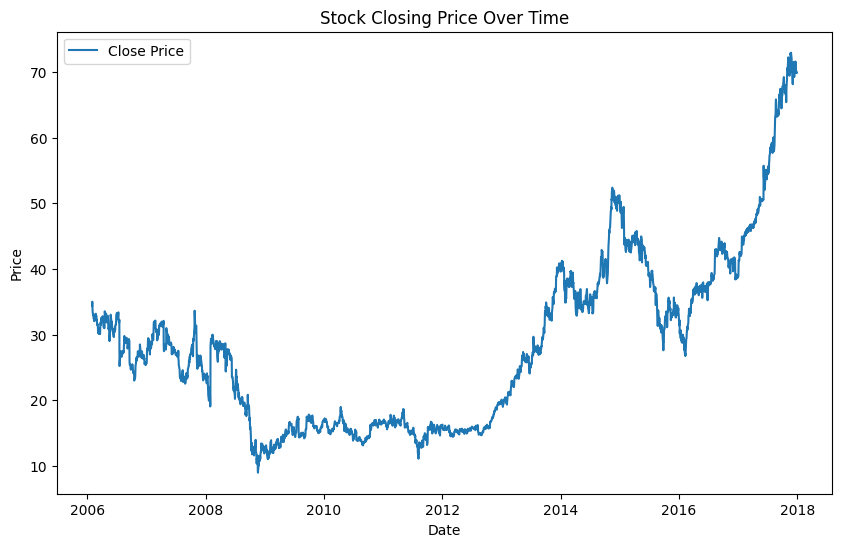

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(df.index, df['Close'], label='Close Price')
plt.title('Stock Closing Price Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

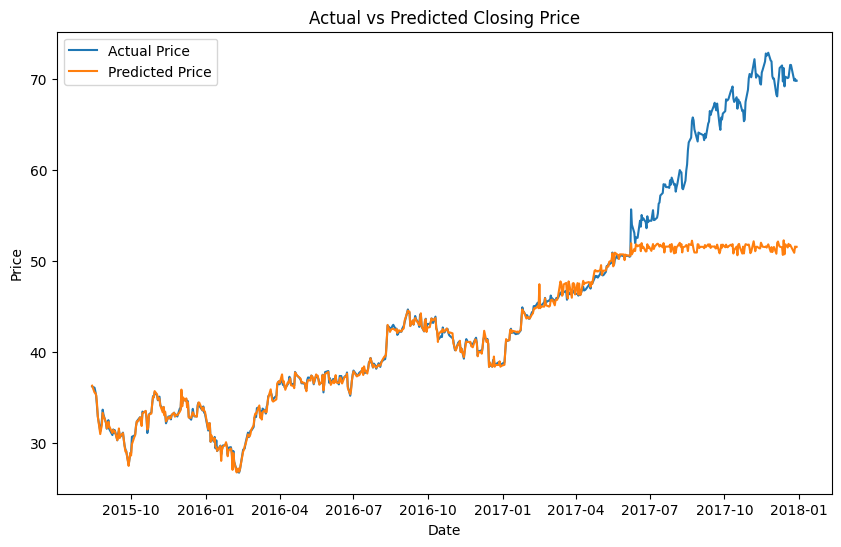

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(y_test.index, y_test, label='Actual Price')
plt.plot(y_test.index, preds, label='Predicted Price')
plt.title('Actual vs Predicted Closing Price')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

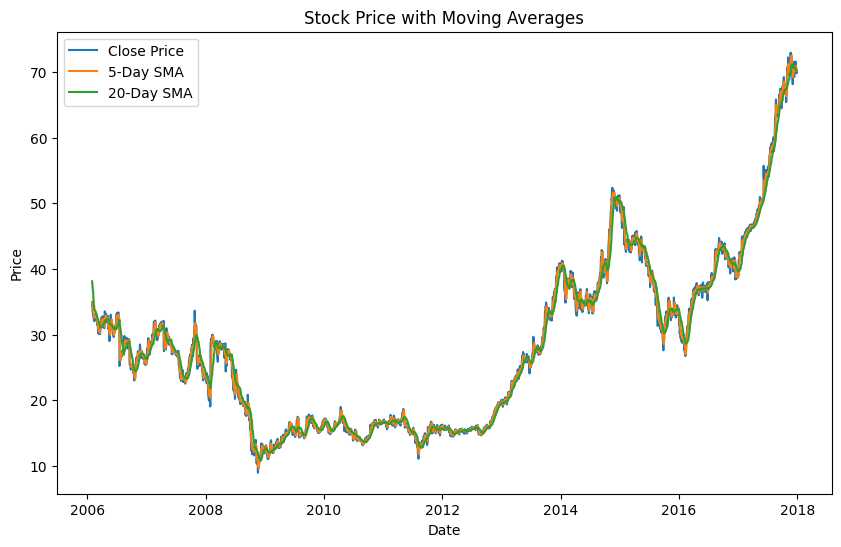

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['Close'], label='Close Price')
plt.plot(df.index, df['SMA_5'], label='5-Day SMA')
plt.plot(df.index, df['SMA_20'], label='20-Day SMA')
plt.title('Stock Price with Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

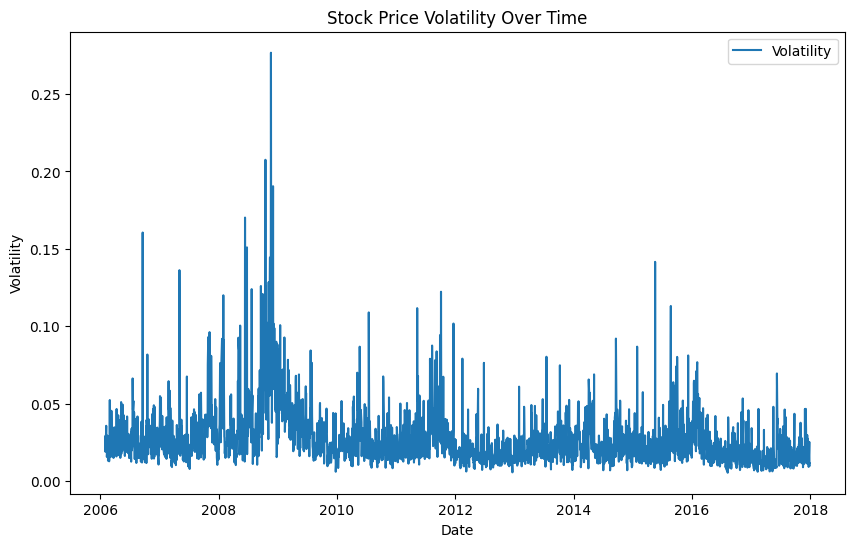

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['Volatility'], label='Volatility')
plt.title('Stock Price Volatility Over Time')
plt.xlabel('Date')
plt.ylabel('Volatility')
plt.legend()
plt.show()

GridSearch for optimization

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300]
}

xgb_model = xgb.XGBRegressor(objective='reg:squarederror')
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', verbose=1)
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}


In [ ]:
params_op = {
    'objective': 'reg:squarederror',  # regression
    'max_depth': 3, # max depth of the tree
    'learning_rate': 0.1,
    'n_estimators': 300
}


In [ ]:
xg_reg = xgb.train(params_op, train_dmatrix, num_boost_round=300)

preds = xg_reg.predict(test_dmatrix)

mse = mean_squared_error(y_test, preds)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 47.03949752707201


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [02:19:17] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


In [ ]:
params_r = {
    'objective': 'reg:squarederror',
    'max_depth': 3,
    'learning_rate': 0.1,
    'n_estimators': 300,
    'alpha': 0.1,  # L1正则化项权重
    'lambda': 0.1  # L2正则化项权重
}

In [ ]:
xg_reg = xgb.train(params_r, train_dmatrix, num_boost_round=300)

preds = xg_reg.predict(test_dmatrix)

mse = mean_squared_error(y_test, preds)
print(f"Mean Squared Error: {mse}")

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [02:19:44] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


Mean Squared Error: 46.498868497581526




---



In [ ]:
import numpy as np
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

train_data = pd.read_csv('/content/drive/MyDrive/MD/Learning is Learning/Data_cn/housing.csv')
train_data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [ ]:
train_data.isnull().sum()

,0
longitude,0
latitude,0
housing_median_age,0
total_rooms,0
total_bedrooms,207
population,0
households,0
median_income,0
median_house_value,0
ocean_proximity,0


In [ ]:
train_data['total_bedrooms'].fillna(train_data['total_bedrooms'].median(), inplace=True)

# Feature construction
train_data['rooms_per_household'] = train_data['total_rooms'] / train_data['households']
train_data['bedrooms_per_room'] = train_data['total_bedrooms'] / train_data['total_rooms']
train_data['population_per_household'] = train_data['population'] / train_data['households']

train_data = pd.get_dummies(train_data, columns=['ocean_proximity'], drop_first=True)

X = train_data.drop('median_house_value', axis=1)
y = train_data['median_house_value']

<ipython-input-38-cdf84912a449>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_data['total_bedrooms'].fillna(train_data['total_bedrooms'].median(), inplace=True)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
xgb_reg = xgb.XGBRegressor()

xgb_reg.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

RMSE: 47135.7058


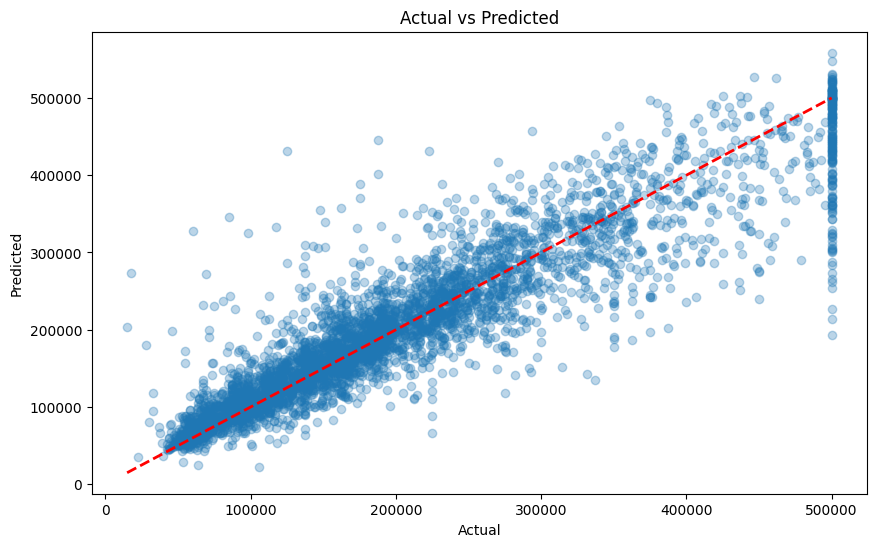

In [ ]:
y_pred = xgb_reg.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE: {rmse:.4f}")

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.3)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')
plt.show()

In [ ]:
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1]
}

grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, scoring='neg_mean_squared_error', cv=3, verbose=1)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")


Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300, 'subsample': 1}


Optimized RMSE: 44715.8687


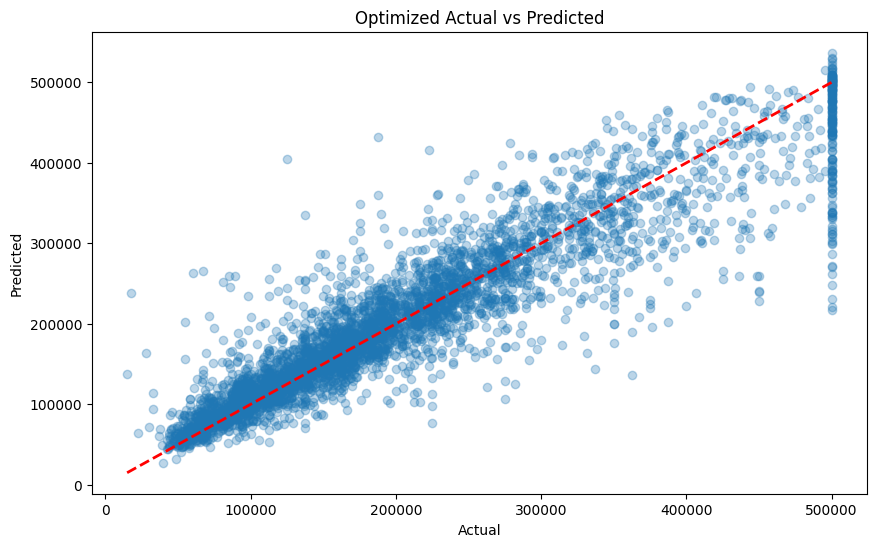

In [ ]:
xgb_reg_optimized = xgb.XGBRegressor(**best_params)
xgb_reg_optimized.fit(X_train, y_train)

y_pred_optimized = xgb_reg_optimized.predict(X_test)


rmse_optimized = np.sqrt(mean_squared_error(y_test, y_pred_optimized))
print(f"Optimized RMSE: {rmse_optimized:.4f}")

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_optimized, alpha=0.3)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Optimized Actual vs Predicted')
plt.show()

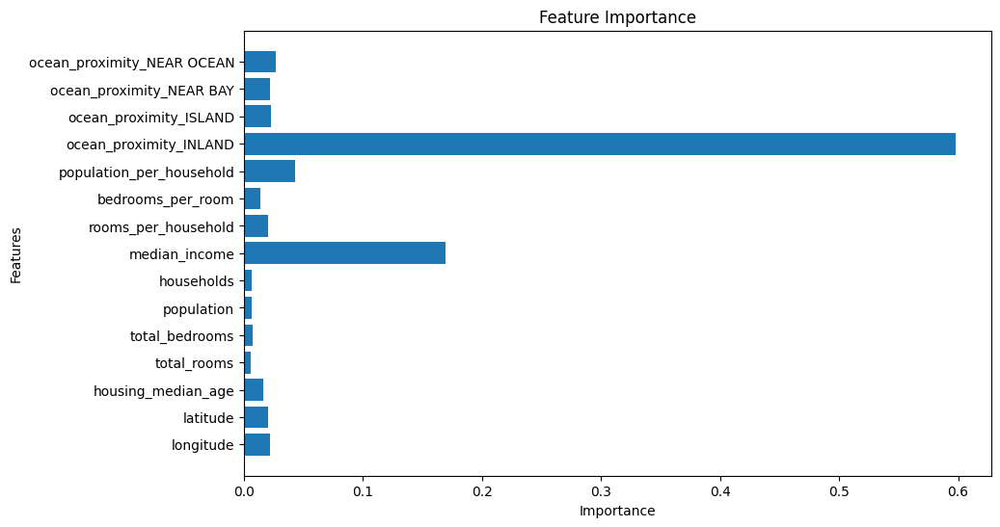

In [ ]:
importance = xgb_reg_optimized.feature_importances_
features = X.columns

plt.figure(figsize=(10, 6))
plt.barh(features, importance)
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importance')
plt.show()

### Stacking

* Combine multiple base learners to reduce variance
  * Base learners can be different model types
  * Linearly combine base learners outputs by learned parameters
  * Go through a final fully connected layer and output
  * Every model training on the original data
* Widely used in competitions
* In comparison, bagging
  * Uses same type models
  * Uses bootstrap to get diversity



> **Multi-layer Stacking**

* Stacking base learners in multiple levels to reduce bias

  * Can use a different set of base learner at each level

* Upper levels are trained on the outputs of the below level
  (the output of the firt stacking layer can be the input of the next stacking layer)
  * Concat orginal inputs to the upper level may helps

* Quite likely to overfit




> **Overfitting in Multi-layer Stacking**

* Train learners from different levels on different data to alleviate overfitting

  * Split training data into A and B, train L1 learners on A, predict on B to generate inputs to L2 learners

* Repeat k-fold bagging:

  * Train k models as in k-fold cross validation
  * Combine predictions of each model on out-of-fold data (Those data consist a data set which not been trained before)
  * Repeat step 1,2 by n times, average the n predictions of each next level training



In [ ]:
from sklearn.datasets import fetch_openml
import numpy as np
from sklearn.model_selection import train_test_split

mnist = fetch_openml('mnist_784', version=1, as_frame=False)

X_train_val, X_test, y_train_val, y_test = train_test_split(
    mnist.data, mnist.target, test_size=10000, random_state=42
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=10000, random_state=42
)


In [ ]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.svm import LinearSVC
from sklearn.neural_network import MLPClassifier


random_forest_clf = RandomForestClassifier(random_state=42)
extra_trees_clf = ExtraTreesClassifier(random_state=42)
svm_clf = LinearSVC(random_state=42)
mlp_clf = MLPClassifier(random_state=42)


estimators = [random_forest_clf, extra_trees_clf, svm_clf, mlp_clf]


for estimator in estimators:
    print("Training the", estimator)
    estimator.fit(X_train, y_train)


Training the RandomForestClassifier(random_state=42)
Training the ExtraTreesClassifier(random_state=42)
Training the LinearSVC(random_state=42)
Training the MLPClassifier(random_state=42)


In [ ]:
X_val_predictions = np.empty((len(X_val), len(estimators)), dtype=np.float32)

for index, estimator in enumerate(estimators):
    X_val_predictions[:, index] = estimator.predict(X_val)

X_val_predictions

array([[5., 5., 5., 5.],
       [8., 8., 8., 8.],
       [2., 2., 2., 2.],
       ...,
       [7., 7., 7., 7.],
       [6., 6., 6., 6.],
       [7., 7., 7., 7.]], dtype=float32)

In [ ]:
rbd_blender = RandomForestClassifier(n_estimators=200, oob_score=True, random_state=42)
rbd_blender.fit(X_val_predictions, y_val)

RandomForestClassifier(n_estimators=200, oob_score=True, random_state=42)

In [ ]:
rbd_blender.oob_score_

0.9697

## SVM

In [ ]:
from sklearn.datasets import load_iris
iris = load_iris()

In [ ]:
dir(iris)

['DESCR',
 'data',
 'data_module',
 'feature_names',
 'filename',
 'frame',
 'target',
 'target_names']

In [ ]:
iris.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [ ]:
df = pd.DataFrame(iris.data,columns=iris.feature_names)
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [ ]:
df['target'] = iris.target
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [ ]:
df[df.target==2].head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
100,6.3,3.3,6.0,2.5,2
101,5.8,2.7,5.1,1.9,2
102,7.1,3.0,5.9,2.1,2
103,6.3,2.9,5.6,1.8,2
104,6.5,3.0,5.8,2.2,2


In [ ]:
df['flower_name'] =df.target.apply(lambda x: iris.target_names[x])
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target,flower_name
0,5.1,3.5,1.4,0.2,0,setosa
1,4.9,3.0,1.4,0.2,0,setosa
2,4.7,3.2,1.3,0.2,0,setosa
3,4.6,3.1,1.5,0.2,0,setosa
4,5.0,3.6,1.4,0.2,0,setosa


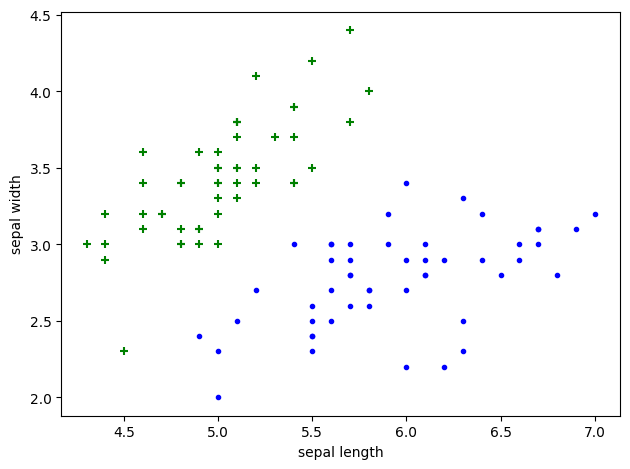

In [ ]:
from matplotlib import pyplot as plt
%matplotlib inline
df0 = df[df.target==0]
df1 = df[df.target==1]
df2 = df[df.target==2]
plt.scatter(df0['sepal length (cm)'], df0['sepal width (cm)'],color="green",marker='+')
plt.scatter(df1['sepal length (cm)'], df1['sepal width (cm)'],color="blue",marker='.')
plt.xlabel('sepal length')
plt.ylabel('sepal width')
plt.tight_layout()

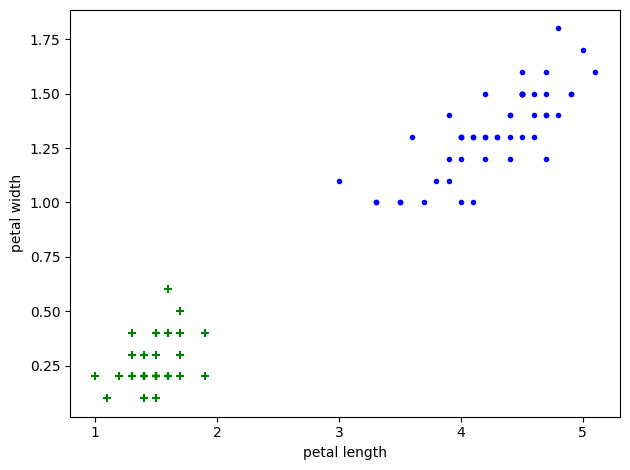

In [ ]:
plt.scatter(df0['petal length (cm)'], df0['petal width (cm)'],color="green",marker='+')
plt.scatter(df1['petal length (cm)'], df1['petal width (cm)'],color="blue",marker='.')
plt.xlabel('petal length')
plt.ylabel('petal width')
plt.tight_layout()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(['target','flower_name'],axis='columns'), df.target, test_size=0.2)

In [ ]:
from sklearn import svm
model = svm.SVC()
model.fit(X_train, y_train)

SVC()

In [ ]:
model.score(X_test, y_test)

1.0



---
Exercies


In [ ]:
from sklearn.datasets import load_digits
digit = load_digits()

In [ ]:
digit.target

array([0, 1, 2, ..., 8, 9, 8])

In [ ]:
df = pd.DataFrame(digit.data,digit.target)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0


In [ ]:
df['target'] = digit.target
df.head()

,0,1,2,3,4,5,6,7,8,9,...,55,56,57,58,59,60,61,62,63,target
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0,0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0,1
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0,2
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0,3
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0,4


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df.drop('target',axis='columns'),df.target,test_size=0.2)

In [ ]:
model_rbf = svm.SVC(kernel='rbf')
model_rbf.fit(X_train, y_train)

SVC()

In [ ]:
model_rbf.score(X_test, y_test)

0.9944444444444445

In [ ]:
model_linear = svm.SVC(kernel='linear')
model_linear.fit(X_train, y_train)

SVC(kernel='linear')

In [ ]:
model_linear.score(X_test, y_test)

0.9833333333333333

## K-means


In [ ]:
from sklearn.cluster import KMeans
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from matplotlib import pyplot as plt
%matplotlib inline

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/income.csv')
df.head()

,Name,Age,Income($)
0,Rob,27,70000
1,Michael,29,90000
2,Mohan,29,61000
3,Ismail,28,60000
4,Kory,42,150000


Text(0, 0.5, 'Income')

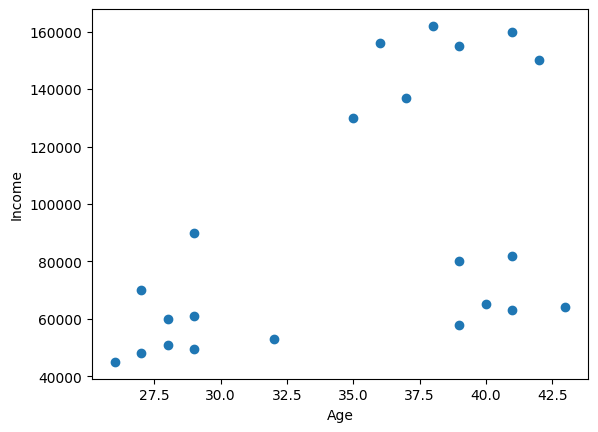

In [ ]:
plt.scatter(df.Age,df['Income($)'])
plt.xlabel('Age')
plt.ylabel('Income')

In [ ]:
km = KMeans(n_clusters=3)
km

KMeans(n_clusters=3)

In [ ]:
y_pred = km.fit_predict(df[['Age','Income($)']])
df['cluster'] = y_pred
df.head()

,Name,Age,Income($),cluster
0,Rob,27,70000,2
1,Michael,29,90000,0
2,Mohan,29,61000,2
3,Ismail,28,60000,2
4,Kory,42,150000,1


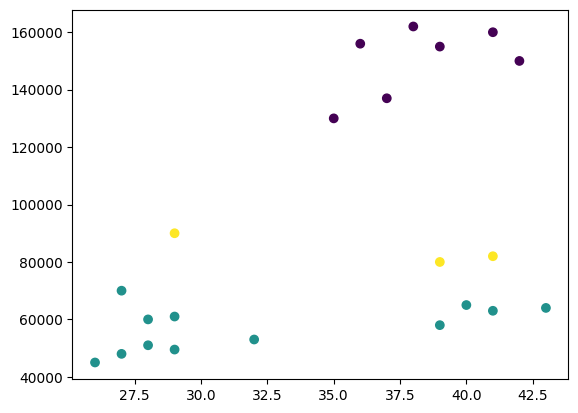

In [ ]:
plt.scatter(df.Age,df['Income($)'],c=y_pred)

In [ ]:
# scaling
scaler = MinMaxScaler()
scaler.fit(df[['Income($)']])
df['Income($)'] = scaler.transform(df[['Income($)']])
scaler.fit(df[['Age']])
df['Age'] = scaler.transform(df[['Age']])
df.head()

,Name,Age,Income($),cluster
0,Rob,0.058824,0.213675,1
1,Michael,0.176471,0.384615,1
2,Mohan,0.176471,0.136752,1
3,Ismail,0.117647,0.128205,1
4,Kory,0.941176,0.897436,2


In [ ]:
km = KMeans(n_clusters=3)
y_pred = km.fit_predict(df[['Age','Income($)']])
df['cluster'] = y_pred
df.head()

,Name,Age,Income($),cluster
0,Rob,0.058824,0.213675,1
1,Michael,0.176471,0.384615,1
2,Mohan,0.176471,0.136752,1
3,Ismail,0.117647,0.128205,1
4,Kory,0.941176,0.897436,2


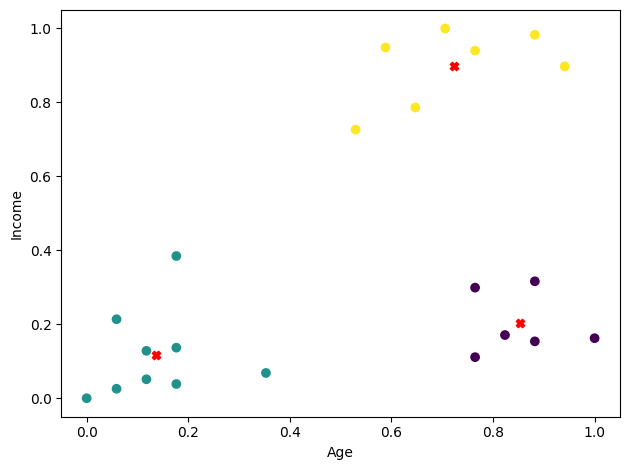

In [ ]:
plt.scatter(df.Age,df['Income($)'],c=y_pred)
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='red',marker='X')
plt.xlabel('Age')
plt.ylabel('Income')
plt.tight_layout()

In [ ]:
k_rng = range(1,10)
sse = []
for k in k_rng:
  km = KMeans(n_clusters=k)
  km.fit(df[['Age','Income($)']])
  sse.append(km.inertia_)

In [ ]:
sse

[5.434011511988176,
 2.345614491472593,
 0.4750783498553095,
 0.4028477025733999,
 0.2761293767785354,
 0.31127658615237364,
 0.20850738640198316,
 0.15159646490421638,
 0.11304517838728051]

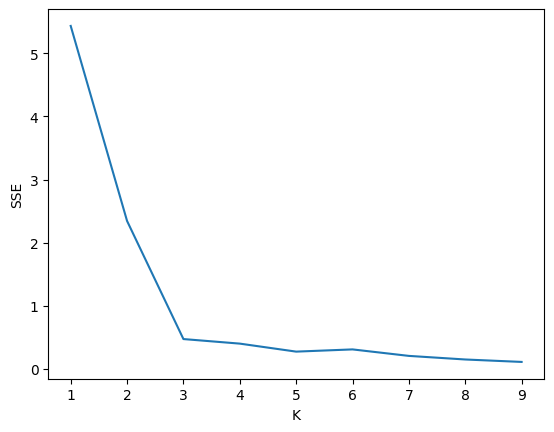

In [ ]:
plt.xlabel('K')
plt.ylabel('SSE')
plt.plot(k_rng,sse)



---
Exercise




In [ ]:
from sklearn.cluster import KMeans
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from matplotlib import pyplot as plt
from sklearn.datasets import load_iris
%matplotlib inline

In [ ]:
iris = load_iris()
df = pd.DataFrame(iris.data,columns=iris.feature_names)
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [ ]:
df['flower'] = iris.target
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),flower
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [ ]:
df.drop(['sepal length (cm)', 'sepal width (cm)', 'flower'],axis='columns',inplace=True)


In [ ]:
km = KMeans(n_clusters=3)
yp = km.fit_predict(df)
df['cluster'] = yp

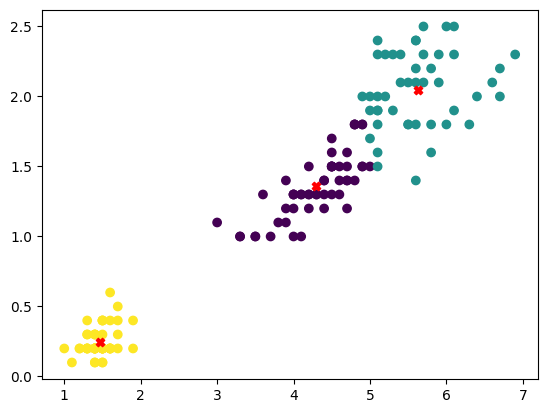

In [ ]:
plt.scatter(df['petal length (cm)'],df['petal width (cm)'],c=yp)
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='red',marker='X')

In [ ]:
sse = []
k_rng = range(1,10)
for k in k_rng:
  km = KMeans(n_clusters=k)
  km.fit(df)
  sse.append(km.inertia_)

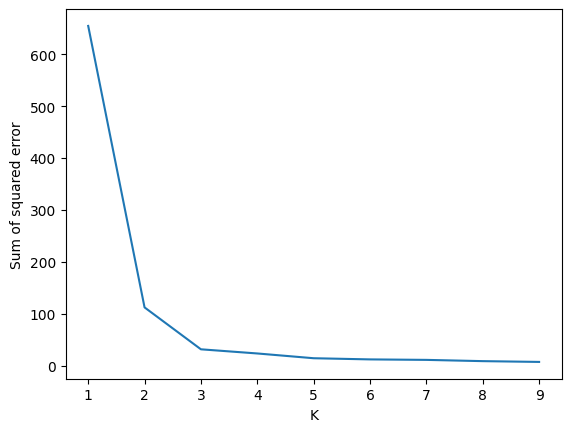

In [ ]:
plt.xlabel('K')
plt.ylabel('Sum of squared error')
plt.plot(k_rng,sse)

## K Nearest Neighbors  (KNN)

In [ ]:
iris = load_iris()
df = pd.DataFrame(iris.data,columns=iris.feature_names)
df['target'] = iris.target
df['flower'] = df.target.apply(lambda x: iris.target_names[x])

In [ ]:
%matplotlib inline
df0 = df[df.target==0]
df1 = df[df.target==1]
df2 = df[df.target==2]

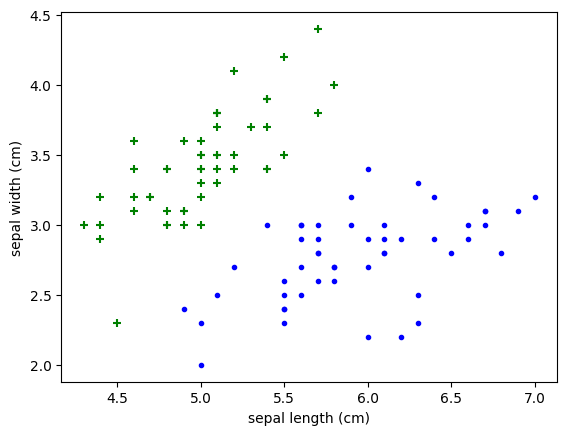

In [ ]:
plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')
plt.scatter(df0['sepal length (cm)'], df0['sepal width (cm)'],color="green",marker='+')
plt.scatter(df1['sepal length (cm)'], df1['sepal width (cm)'],color="blue",marker='.')

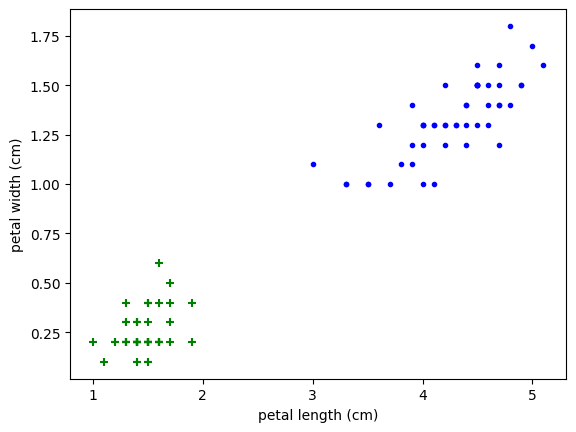

In [ ]:
plt.xlabel('petal length (cm)')
plt.ylabel('petal width (cm)')
plt.scatter(df0['petal length (cm)'], df0['petal width (cm)'],color="green",marker='+')
plt.scatter(df1['petal length (cm)'], df1['petal width (cm)'],color="blue",marker='.')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(['target','flower'],axis='columns'),df.target,test_size=0.2)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
knn.score(X_test, y_test)

0.9

In [ ]:
from sklearn.metrics import confusion_matrix
y_pred = knn.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

array([[ 8,  0,  0],
       [ 0,  9,  3],
       [ 0,  0, 10]])

In [ ]:
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

Text(95.72222222222221, 0.5, 'Truth')

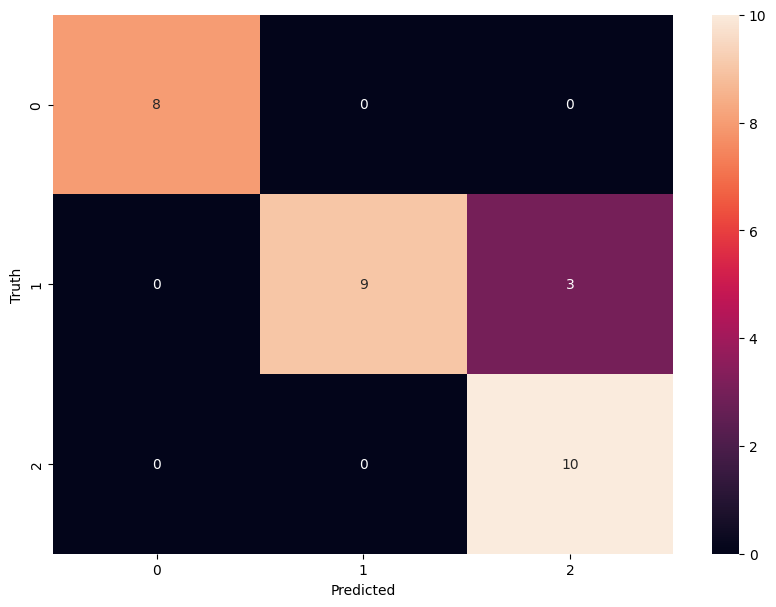

In [ ]:
import seaborn as sn
plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         8
           1       1.00      0.75      0.86        12
           2       0.77      1.00      0.87        10

    accuracy                           0.90        30
   macro avg       0.92      0.92      0.91        30
weighted avg       0.92      0.90      0.90        30





---

Exercise


In [ ]:
from sklearn.datasets import load_digits
digits = load_digits()

In [ ]:
df = pd.DataFrame(digits.data,columns=digits.feature_names)
X_train, X_test, y_train, y_test = train_test_split(df,digits.target,test_size=0.2)

In [ ]:
knn_ex = KNeighborsClassifier(n_neighbors=5)
knn_ex.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
knn_ex.score(X_test, y_test)

0.9888888888888889

In [ ]:
y_pred_ex = knn_ex.predict(X_test)

In [ ]:
scores = []

for k in range(1,20):
  knn = KNeighborsClassifier(n_neighbors=k)
  knn.fit(X_train, y_train)
  scores.append({'k': k, 'score': knn.score(X_test, y_test)})

scores = pd.DataFrame(scores)
scores.sort_values(by='score', ascending=False)

,k,score
0,1,0.994444
2,3,0.994444
1,2,0.994444
3,4,0.991667
5,6,0.991667
4,5,0.988889
7,8,0.986111
11,12,0.986111
6,7,0.983333
10,11,0.983333


Text(95.72222222222221, 0.5, 'Truth')

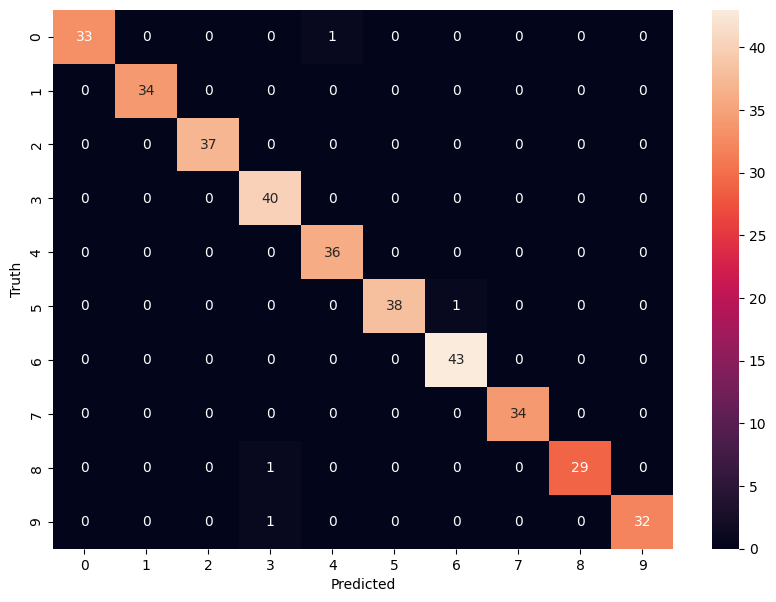

In [ ]:
cm_ex = confusion_matrix(y_test, y_pred_ex)
plt.figure(figsize = (10,7))
sn.heatmap(cm_ex, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [ ]:
print(classification_report(y_test, y_pred_ex))

              precision    recall  f1-score   support

           0       1.00      0.97      0.99        34
           1       1.00      1.00      1.00        34
           2       1.00      1.00      1.00        37
           3       0.95      1.00      0.98        40
           4       0.97      1.00      0.99        36
           5       1.00      0.97      0.99        39
           6       0.98      1.00      0.99        43
           7       1.00      1.00      1.00        34
           8       1.00      0.97      0.98        30
           9       1.00      0.97      0.98        33

    accuracy                           0.99       360
   macro avg       0.99      0.99      0.99       360
weighted avg       0.99      0.99      0.99       360



## GMM with EM



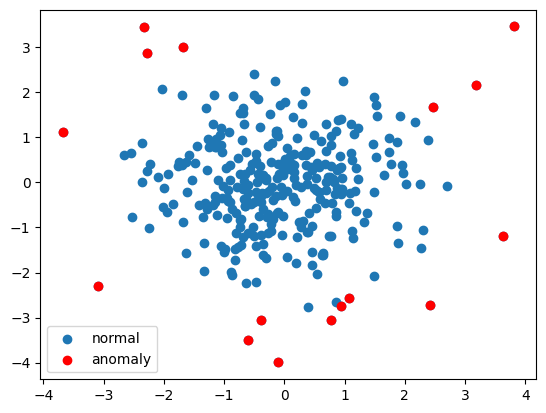

In [ ]:
import numpy as np
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

# 生成示例数据
np.random.seed(0)
# 正常数据
X_normal = np.random.normal(0, 1, (300, 2))
# 异常数据
X_anomaly = np.random.uniform(-4, 4, (20, 2))
X = np.vstack([X_normal, X_anomaly])

# 训练GMM
gmm = GaussianMixture(n_components=2, covariance_type='full')
gmm.fit(X_normal)  # 仅用正常数据训练

# 计算概率密度
probs = gmm.score_samples(X)

# 设定阈值
threshold = np.percentile(probs, 5)  # 取最低5%的概率作为异常阈值

# 识别异常
anomalies = X[probs < threshold]

# 可视化
plt.scatter(X[:, 0], X[:, 1], label='normal')
plt.scatter(anomalies[:, 0], anomalies[:, 1], color='red', label='anomaly')
plt.legend()
plt.show()


## Naive Bayes

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/titanic-n.csv')
df.head()

,PassengerId,Name,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,1,"Braund, Mr. Owen Harris",3,male,22.0,1,0,A/5 21171,7.2500,NaN,S,0
1,2,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,female,38.0,1,0,PC 17599,71.2833,C85,C,1
2,3,"Heikkinen, Miss. Laina",3,female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,1
3,4,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,female,35.0,1,0,113803,53.1000,C123,S,1
4,5,"Allen, Mr. William Henry",3,male,35.0,0,0,373450,8.0500,NaN,S,0


In [ ]:
df.drop(['PassengerId','Name','SibSp','Parch','Ticket','Cabin','Embarked'],axis='columns',inplace=True)
df.head()

,Pclass,Sex,Age,Fare,Survived
0,3,male,22.0,7.2500,0
1,1,female,38.0,71.2833,1
2,3,female,26.0,7.9250,1
3,1,female,35.0,53.1000,1
4,3,male,35.0,8.0500,0


In [ ]:
target = df.Survived
inputs = df.drop('Survived',axis='columns')

In [ ]:
dummies = pd.get_dummies(inputs.Sex).astype(int)
dummies.head(3)

,female,male
0,0,1
1,1,0
2,1,0


In [ ]:
inputs = inputs.drop('Sex',axis='columns')
inputs = pd.concat([inputs,dummies],axis='columns')
inputs.head(3)

,Pclass,Age,Fare,female,male
0,3,22.0,7.2500,0,1
1,1,38.0,71.2833,1,0
2,3,26.0,7.9250,1,0


In [ ]:
inputs.columns[inputs.isna().any()]

Index(['Age'], dtype='object')

In [ ]:
inputs.Age = inputs.Age.fillna(inputs.Age.mean())
inputs.head()

,Pclass,Age,Fare,female,male
0,3,22.0,7.2500,0,1
1,1,38.0,71.2833,1,0
2,3,26.0,7.9250,1,0
3,1,35.0,53.1000,1,0
4,3,35.0,8.0500,0,1


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(inputs,target,test_size=0.2)

In [ ]:
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(X_train,y_train)

GaussianNB()

In [ ]:
model.score(X_test,y_test)

0.8268156424581006

In [ ]:
y_test[:10]

,Survived
323,1
453,1
691,1
657,0
521,0
864,0
684,0
273,0
572,1
870,0


In [ ]:
model.predict(X_test[:10])

array([1, 0, 1, 1, 0, 0, 0, 0, 0, 0])

In [ ]:
model.predict_proba(X_test[:10])

array([[0.03584258, 0.96415742],
       [0.54849798, 0.45150202],
       [0.04943113, 0.95056887],
       [0.09416152, 0.90583848],
       [0.98772113, 0.01227887],
       [0.97432071, 0.02567929],
       [0.96232105, 0.03767895],
       [0.91710121, 0.08289879],
       [0.91963444, 0.08036556],
       [0.98854079, 0.01145921]])

In [ ]:
spam = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/spam.csv')
spam.head()

,Category,Message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


In [ ]:
spam.groupby('Category').describe()

Message                                                            \
           count unique                                                top   
Category                                                                     
ham         4825   4516                             Sorry, I'll call later   
spam         747    641  Please call our customer service representativ...   

               
         freq  
Category       
ham        30  
spam        4

In [ ]:
spam['spam'] = spam['Category'].apply(lambda x: 1 if x=='spam' else 0)
spam.head()

,Category,Message,spam
0,ham,"Go until jurong point, crazy.. Available only ...",0
1,ham,Ok lar... Joking wif u oni...,0
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,1
3,ham,U dun say so early hor... U c already then say...,0
4,ham,"Nah I don't think he goes to usf, he lives aro...",0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(spam.Message,spam.spam,test_size=0.25)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
v = CountVectorizer()
X_train_count = v.fit_transform(X_train.values)
X_train_count.toarray()[:3]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [ ]:
from sklearn.naive_bayes import MultinomialNB
model = MultinomialNB()
model.fit(X_train_count,y_train)

MultinomialNB()

In [ ]:
model.score(v.transform(X_test),y_test)

0.9877961234745154

In [ ]:
emails = ['Hey mohan, can we get together to watch football game tomorrow?',
      'Up to 20% discount on parking, exclusive offer just for you. Dont miss this reward!'
]
emails_count = v.transform(emails)
model.predict(emails_count)

array([0, 1])

In [ ]:
from sklearn.pipeline import Pipeline
clf = Pipeline([
    ('vectorizer', CountVectorizer()),
    ('nb', MultinomialNB())
])
clf.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', CountVectorizer()), ('nb', MultinomialNB())])

In [ ]:
clf.predict(emails)

array([0, 1])

In [ ]:
clf.score(X_test,y_test)

0.9849246231155779



---
Exercise



In [ ]:
from sklearn import datasets
wine = datasets.load_wine()
dir(wine)

['DESCR', 'data', 'feature_names', 'frame', 'target', 'target_names']

In [ ]:
wine.feature_names

['alcohol',
 'malic_acid',
 'ash',
 'alcalinity_of_ash',
 'magnesium',
 'total_phenols',
 'flavanoids',
 'nonflavanoid_phenols',
 'proanthocyanins',
 'color_intensity',
 'hue',
 'od280/od315_of_diluted_wines',
 'proline']

In [ ]:
wine.data[0:2]

array([[1.423e+01, 1.710e+00, 2.430e+00, 1.560e+01, 1.270e+02, 2.800e+00,
        3.060e+00, 2.800e-01, 2.290e+00, 5.640e+00, 1.040e+00, 3.920e+00,
        1.065e+03],
       [1.320e+01, 1.780e+00, 2.140e+00, 1.120e+01, 1.000e+02, 2.650e+00,
        2.760e+00, 2.600e-01, 1.280e+00, 4.380e+00, 1.050e+00, 3.400e+00,
        1.050e+03]])

In [ ]:
wine.target_names

array(['class_0', 'class_1', 'class_2'], dtype='<U7')

In [ ]:
df = pd.DataFrame(wine.data,columns=wine.feature_names)
df.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0


In [ ]:
df['target'] = wine.target
df[55:63]

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
55,13.56,1.73,2.46,20.5,116.0,2.96,2.78,0.20,2.45,6.25,0.98,3.03,1120.0,0
56,14.22,1.70,2.30,16.3,118.0,3.20,3.00,0.26,2.03,6.38,0.94,3.31,970.0,0
57,13.29,1.97,2.68,16.8,102.0,3.00,3.23,0.31,1.66,6.00,1.07,2.84,1270.0,0
58,13.72,1.43,2.50,16.7,108.0,3.40,3.67,0.19,2.04,6.80,0.89,2.87,1285.0,0
59,12.37,0.94,1.36,10.6,88.0,1.98,0.57,0.28,0.42,1.95,1.05,1.82,520.0,1
60,12.33,1.10,2.28,16.0,101.0,2.05,1.09,0.63,0.41,3.27,1.25,1.67,680.0,1
61,12.64,1.36,2.02,16.8,100.0,2.02,1.41,0.53,0.62,5.75,0.98,1.59,450.0,1
62,13.67,1.25,1.92,18.0,94.0,2.10,1.79,0.32,0.73,3.80,1.23,2.46,630.0,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(wine.data, wine.target, test_size=0.2)

In [ ]:
from sklearn.naive_bayes import GaussianNB, MultinomialNB
model_GNB = GaussianNB()
model_GNB.fit(X_train,y_train)

GaussianNB()

In [ ]:
model_GNB.score(X_test,y_test)

1.0

In [ ]:
model_MNB = MultinomialNB()
model_MNB.fit(X_train,y_train)

MultinomialNB()

In [ ]:
model_MNB.score(X_test,y_test)

0.8611111111111112


高斯朴素贝叶斯适用于连续型特征的数据，假设在给定类别的条件下，特征服从高斯分布（正态分布）。

多项式朴素贝叶斯适用于离散型特征的数据，特别是词频或计数数据，假设在给定类别的条件下，特征服从多项式分布。

伯努利朴素贝叶斯适用于二元离散特征的数据，假设在给定类别的条件下，特征服从伯努利分布，即每个特征只有两种可能的取值：出现（1）或不出现（0）。


> 场景

**高斯朴素贝叶斯：**

医学诊断（如根据患者的生理指标预测疾病）。

生物特征识别。

连续特征的分类任务。

**多项式朴素贝叶斯：**

文本分类（垃圾邮件检测、情感分析）。

文档主题识别。

基于词频的分类任务。

**伯努利朴素贝叶斯：**

文本分类中，使用词集模型，关注词的出现与否。

适用于短文本或强调词的存在性的场景。

**多项式朴素贝叶斯：**

文本分类中，使用词袋模型，关注词的出现次数。

适用于长文本或词频信息重要的场景。

## Monte Carlo


* **Theory Basic**:

1. Law of large numbers

  When the sample size of independent and identically distributed random variables tends to infinity, the sample **mean** converges to the **expected value**

  (mean - represents the average after experiment)

  (Expected value - represents the average value of the sample “predicted” prior to the experiment based on a probability distribution)
2. Central limit theorem

  When the sample size is large enough, the sample mean of an independently and identically distributed random variable approximately follows a normal distribution

* **Core Thoughts**:

1. Stochastic simulation:

  modeling the probability of a problem by simulating a large number of random events

2. Numerical Estimation:

  estimating the solution of a problem by using the statistical properties of random samples, e.g., integral values, probabilities, etc
3. Sample averaging:
  
  obtain an approximation of the expectation by averaging the function values of a random sample

* **Steps:**

1. Translating the problem to be solved into a mathematical model, usually in the form of an expectation or probability

  e.g. To compute the integral of function $f(x)$ in the interval $[a, b]$:

$$
I = \int_a^b f(x) \, dx
$$

2. Generate random numbers that conform to specific probability distributions, such as the uniform distribution, normal distribution, etc

3. Sampling from a Probability Distribution, from a probability distribution, we draw samples to obtain a series of random variables $ X_1, X_2, \ldots, X_N $ and then for each sample $ X_i $, compute the corresponding function value $ f(X_i) $

4.
* Sample Mean Calculation:

  The sample mean is calculated as:

$$
\bar{f} = \frac{1}{N} \sum_{i=1}^{N} f(X_i)
$$

* Estimation of Integral or Expectation:

  To estimate the integral value:

$$
I \approx \bar{f} \times (b - a)
$$

* Estimation of Variance and Confidence Interval:

  Estimate the variance and the confidence interval to evaluate the accuracy of the estimate.



Example:

Estimate the value of π

1. Problem Transformation:
- Generate random points within a unit square, and calculate the proportion of points that fall inside the unit circle.
- The area of the unit circle is given by:

  $$
  \pi r^2 = \pi \times 1^2 = \pi
  $$

- The area of the square is 4.

- Therefore, the ratio of points inside the circle to those inside the square is approximately $\pi / 4$.

2. Steps:

- **Random Sampling**: Generate N random pairs of coordinates (x, y) in the interval [-1, 1].
  
- **Condition Check**: Calculate the distance from the origin for each point, $\sqrt{x^2 + y^2}$. If the distance is less than or equal to 1, the point is inside the circle.
  
- **Calculate Proportion**: Let $P$ be the proportion of points inside the circle to the total number of points.

- **Estimation**:

  $$
  \pi \approx 4P
  $$


In [ ]:
import random

N = 1000000
inside_circle = 0

for _ in range(N):
    x = random.uniform(-1, 1)
    y = random.uniform(-1, 1)
    if x**2 + y**2 <= 1:
        inside_circle += 1

pi_estimate = 4 * inside_circle / N
print(f"Estimated π: {pi_estimate}")


Estimated π: 3.139568


## AutoRegressive Model(ARM)

* **Basic ARM**

The equation:

$$
Y_t = c + \sum_{i=1}^{p} \phi_i Y_{t-i} + \epsilon_t
$$

Where:

- $ Y_t $ is the observed value at time $ t $ (e.g., stock price on a certain day).
- $ c $ is a constant term.
- $ \phi_1, \phi_2, \dots, \phi_p $ are model parameters (coefficients), representing the influence of the observed values from $ p $ previous days on the current value.
- $ Y_{t-i} $ is the observed value at time $ t-i $.
- $ \epsilon_t $ is the error term (noise), which is a random variable independently and identically distributed.




By least squares method, we minimize the objective function:
$$
\text{minimize } \sum_{t=p+1}^{T} \left( Y_t - c - \sum_{i=1}^{p} \phi_i Y_{t-i} \right)^2
$$

[*********************100%***********************]  1 of 1 completed


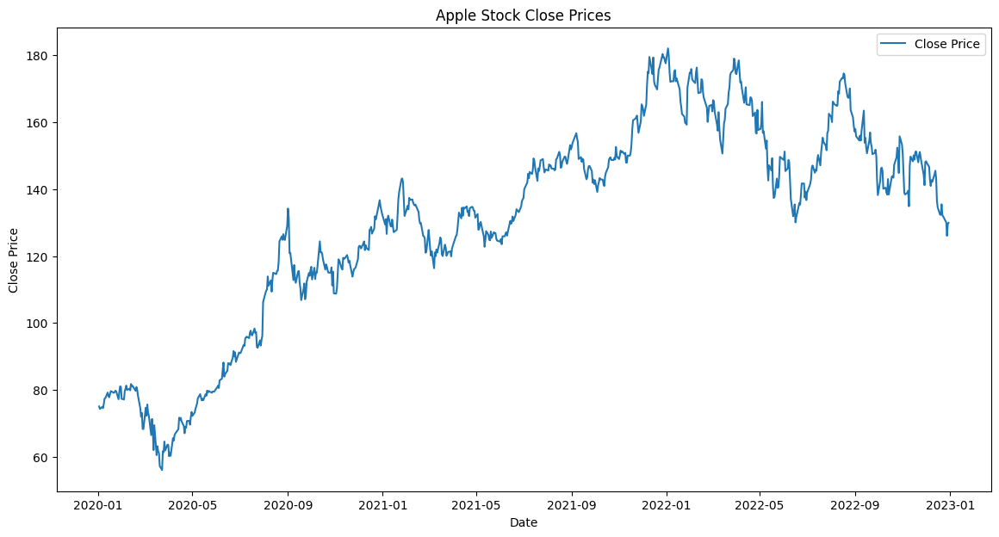

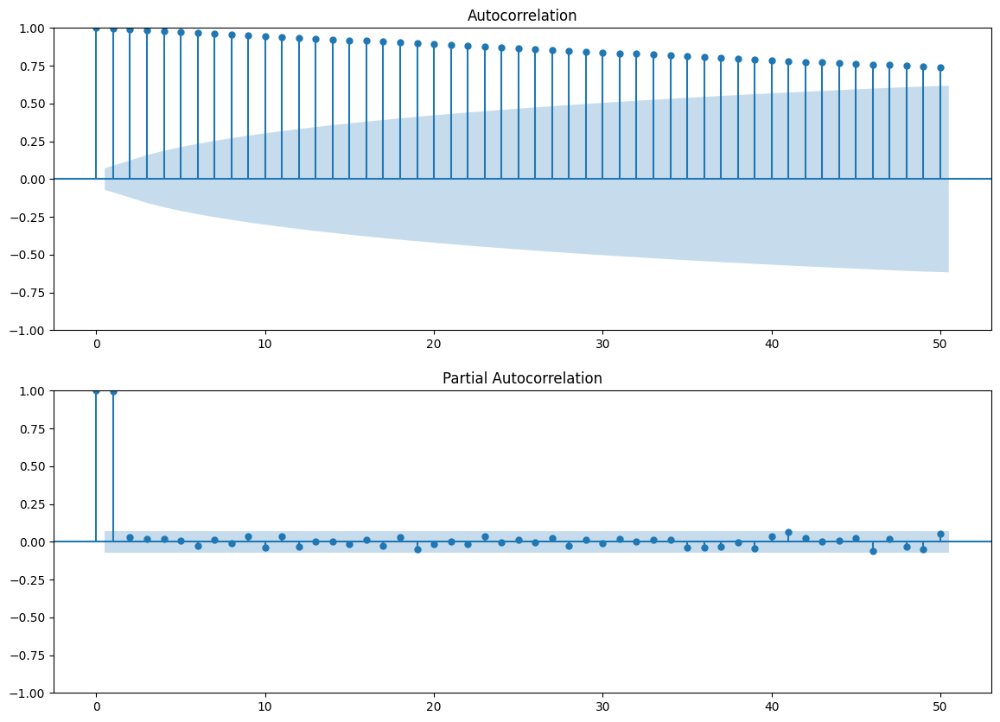

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:308: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the po

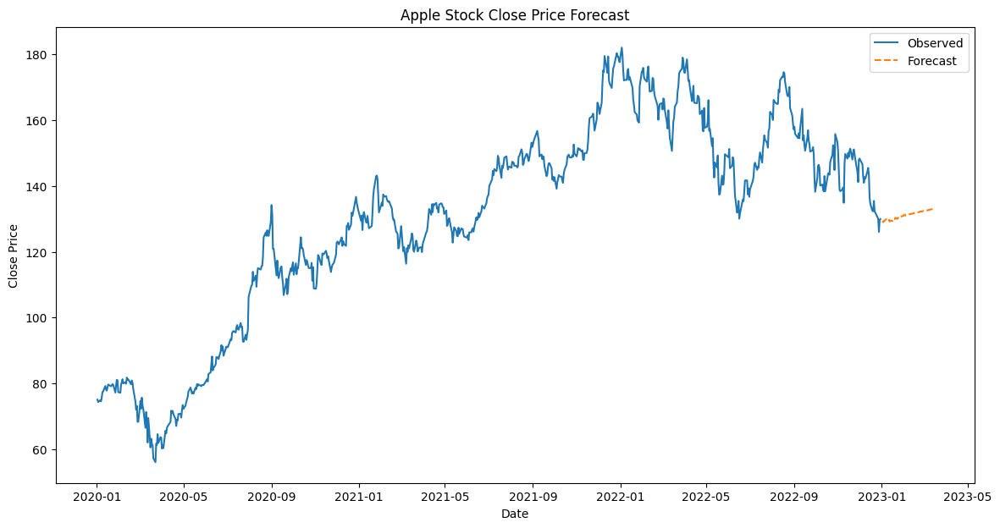

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Download data
ticker = 'AAPL'
start_date = '2020-01-01'
end_date = '2023-01-01'
data = yf.download(ticker, start=start_date, end=end_date)
close_prices = data['Close']

# Plot close prices
plt.figure(figsize=(14, 7))
plt.plot(close_prices, label='Close Price')
plt.title('Apple Stock Close Prices')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# Plot ACF and PACF
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))
plot_acf(close_prices, ax=ax1, lags=50)
plot_pacf(close_prices, ax=ax2, lags=50)
plt.show()

# Fit AutoReg model
lags = 30
model = AutoReg(close_prices, lags=lags)
model_fit = model.fit()

# Make predictions
pred_start = len(close_prices)
pred_end = pred_start + 50
predictions = model_fit.predict(start=pred_start, end=pred_end)

# Create future dates for predictions
future_dates = pd.date_range(start=close_prices.index[-1] + pd.Timedelta(days=1), periods=len(predictions), freq='B')
predictions.index = future_dates

# Plot observed and forecasted values
plt.figure(figsize=(14, 7))
plt.plot(close_prices, label='Observed')
plt.plot(predictions, label='Forecast', linestyle='--')
plt.title('Apple Stock Close Price Forecast')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('/content/drive/MyDrive/MD/Learning is Learning/Data_cn/airline-passengers.csv')

df['Month'] = pd.to_datetime(df['Month'])
df.set_index('Month', inplace=True)
df.head()

,Passengers
Month,
1949-01-01,112
1949-02-01,118
1949-03-01,132
1949-04-01,129
1949-05-01,121


In [ ]:
def autoregressive_model(y, p):
    """
    y: Timeseries data
    p: Lag order
    """
    T = len(y)

    # Construct lag data matrix X and objective Y
    X = np.zeros((T - p, p))
    Y = np.zeros(T - p)

    for t in range(p, T):
        X[t - p] = y[t-p:t][::-1]  #  holds the p previous values in reverse order
        Y[t - p] = y[t]  # current p
    """
    y = [10, 12, 15, 17, 20, 22]
    p = 3
    T = 6
    X = [[12, 10],
     [15, 12],
     [17, 15],
     [20, 17]]
    Y = [15, 17, 20, 22]
    """
    # Mse
    X_b = np.concatenate((np.ones((T - p, 1)), X),axis=1)  # adding constant
    theta = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(Y) # theta = (X^T @ X)^-1 @X^T @ Y
    #Y_t = c + phi_1 * Y_{t-1} + phi_2 * Y_{t-2} + epsilon_t
    return theta   # c and Φi's

# Extract time series data
y = df['Passengers'].values
p = 3

theta = autoregressive_model(y, p)
print(f"parameters: {theta}")

parameters: [13.64099709  1.34822859 -0.59184156  0.2018249 ]


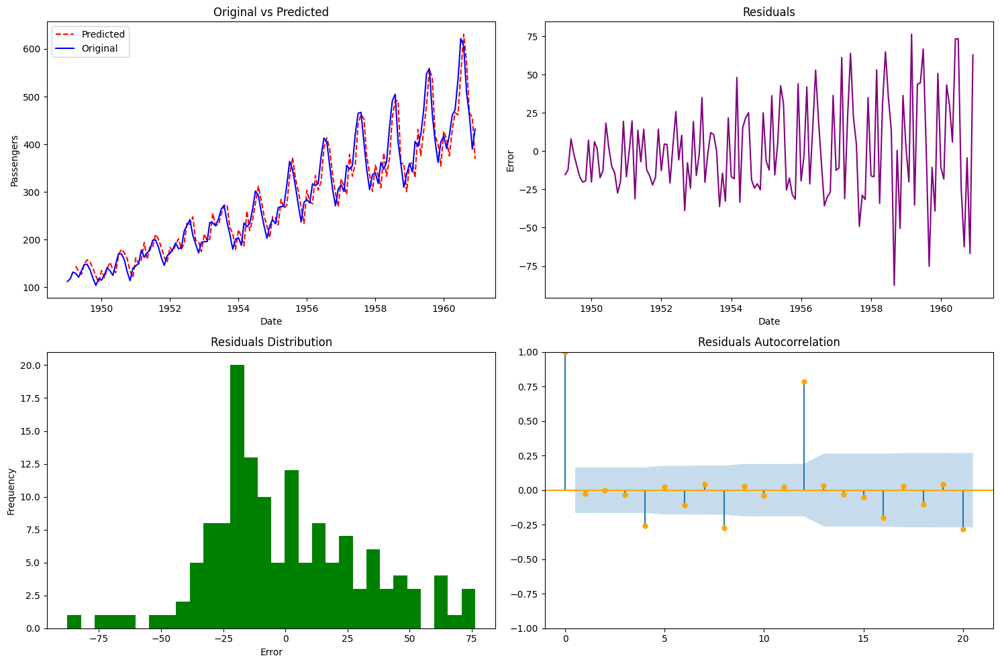

In [ ]:
def predict_ar(y, theta, p):
    T = len(y)
    y_pred = np.zeros(T - p)

    for t in range(p, T):
        X_t = np.r_[1, y[t-p:t][::-1]]
        y_pred[t - p] = X_t.dot(theta)

    return y_pred

y_pred = predict_ar(y, theta, p)

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.plot(df.index[p:], y_pred, label='Predicted', color='red', linestyle='--')
plt.plot(df.index, y, label='Original', color='blue')
plt.title('Original vs Predicted')
plt.xlabel('Date')
plt.ylabel('Passengers')
plt.legend()

residuals = y[p:] - y_pred
plt.subplot(2, 2, 2)
plt.plot(df.index[p:], residuals, color='purple')
plt.title('Residuals')
plt.xlabel('Date')
plt.ylabel('Error')


plt.subplot(2, 2, 3)
plt.hist(residuals, bins=30, color='green')
plt.title('Residuals Distribution')
plt.xlabel('Error')
plt.ylabel('Frequency')


from statsmodels.graphics.tsaplots import plot_acf
plt.subplot(2, 2, 4)
plot_acf(residuals, lags=20, ax=plt.gca(), color='orange')
plt.title('Residuals Autocorrelation')

plt.tight_layout()
plt.show()

[*********************100%***********************]  1 of 1 completed


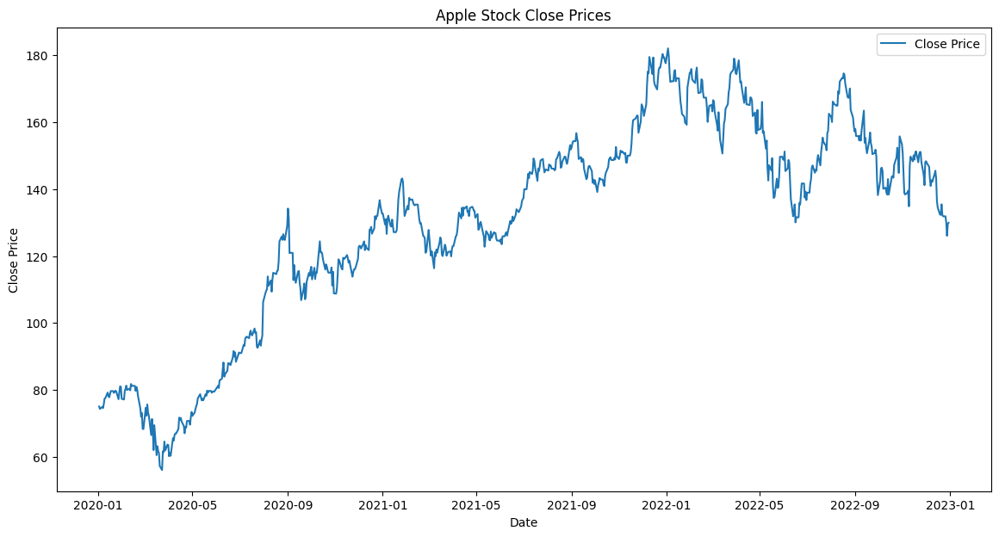

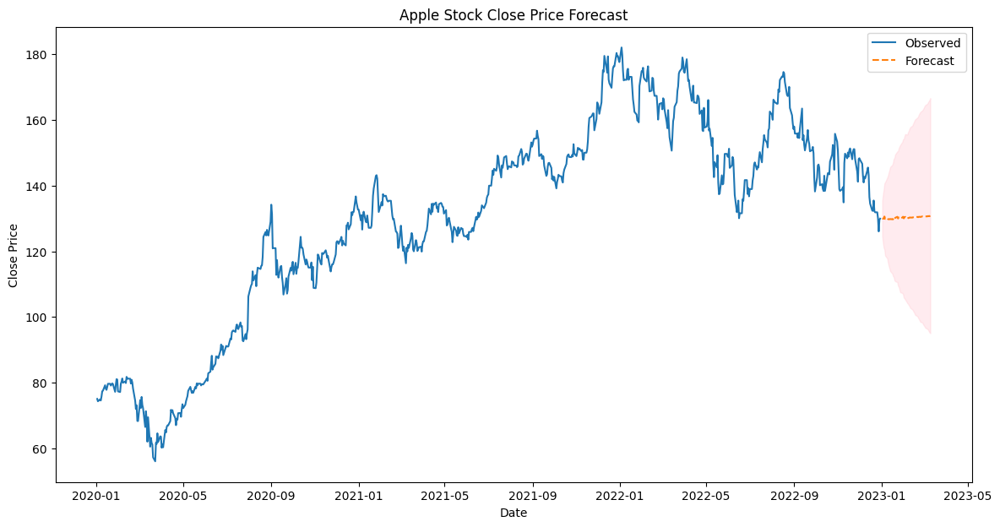

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Download data
ticker = 'AAPL'
start_date = '2020-01-01'
end_date = '2023-01-01'
data = yf.download(ticker, start=start_date, end=end_date)
close_prices = data['Close']

# Resample to Business Day frequency and forward-fill missing values
close_prices = close_prices.asfreq('B').ffill()

# Plot close prices
plt.figure(figsize=(14, 7))
plt.plot(close_prices, label='Close Price')
plt.title('Apple Stock Close Prices')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# Fit SARIMAX model (equivalent to AutoRegressive with lags=30)
lags = 30
model = SARIMAX(close_prices, order=(lags, 0, 0), enforce_stationarity=False, enforce_invertibility=False)
model_fit = model.fit(disp=False)

# Forecast future values
forecast_steps = 50
predictions = model_fit.get_forecast(steps=forecast_steps)
predicted_mean = predictions.predicted_mean
conf_int = predictions.conf_int()

# Plot observed and forecasted values
plt.figure(figsize=(14, 7))
plt.plot(close_prices, label='Observed')
plt.plot(predicted_mean, label='Forecast', linestyle='--')
plt.fill_between(predicted_mean.index, conf_int.iloc[:, 0], conf_int.iloc[:, 1], color='pink', alpha=0.3)
plt.title('Apple Stock Close Price Forecast')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()


* ARMA

> Moving Average(MA)

  A moving average adjusts the current prediction based on previous "errors."

  Let's consider the example of estimating daily lunch expenses. Suppose you make a daily prediction, but sometimes unexpected events occur (e.g., you eat out or find a favorite dish), which results in spending more money. These "unexpected errors" can influence future spending.

  The formula for the moving average looks like this:

  $$
  Y_t = \mu + \theta_1 \epsilon_{t-1} + \theta_2 \epsilon_{t-2} + \cdots + \theta_q \epsilon_{t-q}
  $$

  Where:

  - $ Y_t $: Represents the current value.
  - $ \mu $: A constant, representing the average level of the data.
  - $\epsilon_{t-1}, \epsilon_{t-2}, \dots, \epsilon_{t-q} $: Represent the errors from yesterday, the day before, etc.
  - $ \theta_1, \theta_2, \dots, \theta_q $: Are coefficients that represent the impact of these errors on the current value.

  A moving average uses previous "forecast biases" to adjust today's prediction, similar to "looking back" at the past few days of errors to correct today's value.

> **ARMA**

Now, let's combine "Autoregression" and "Moving Average." The ARMA model predicts future values by considering both the past data trend (Autoregression) and the effect of previous errors (Moving Average), resulting in a more accurate prediction model.

The formula is represented as:

$$
Y_t = \phi_1 Y_{t-1} + \cdots + \phi_p Y_{t-p} + \theta_1 \epsilon_{t-1} + \cdots + \theta_q \epsilon_{t-q} + \epsilon_t
$$

With the ARMA model, we leverage past data trends (Autoregression) while also considering previous errors (Moving Average), making the prediction more realistic.




```
def arma_model(temperature, phi, theta, p, q):
    Y_pred = np.zeros(n)
    residuals = np.zeros(n)
    
    for t in range(max(p, q), n):
        ar_term = np.sum([phi[i] * temperature[t - i - 1] for i in range(p)])
        ma_term = np.sum([theta[i] * residuals[t - i - 1] for i in range(q)])
        Y_pred[t] = mu + ar_term + ma_term
        residuals[t] = temperature[t] - Y_pred[t]  # 计算残差
    return Y_pred, residuals
```



## Principal Component Analysis (PCA)


PCA It is a widely used statistical method for **data dimensionality reduction**, feature extraction, and data visualization. PCA maps *high-dimensional data to a low-dimensional space* through a **linear transformation**, while preserving as much as possible the main information of the data (i.e., the variance of the data)



**1. Basic theory**


1. Variance Maximize:

  Imagine we have a set of data, **Our goal** is to find the new axis or line that has the maximum mapping variance or has the minimum distance between,
  
  (In other word, PCA attempts to capture the direction of greatest change in the data.)
  
  * Given a set of two-dimensional data points $(x_i,y_i)$, PCA is performed by rotating the coordinate axes so that the first principal component (PC1) is **along** the direction of maximum data variation and the second principal component (PC2) is **perpendicular** to PC1

2. Covariance:

  Covariance measures the linear relationship between two variables. For multidimensional data, the covariance matrix describes the covariance between dimensions

  * Given a dataset $X = \{x_1, x_2, \ldots, x_n\}$, where each data point $x_i$ is a $d$-dimensional vector, the covariance matrix $\Sigma$ is defined as:
$$
\Sigma = \frac{1}{n-1} X^T X
$$  
  Here, it is assumed that the data has been centered (i.e., the mean value of each feature is zero).

3. Eigenvalues and Eigenvector

 In PCA to determine the direction and importance of principal components

 * For the covariance matrix $\Sigma$, the eigenvalue $\lambda$ and eigenvector $v$ satisfy：
$$
\Sigma v = \lambda v
$$
  In PCA, each **eigenvector** represents the **direction** of a principal component, and the **eigenvalue** indicates the amount of data **variance** captured by that component.

**2. Steps**

1. Normalization:

  * Mean:
$$
\mu_j = \frac{1}{m} \sum_{i=1}^{m} x_j^{(i)}
$$
$$
x_j^{(i)} := x_j^{(i)} - \mu_j
$$
  * Variance:
$$
\sigma_j^2 = \frac{1}{m} \sum_{i=1}^{m} (x_j^{(i)})^2
$$
$$
x_j^{(i)} := \frac{x_j^{(i)}}{\sigma_j}
$$

2. Covariance Matrix:
$$
C = \frac{X^T X}{m} = \begin{bmatrix}
\frac{1}{m} \sum_{i=1}^{m} (x_1^{(i)})^2 & \frac{1}{m} \sum_{i=1}^{m} x_1^{(i)} x_2^{(i)} & \cdots & \frac{1}{m} \sum_{i=1}^{m} x_1^{(i)} x_n^{(i)} \\
\frac{1}{m} \sum_{i=1}^{m} x_2^{(i)} x_1^{(i)} & \frac{1}{m} \sum_{i=1}^{m} (x_2^{(i)})^2 & \cdots & \frac{1}{m} \sum_{i=1}^{m} x_2^{(i)} x_n^{(i)} \\
\vdots & \vdots & \ddots & \vdots \\
\frac{1}{m} \sum_{i=1}^{m} x_n^{(i)} x_1^{(i)} & \frac{1}{m} \sum_{i=1}^{m} x_n^{(i)} x_2^{(i)} & \cdots & \frac{1}{m} \sum_{i=1}^{m} (x_n^{(i)})^2
\end{bmatrix}
$$

3. Eigenvalue:
$$
E^T C E = \Lambda = \begin{bmatrix} \lambda_1 & 0 & \cdots & 0 \\ 0 & \lambda_2 & \cdots & 0 \\ \vdots & \vdots & \ddots & \vdots \\ 0 & 0 & \cdots & \lambda_n \end{bmatrix}
$$
  The matrix above is a diagonal matrix where only the diagonal elements have values, and all other positions are 0.

  For the feature matrix $X$, because of the presence of many redundant data, let's assume that we transform it to another feature space and obtain the new feature matrix $Z$:
$$
Z = \begin{bmatrix} z_1^{(1)} & z_2^{(1)} & \cdots & z_n^{(1)} \\ z_1^{(2)} & z_2^{(2)} & \cdots & z_n^{(2)} \\ \vdots & \vdots & \ddots & \vdots \\ z_1^{(m)} & z_2^{(m)} & \cdots & z_n^{(m)} \end{bmatrix}
$$
  We hope that each feature in this new feature space is orthogonal to each other, meaning that each feature is independent. In the new feature space, the covariance should be a diagonal matrix:
$$D = \frac{Z^T Z}{m} = \begin{bmatrix} \frac{1}{m}\sum_{i=1}^m (z_1^{(i)})^2 & 0 & \cdots & 0 \\ 0 & \frac{1}{m}\sum_{i=1}^m (z_2^{(i)})^2 & \cdots & 0 \\ \vdots & \vdots & \ddots & \vdots \\ 0 & 0 & \cdots & \frac{1}{m}\sum_{i=1}^m (z_n^{(i)})^2 \end{bmatrix}$$
  The diagonal elements are variances, while the off-diagonal elements are covariances, and covariance being 0 means the two features are orthogonal.

  Suppose the transformation of feature space can be represented as:
$$Z = XU,$$
then the matrix $D$ can be expressed as:
$$D = \frac{Z^T Z}{m} = \frac{1}{m} (XU)^T (XU) = U^T \left(\frac{1}{m} X^T X \right) U = U^T C U$$
  * If $U$ is the matrix consist of **eigenvector** of $C$, thus, Every value on the diagonal is the **eigenvalue** of $C$.
  * Sort Eigenvector by Eigenvalue, the larger value is, the more important the PC is.

4. Lower dimensionality

  If we want to project data to lower dimension, select top k Eigenvectors of $D$,through compression transformation $Z = X U_k$, we will get the low dimension data matrix $Z$, wheras $$X \in \mathbb{R}^{m\times n}, U \in \mathbb{R}^{n\times k} and\space Z \space \in \mathbb{R}^{m\times k}$$
  * One more takeaway is that:

    To achieve dimensionality reduction while preserving variance, we select the first $k$ principal components based on the explained variance ratio.
$$
\text{Explained Variance Ratio} = \frac{\sum_{i=1}^k \lambda_i}{\sum_{i=1}^d \lambda_i}
$$
    Typically, we choose the number of components \(k\) such that the explained variance ratio reaches at least 90%.



Note:
  * If ||u||=1, the length of the projection of $x^{(i)}$ onto $u$ is $u^T x^{(i)}$

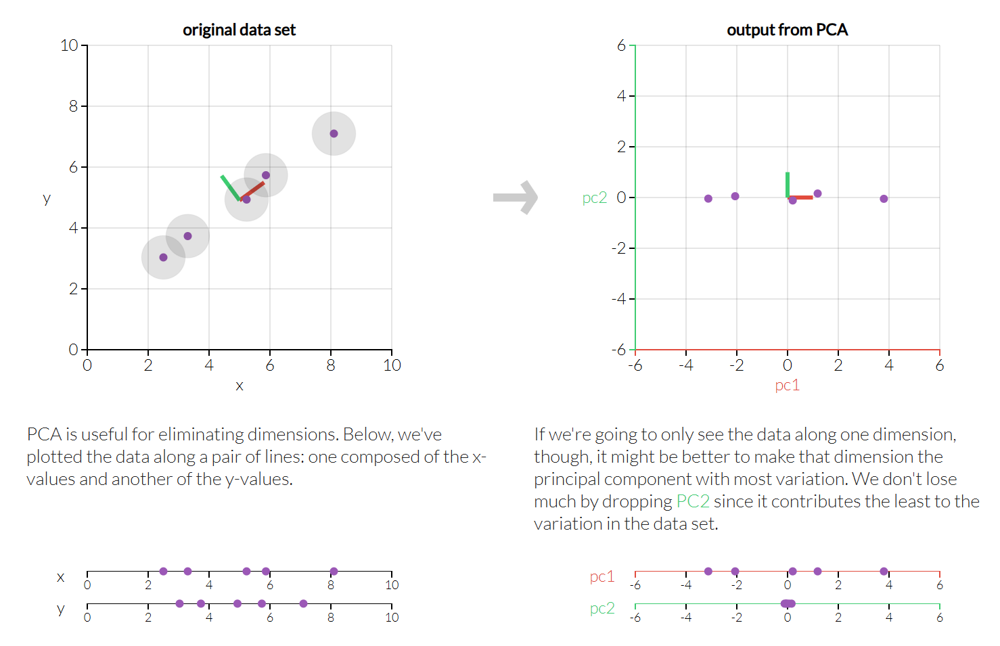

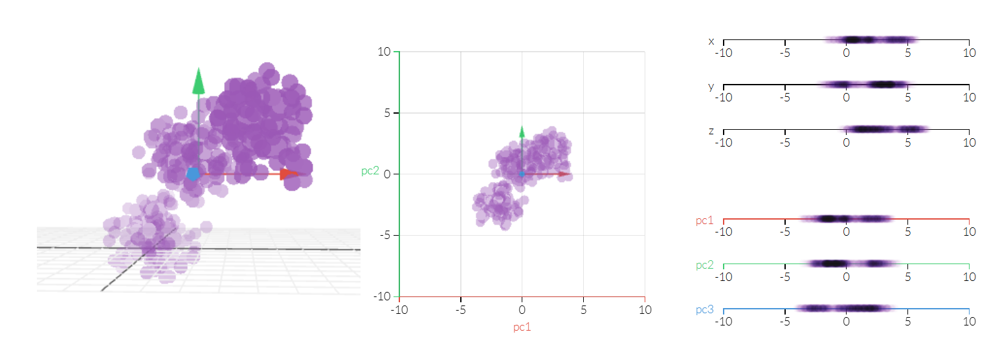

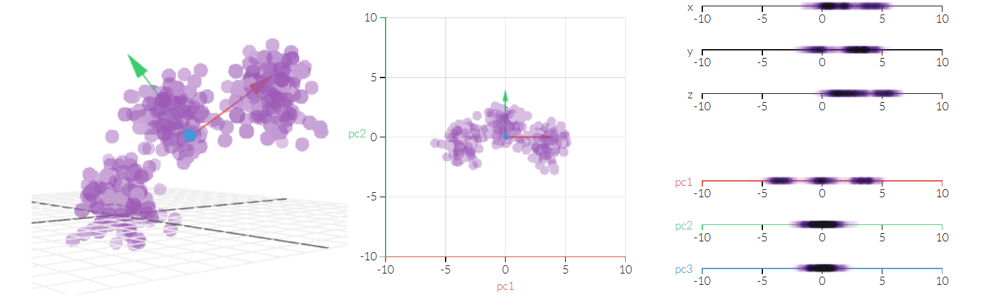

X:[[-7.18248345e-01 -6.34978454e-01]
 [-1.98926629e+00  8.75341318e-01]
 [ 5.23572716e-01  1.64177742e-05]
 ...
 [-1.23004437e+00  7.18702031e-01]
 [ 5.87940807e-01 -8.55353392e-01]
 [ 7.24223043e-01 -5.81835681e-01]]
Cov:[[3, 1], [1, 2]]
X_centered:[[-0.62933513 -0.65877446]
 [-1.90035307  0.85154532]
 [ 0.61248593 -0.02377959]
 ...
 [-1.14113115  0.69490603]
 [ 0.67685402 -0.8791494 ]
 [ 0.81313626 -0.60563168]]
cov matrix:[[2.81936985 0.8569802 ]
 [0.8569802  1.94977915]]
Eigenvalues:[1.42360516 3.34554383]
Eigenvectors:[[ 0.52323275 -0.85218982]
 [-0.85218982 -0.52323275]]
Eigenvalues sorted:[3.34554383 1.42360516]
Eigenvectors sorted:[[-0.85218982  0.52323275]
 [-0.52323275 -0.85218982]]
V:[[-0.85218982  0.52323275]
 [-0.52323275 -0.85218982]]
Y:[[ 0.88100536  0.23211213]
 [ 1.17390514 -1.72000522]
 [-0.50951202  0.34073742]
 ...
 [ 0.60886275 -1.18926904]
 [-0.11680835  1.10335436]
 [-0.37606011  0.94157268]]


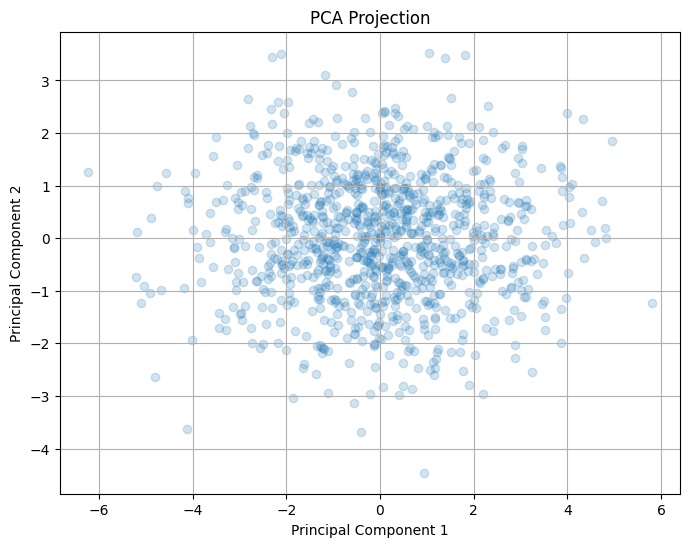

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 生成示例数据
np.random.seed(42)
mean = [0, 0]
cov = [[3, 1], [1, 2]]  # 协方差矩阵
X = np.random.multivariate_normal(mean, cov, 1000)
print(f"X:{X}")
print(f"Cov:{cov}")
# 数据标准化
X_mean = np.mean(X, axis=0)
X_centered = X - X_mean
print(f"X_centered:{X_centered}")

# 计算协方差矩阵
cov_matrix = np.cov(X_centered, rowvar=False)
print(f"cov matrix:{cov_matrix}")
# 计算特征值和特征向量
eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
print(f"Eigenvalues:{eigenvalues}")
print(f"Eigenvectors:{eigenvectors}")
# 按照特征值降序排列特征向量
sorted_idx = np.argsort(eigenvalues)[::-1]
eigenvalues_sorted = eigenvalues[sorted_idx]
eigenvectors_sorted = eigenvectors[:, sorted_idx]
print(f"Eigenvalues sorted:{eigenvalues_sorted}")
print(f"Eigenvectors sorted:{eigenvectors_sorted}")
# 选择前两个主成分
V_k = eigenvectors_sorted[:, :2]
print(f"V:{V_k}")

# 将数据投影到主成分上
Y = X_centered.dot(V_k)
print(f"Y:{Y}")

# 可视化结果
plt.figure(figsize=(8,6))
plt.scatter(Y[:, 0], Y[:, 1], alpha=0.2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Projection')
plt.grid(True)
plt.show()


Explained Variance Ratio: [0.68275617 0.31724383]
Singular Values: [36.95283949 25.18903836]


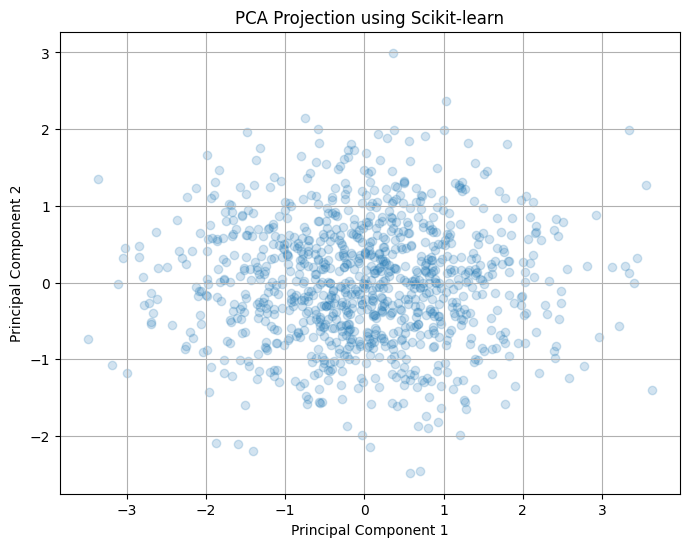

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 生成示例数据
np.random.seed(42)
mean = [0, 0]
cov = [[3, 1], [1, 2]]
X = np.random.multivariate_normal(mean, cov, 1000)

# 数据标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 创建PCA对象，设置主成分数量为2
pca = PCA(n_components=2)
Y = pca.fit_transform(X_scaled)

# 查看主成分的方差解释率
print("Explained Variance Ratio:", pca.explained_variance_ratio_)
print("Singular Values:", pca.singular_values_)

# 可视化结果
plt.figure(figsize=(8,6))
plt.scatter(Y[:, 0], Y[:, 1], alpha=0.2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Projection using Scikit-learn')
plt.grid(True)
plt.show()


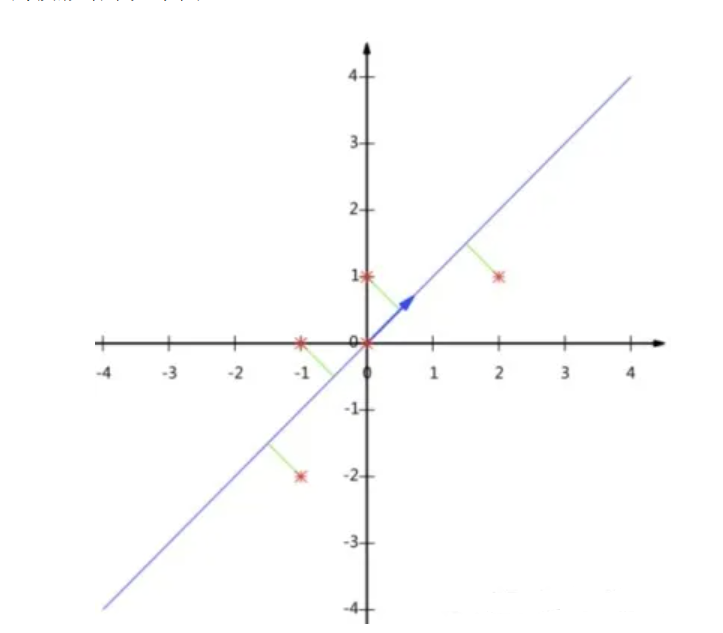

It is a process of figuring out most important features or principal components that has the most impact on the target variable

PCA is called dimensionality reduction technique as it can help us reduce dimension


In [ ]:
digit = load_digits()
df = pd.DataFrame(digit.data,columns=digit.feature_names)

<Figure size 640x480 with 0 Axes>

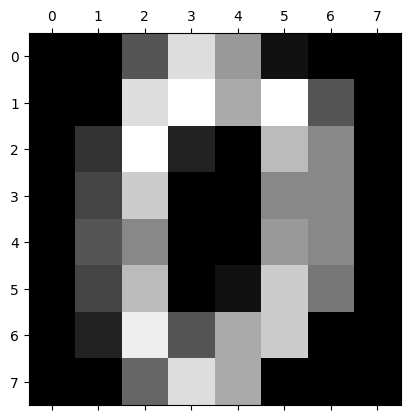

In [ ]:
%matplotlib inline

plt.gray()
plt.matshow(digit.images[0].reshape(8,8))

In [ ]:
import numpy as np
np.unique(digit.target)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled,digit.target,test_size=0.2,random_state=30)

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.9722222222222222

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(0.95)
X_pca = pca.fit_transform(X_scaled)

In [ ]:
df.shape

(1797, 64)

In [ ]:
X_pca.shape
# the shape is decreasing which brings efficiency

(1797, 40)

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca,digit.target,test_size=0.2,random_state=30)

In [ ]:
model.fit(X_train_pca, y_train)
model.score(X_test_pca, y_test)
# the accuracy is not quite declined so it is good

0.9638888888888889

In [ ]:
pca = PCA(n_components=4)
X_pca = pca.fit_transform(X_scaled)
X_pca.shape
# only four features which makes the compute faster

(1797, 4)

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca,digit.target,test_size=0.2,random_state=30)

In [ ]:
model.fit(X_train_pca, y_train)
model.score(X_test_pca, y_test)

0.7888888888888889

## ICA


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import FastICA


np.random.seed(0)
n_samples = 2000
time = np.linspace(0, 8, n_samples)

# Independent Signal
s1 = np.sin(2 * time)
s2 = np.sign(np.sin(3 * time))
s3 = np.random.laplace(size=n_samples)

S = np.c_[s1, s2, s3]
S /= S.std(axis=0)

# Mixed Signal
A = np.array([[1, 1, 1], [0.5, 2, 1.0], [1.5, 1.0, 2.0]])
X = np.dot(S, A.T)

#
ica = FastICA(n_components=3)
S_ = ica.fit_transform(X)
A_ = ica.mixing_


plt.figure(figsize=(10, 8))

models = [X, S, S_]
names = ['Mixed Signal', 'IC(Real)', 'IC（Extracted by ICA）']

for ii, (model, name) in enumerate(zip(models, names), 1):
    plt.subplot(3, 1, ii)
    plt.title(name)
    for sig in model.T:
        plt.plot(time, sig)

plt.tight_layout()
plt.show()


## Training and test data


### **Web data crawling**


In [ ]:
pip install selenium

In [ ]:
from selenium import webdriver

In [ ]:

chrome_options = webdriver.ChromeOptions()
chrome_options.headless = True #do not need GUI
chrome=webdriver.Chrome(options=chrome_options)
page=chrome.fget("https://www.google.com")

In [ ]:
page = BeautifulSoup(open(html_path,'r'))
links = [a['href'] for a in poage.find_all('a','list-card-link')] #find all the url
ids = [l.split('/')[-2].split('_')[0]for l in links] # get the id

In [ ]:
sold_items = [a.text for a in page.find('div','ds-home-details-chip').find('p').find_all('span')]
for items in sold_items:
    if 'Sold:' in items:
        result['Sold Price'] = items.split('')[1]
    if 'Sold on' in items:
        result['Sold On'] = items.split('')[-1]

In [ ]:
#Get all image URLs
p = r'https:\\/\\/photos.zilowstatic.com\\/fp\\/([\d\w\-\_]+).jpg'
ids[a.split('-')[0] for a in re.findall(p,html)]
urls = [f'https://photos.zilowstatic.com/fp/{i}.jpg' for id in ids]



---



### **Data annotation**

Adequate labeling ---> semi-supervised modeling

Enough budget ---> get someone to give you the labeling

None? ---> weakly supervised learning

*Problem solved:*

there is a small portion of data that is labeled, and there is lots and lots of data that is unlabeled (how to utilize unlabeled data)

*Assumptions:*

* Continuity:

  If the characteristics between the samples are similar, then the two samples are likely to have the same labeling

* Clustering assumptions:

  The data is divided by class; the data may have the same labeling within a class if there is a better clustering structure (GMM)

* Manifold hypothesis:

  Although the data we collect has high dimensionality, it is possible that the data is distributed on a low-dimensional manifold (clean data can be obtained by dimensionality reduction).



**Self-learning**

1. First train a model with labeled data
2. Use the trained model to make predictions on unlabeled data (to get pseudo-labeled data)
3. Merge the pseudo-labeled data with the labeled data
4. Train the model on the merged data.
5. Keep doing the above process


P.S.
Pseudo-labeled data may be noisy, so keep the pseudo-labeled data that the model is more confident in

Here the model is used to label the data, do not consider the cost of the model, this model will not be online



---

**Active learning **(like semi-supervised learning)

unlabeled data with human intervention (for interesting data)

Uncertainty sampliing, selecting particularly unconvincing samples and letting people do it

Query-by-committee, using multiple models to vote on which sample is harder to predict

Active learning mixed with self-learning

Convincing data is merged with the original data, unconvincing data is sent to the labeler


***Quality control of data***


The simplest way to do this is to send each task to multiple labelers, aggregate them, and then vote to judge (expensive)

You can send the hard-to-convince data to more than one person (do it more than once)

Make some questions in advance to judge whether the labelers are reliable or not




---
**Weakly supervised learning**

Semi-automatic generation of labels (program the data with bootstrapping, write the appropriate rules)


In [ ]:
def check_out(x):
  return SPAM if "check out" in x.lower() else ABSTAIN
def sentiment(x):
  return HAM if sentiment_polarity(x)>0.9 else ABSTAIN
def short_comment(x):
  return HAM if len(x.split())<5 else ABSTAIN #short comment

### **Data preprocessing**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib_inline
import matplotlib as mpl
import seaborn as sns
from IPython.display import display
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

In [ ]:
data = pd.read_csv('data.csv')

In [ ]:
data.shape
data.head()
data.info()
data.describe

In [ ]:
#deal with missing data
null_sum = data.isnull().sum()
data.columns[null_sum<len(data)*0,3] #columns will keep
data.drop(columns=data.columns[null_sum>len(data)*0.3],inplace=True)

In [ ]:
data.dtypes

In [ ]:
currency = ['Sold Price','Listed Price','Tax assessed value','Annual tax amount']
for c in currency:
  data[c]=data[c].replace(r'[$,-]','',regex=True).replace( #delete string with $
      r'^\s*$',np.nan,regex=True).astype(float) #if empty transform to nan type

In [ ]:
areas = ['Total interior livable area', 'Lot size']
for c in areas:
  acres = data[c].str.contains('Acres') == True
  col = data[c].replace(r'\b sqft\b|\b Acres\b|\b, \b','',regex=True).astype(float) #replace with empty and transform to float
  col[acres] *= 43560
  data[c] = col

In [ ]:
# filter out the houses whose living area are too small or too hard to simplify later
abnormal = (data[areas[1]]<10) | (data[areasp1[]>1e4])
data= data[~abnormal]
sum(abnormal)

In [ ]:
ax =sns.histplot(np.log10(data['Sold Price']))
ax.set_xlim([3,8])
ax.set_xticks(range(3,9))
ax.set_xticklabels(['%.0e'%a for a in 10**ax.get_xticks()]);

In [ ]:
#check the type of houses
data['Type'].value_counts()[0;20]
#price density for different types
types= data['Tpye'].isin(['SingleFamily','Condo'])
sns.displot(pd.DataFrame({'Sold Price':np.log10(data[types]['Sold Price']),'Type':data[types]['Type']}),
            x='Sold Price',hue='Type',kind='kde');


In [ ]:
#sale price per living sqft
data['Price per sqft'] = data['Sold Price']/data['Total interior livable area']
ax=sns.boxplot(x='Type', y='Price per sqft',data=data[types],fliersize=0)
ax.set_ylim([0,1000]);

In [ ]:
#location varies with the price
d = data[data['Zip'].isin(data['Zip'].value_counts()[:20].keys())]
ax = sns.boxplot(x='Zip',y='Price per living sqft',data=d,fliersize=0)
ax.set_ylim([0,1000])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

In [ ]:
# visualize the correlatiuon matrix
_,ax = plt.subplots(figsize=(10,10))
columns = ['Sold Price','Listed Price','Tax assessed value','Annual tax amount',
           'Total interior livable area','Lot size','Price per sqft']
sns.heatmap(data[columns].corr(),annot=True,cmap='RdYlGn',ax=ax);

### **Data Processing**



* Data not clean (lots of noise)?

  Need to do a data cleanup to correct the wrong information
* Data is relatively clean (data is not in the desired format)?

  Transform the data
* The data is not very friendly to the model, perform feature extraction on the data




1.  **Errors in data**

ollected data does not match the true observations [missing values, wrong values, extreme values]

A good model is tolerant of errors [given wrong data it will converge but with less accuracy than with clean data]

Deploying such a model may affect the results of newly collected data

**Types of data errors:**

The value of a sample in the data is out of the normal distribution (Outlier)

Rule violations

* There are correspondence or control rules that can be used to test for correctness

A syntactic or semantic restriction is violated (Pattern violations)





2.   **Data transformation**

The operation between data annotation, cleaning and feature engineering is a data transformation


*  *Normalization*

The minimum and maximum values of the values inside a column are limited to a fixed interval, and then all the elements are changed out only by linear change

[put the units of the data into a reasonable interval]

**Z-score:** An algorithm to change the mean to 0 and the variance to 1

Replace a column of data with data that is between -1 and 1

on the value are greater than 0, and the value of the transformation is relatively large can try to log it

[log above the addition and subtraction is equal to the multiplication and division of the original data, you can base the calculation on the percentage of the]

*  **picture transformation**

Make the size of the picture smaller [machine learning doesn't care about low resolution pictures]

Images sampled smaller and jpeg chosen for medium quality compression may result in a 1% drop in accuracy

(ImageNet) [there is a trade-off between size and quality of data]

*    **Video transformation**

Use short videos (less than 10s), cut the video to the part of interest

*    Text transformation

Stemming and lemmatizatiuon

**Stemming**: turning a word into a common form

E.g. am,are,is->be
   car,cars,car's,cars'->car

Tokenization:text->a list of tokens

Tokenization (smallest unit in machine learning algorithms)



* By word:text.split('')

* By subwords:

Unigram,WordPiece,...

e.g. "a new Gpu!"-> "a","new","Gp","u","!"





3. **Feature Engineering**


  Why feature engineering is needed:

  Because machine learning algorithms prefer better defined, fixed-length inputs and outputs that it can process better


* **For table data**  

  * For integer or floating-point data, you can directly use or take out the maximum and minimum values, and then divide this data into n intervals, if the value is in the interval, it will be given the subscript i corresponding to the interval

    [this allows the machine learning algorithms not to get entangled in a specific value (fine-grained value)]

  * For category data, one-hot coding is generally used (although there are n columns, but only each column has a value)

    [although there are many categories but only a few common categories, you can turn a few categories into Unknown categories, and only keep those more important categories, so that these important categories can be put into a controlled unit]

  * For time features, the time data is made such that machine learning algorithms can know that these days are days with special significance (weekends, days off, New Year's Day, and so on)

    [year,month,year,day_of_year,week_of_year,day_of_week]
  
    The last three are used to indicate special dates, etc.

  * Combination of features: this way you can get the correlation between two or two features




*   **Text Data**

Bag of words(BoW) model:

Make each token one-hot, and then add up all the words in the sentence [here we have to pay attention to how to construct the lexicon, not too big and not too small; the biggest problem with the BoW model is that the information in the original sentence is lost]


Word Embeddings(e.g. Word2vec):

Turn words into vectors, which are semantically related to each other (two words are semantically similar if the inner product of the corresponding vectors is relatively close to each other)

Can use pre-trained models (BERT,GPT-3)


In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
exx = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/carprices.csv')
exx

,Car Model,Mileage,Sell Price($),Age(yrs)
0,BMW X5,69000,18000,6
1,BMW X5,35000,34000,3
2,BMW X5,57000,26100,5
3,BMW X5,22500,40000,2
4,BMW X5,46000,31500,4
5,Audi A5,59000,29400,5
6,Audi A5,52000,32000,5
7,Audi A5,72000,19300,6
8,Audi A5,91000,12000,8
9,Mercedez Benz C class,67000,22000,6


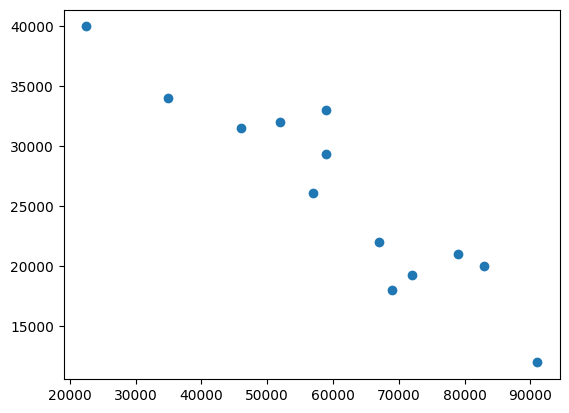

In [ ]:
plt.scatter(exx['Mileage'],exx['Sell Price($)'])

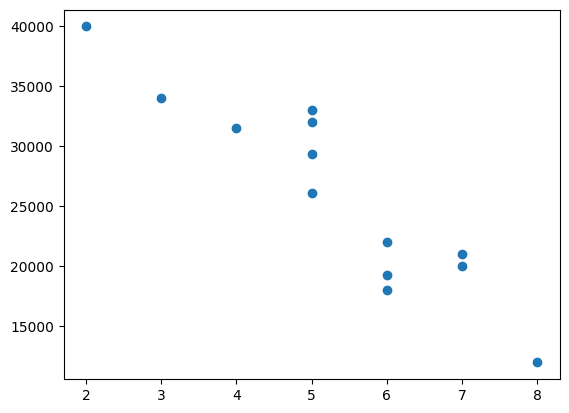

In [ ]:
plt.scatter(exx['Age(yrs)'],exx['Sell Price($)'])

In [ ]:
X = exx[['Mileage','Age(yrs)']]
y = exx['Sell Price($)']

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)
#random_state to keep the split each time at the same value

In [ ]:
X_train

,Mileage,Age(yrs)
10,83000,7
7,72000,6
4,46000,4
0,69000,6
3,22500,2
9,67000,6
5,59000,5
6,52000,5
2,57000,5
12,59000,5


In [ ]:
clf = LinearRegression()
clf.fit(X_train,y_train)

LinearRegression()

In [ ]:
clf.predict(X_test)

array([18959.66697502, 36530.20351526, 14247.62950971])

In [ ]:
clf.score(X_train,y_train)

0.8018032847066888

In [ ]:
clf.score(X_test,y_test)

0.9361714151455143

### Cross Validation

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_digits

digits = load_digits()
X_train, X_test, y_train, y_test = train_test_split(digits.data, digits.target,test_size=0.3)

In [ ]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
lr.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.9648148148148148

In [ ]:
svm = SVC()
svm.fit(X_train, y_train)
svm.score(X_test, y_test)

0.9925925925925926

In [ ]:
rf = RandomForestClassifier(n_estimators=40)
rf.fit(X_train, y_train)
rf.score(X_test, y_test)

0.975925925925926

In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=3)
for train_index, test_index in kf.split([1,2,3,4,5,6,7,8,9]):
  print(train_index, test_index)

[3 4 5 6 7 8] [0 1 2]
[0 1 2 6 7 8] [3 4 5]
[0 1 2 3 4 5] [6 7 8]


In [ ]:
def get_score(model, X_train, X_test, y_train, y_test):
  model.fit(X_train, y_train)
  return model.score(X_test, y_test)

In [ ]:
score_l = []
score_svm = []
score_rf = []
for train_index, test_index in kf.split(digits.data):
  X_train, X_test, y_train, y_test = digits.data[train_index], digits.data[test_index],digits.target[train_index], digits.target[test_index]
  score_l.append(get_score(LogisticRegression(max_iter=500), X_train, X_test, y_train, y_test))
  score_svm.append(get_score(SVC(), X_train, X_test, y_train, y_test))
  score_rf.append(get_score(RandomForestClassifier(n_estimators=40), X_train, X_test, y_train, y_test))

In [ ]:
score_l

[0.9248747913188647, 0.9432387312186978, 0.9148580968280468]

In [ ]:
score_svm

[0.9666110183639399, 0.9816360601001669, 0.9549248747913188]

In [ ]:
score_rf

[0.9282136894824707, 0.9582637729549248, 0.9265442404006677]

In [ ]:
from sklearn.model_selection import StratifiedKFold
folds = StratifiedKFold(n_splits=3) #in a uniform way

In [ ]:
from sklearn.model_selection import cross_val_score
cross_val_score(LogisticRegression(max_iter=500), digits.data, digits.target)

array([0.92222222, 0.87222222, 0.94150418, 0.94150418, 0.89693593])

In [ ]:
cross_val_score(SVC(), digits.data, digits.target)

array([0.96111111, 0.94444444, 0.98328691, 0.98885794, 0.93871866])

In [ ]:
cross_val_score(RandomForestClassifier(n_estimators=40), digits.data, digits.target)

array([0.93888889, 0.90277778, 0.96657382, 0.96935933, 0.91922006])

In [ ]:
cross_val_score(RandomForestClassifier(n_estimators=5), digits.data, digits.target)

array([0.85277778, 0.81111111, 0.86908078, 0.91086351, 0.84958217])

### **GridSearch CV**


Hyper parameter Tuning:

For SVM

| Parameter | Value |
|-----|-----|
| Kernel | 'rbf','linear','poly' |
| C | INT |
| Gamma | Float |

In [ ]:
from sklearn import svm, datasets
iris = datasets.load_iris()

In [ ]:
df = pd.DataFrame(iris.data,columns=iris.feature_names)
df['flower'] = iris.target
df['flower'] = df['flower'].apply(lambda x: iris.target_names[x])
df[47:150]

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),flower
47,4.6,3.2,1.4,0.2,setosa
48,5.3,3.7,1.5,0.2,setosa
49,5.0,3.3,1.4,0.2,setosa
50,7.0,3.2,4.7,1.4,versicolor
51,6.4,3.2,4.5,1.5,versicolor
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, test_size=0.3)

In [ ]:
model_svm_tunning = svm.SVC(kernel='rbf',C=30,gamma='auto')
model_svm_tunning.fit(X_train,y_train)
model_svm_tunning.score(X_test, y_test)

1.0

In [ ]:
from sklearn.model_selection import cross_val_score
cross_val_score(svm.SVC(kernel='linear',C=10,gamma='auto'),iris.data, iris.target, cv=5).mean()

0.9733333333333334

In [ ]:
cross_val_score(svm.SVC(kernel='rbf',C=10,gamma='auto'),iris.data, iris.target, cv=5).mean()

0.9800000000000001

In [ ]:
cross_val_score(svm.SVC(kernel='rbf',C=30,gamma='auto'),iris.data, iris.target, cv=5).mean()

0.96

In [ ]:
import numpy as np
kernels = ['rbf', 'linear','poly']
C = [1,10,20]
avg_scores = {}
for kval in kernels:
    for cval in C:
        cv_scores = cross_val_score(svm.SVC(kernel=kval,C=cval,gamma='auto'),iris.data, iris.target, cv=5)
        avg_scores[kval + '_' + str(cval)] = np.average(cv_scores)

avg_scores

{'rbf_1': 0.9800000000000001,
 'rbf_10': 0.9800000000000001,
 'rbf_20': 0.9666666666666668,
 'linear_1': 0.9800000000000001,
 'linear_10': 0.9733333333333334,
 'linear_20': 0.9666666666666666,
 'poly_1': 0.9666666666666666,
 'poly_10': 0.9666666666666666,
 'poly_20': 0.9533333333333334}

In [ ]:
# GridSearch CV is doing the same thing as the above block shows
from sklearn.model_selection import GridSearchCV
clf = GridSearchCV(svm.SVC(gamma='auto'), {
    'C': [1,10,20],
    'kernel': ['rbf','linear','poly']
}, cv=5, return_train_score=False)
clf.fit(iris.data, iris.target)
clf.cv_results_

{'mean_fit_time': array([0.00136127, 0.0010901 , 0.00256305, 0.00127954, 0.00113506,
        0.00488133, 0.00210047, 0.00106225, 0.00951538]),
 'std_fit_time': array([2.38382461e-04, 1.90982979e-04, 1.64103769e-03, 1.07687357e-04,
        9.11443264e-05, 3.10149207e-03, 7.47436321e-04, 2.85272986e-05,
        7.54073072e-03]),
 'mean_score_time': array([0.00087042, 0.00074568, 0.00097408, 0.00086288, 0.0008616 ,
        0.00112548, 0.00116515, 0.00073833, 0.00114889]),
 'std_score_time': array([5.26315480e-05, 8.29618001e-05, 3.41738004e-04, 7.13676298e-05,
        1.38690807e-04, 2.66834197e-04, 3.87561526e-04, 1.38154464e-05,
        1.54685371e-04]),
 'param_C': masked_array(data=[1, 1, 1, 10, 10, 10, 20, 20, 20],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value=999999),
 'param_kernel': masked_array(data=['rbf', 'linear', 'poly', 'rbf', 'linear', 'poly',
                    'rbf', 'linear', 'poly'],
         

In [ ]:
df = pd.DataFrame(clf.cv_results_)
df[['param_C','param_kernel','mean_test_score']].sort_values(by=['mean_test_score'],ascending=False)

,param_C,param_kernel,mean_test_score
0,1,rbf,0.980000
1,1,linear,0.980000
3,10,rbf,0.980000
4,10,linear,0.973333
6,20,rbf,0.966667
2,1,poly,0.966667
5,10,poly,0.966667
7,20,linear,0.966667
8,20,poly,0.953333


In [ ]:
print(clf.best_params_,'Best score is',clf.best_score_)

{'C': 1, 'kernel': 'rbf'} Best score is 0.9800000000000001


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
rs = RandomizedSearchCV(svm.SVC(gamma='auto'), {
        'C': [1,10,20],
        'kernel': ['rbf','linear','poly']
    },
    cv=5,
    return_train_score=False,
    n_iter=2
)

In [ ]:
rs.fit(iris.data, iris.target)
pd.DataFrame(rs.cv_results_)[['param_C','param_kernel','mean_test_score']]

,param_C,param_kernel,mean_test_score
0,20,poly,0.953333
1,1,linear,0.980000


Choosing best model

In [ ]:
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

In [ ]:
model = {
    'svm': {
        'model': svm.SVC(gamma='auto'),
        'params' : {
            'C': [1,10,20],
            'kernel': ['rbf','linear','poly']
        }
    },
    'random_forest' : {
        'model': RandomForestClassifier(),
        'params' : {
            'n_estimators': [1,5,10]
        }
    },
    'logistic_regression' : {
        'model': LogisticRegression(solver='liblinear'),
        'params': {
            'C': [1,5,10]
        }
    }
}

In [ ]:
scores = []

for model_name, mp in model.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=5, return_train_score=False)
    clf.fit(iris.data, iris.target)
    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })

df = pd.DataFrame(scores,columns=['model','best_score','best_params'])
df

,model,best_score,best_params
0,svm,0.980000,"{'C': 1, 'kernel': 'rbf'}"
1,random_forest,0.966667,{'n_estimators': 10}
2,logistic_regression,0.966667,{'C': 5}




---

Exercise



In [ ]:
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier

In [ ]:
digits = datasets.load_digits()

In [ ]:
df_digits = pd.DataFrame(digits.data,columns=digits.feature_names)
target = digits.target

In [ ]:
model_ex = {
    'svm': {
        'model': svm.SVC(gamma='auto'),
        'params' : {
            'C': [1,10,20],
            'kernel': ['rbf','linear','poly']
        }
    },
    'random_forest' : {
        'model': RandomForestClassifier(),
        'params' : {
            'n_estimators': [1,5,10]
        }
    },
    'logistic_regression' : {
        'model': LogisticRegression(solver='liblinear'),
        'params': {
            'C': [1,5,10]
        }
    },
    'GuasianNB': {
        'model': GaussianNB(),
        'params': {}
    },
    'MultinomialNB': {
        'model': MultinomialNB(),
        'params': {}
    },
    'DecisionTreeClassifier': {
        'model': DecisionTreeClassifier(),
        'params': {
            'criterion': ['gini','entropy']
        }
    }
}

In [ ]:
scores_ex = []

for model_name, mp in model_ex.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=5, return_train_score=False)
    clf.fit(df_digits,target)
    scores_ex.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
        })

df = pd.DataFrame(scores_ex,columns=['model','best_score','best_params'])
df

,model,best_score,best_params
0,svm,0.968842,"{'C': 1, 'kernel': 'poly'}"
1,random_forest,0.895967,{'n_estimators': 10}
2,logistic_regression,0.922114,{'C': 1}
3,GuasianNB,0.806928,{}
4,MultinomialNB,0.870350,{}
5,DecisionTreeClassifier,0.811365,{'criterion': 'entropy'}




---



### Model Metrics





*   In supervised learning we trianing models by minimizing the training loss
  * The loss value is a widely used metric to measure model quality
*   The are many other metrics
  * Model specific: e.g. accuracy for classification, mAP for object detection
  * Business specific: e.g. revenue, inference latency

* We select models by multiple metrics
  * Just like how you chosse cars




> **Case Study:Displaying Ads**

* Ads is one major revenue source for Internet Companies

* User Click-Through Rate Prediction for Ads

1. Search Terms (specific webpages being viewed) → Extract related webpages → Estimate the click-through rate (CTR) of ads that the user might click on (show ads with higher predicted CTR).
   
2. Since the actual CTR is unknown, this is framed as a machine learning problem, using machine learning to determine user clicks (a binary classification problem).
   
3. Sort all ads by multiplying the predicted CTR with the payment from the advertiser.





> **Metrics for Classification**

$$
TP: True \space Positive - Predicted \space as\space  True \space and \space actually \space True
$$
$$
FP: False \space Positive - Predicted \space as \space False \space and \space actually\space  True
$$
$$
TN: True \space Negative - Predicted \space as \space False \space and \space actually \space False
$$
$$
FN: False\space  Negative - Predicted\space  as \space False\space  and \space actually \space True
$$


* Accuracy: # correct predictions/ #examples

Accuracy measures the proportion of correctly predicted samples out of all samples.$$\text{Accuracy} = \frac{TP + TN}{TP + TN + FP + FN}$$


In [ ]:
sum(y==y_predicted)/y.size

* Precision: #correctly predicted as class i/# predicted as class i

  Precision measures the proportion of positive predictions that are actually positive.$$\text{Precision} = \frac{TP}{TP + FP}$$
  A high precision indicates fewer false positives.

In [ ]:
sum((y==y_predicted) & (y==1))/sum(y_predicted==1)

* Recall: # correctly predicted as class i / # examples in class i

  Recall measures the proportion of all actual positive samples that were correctly predicted as positive.$$\text{Recall} = \frac{TP}{TP + FN}$$
  A high recall indicates fewer false negatives.

For **precision**, think about predictions as your base

For **recall**, think about truth as your base

In [ ]:
sum((y==y_predicted) & (y==1))/sum(y==1)

* F1: Balance precision and recall
  * the harmonic mean of precision and recall:$$F1 = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}$$



> **AUC-ROC**

* AUC, the area under ROC curve, measures the chance a model can distinguish classes
  * Choose various θ, predict as pos if $$\hat{y}\geq θ$$ else neg

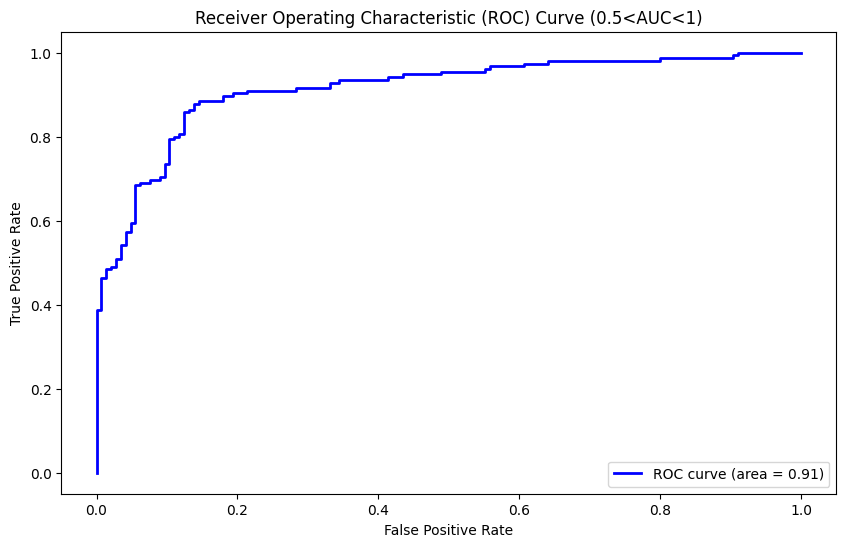

In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.table import Table
def plot_auc_roc():
    X, y = make_classification(n_samples=1000, n_features=20, n_classes=2, random_state=42)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    model = LogisticRegression()
    model.fit(X_train, y_train)

    y_scores = model.predict_proba(X_test)[:, 1]

    fpr, tpr, _ = roc_curve(y_test, y_scores)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(10, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate') # #wrong pos prediction/#neg examples
    plt.ylabel('True Positive Rate') # #correct pos predictions/#pos examples
    plt.title('Receiver Operating Characteristic (ROC) Curve (0.5<AUC<1)')
    plt.legend(loc='lower right')
    plt.show()

plot_auc_roc()

The area that the ROC curve and X axis consist is the AUC

* Confusion Matrix Representation
The confusion matrix provides a comprehensive description of the prediction results of a model, summarizing four scenarios:

|                | Predicted Positive | Predicted Negative |
|----------------|--------------------|--------------------|
| **Actual Positive**  | True Positive (TP)  | False Negative (FN)  |
| **Actual Negative**  | False Positive (FP)  | True Negative (TN)  |





> **Business Metyrics for Ads**

* Optimize both revennue and customer experience
  * Latency: Ads should be shown to users at the same time as others
  * ASN: Average #ads shown in pages
  * CTR: user click through rate
  * ACP: Average price advertiser pay per click

* Revenue = #pageviews * ASN * CTR * ACP

Platform cares about total revenue and traffic.

Users are concerned with ASN (Average Session Number) and CTR (Click-Through Rate).

Advertisers care about CTR (Click-Through Rate) and ACP (Average Cost Per Click).




> **Displaying Ads: Model -> Business Metrics**

For the model, we care about its AUC;

 however, focusing solely on AUC can be problematic.

A new model might show an increase in AUC, but it’s possible that some business metrics actually decline. AUC only reflects a statistical measure—predicted CTR might change, but not in a statistically significant way. Yet, it could still impact actual revenue. For instance:

- Predicted CTR might decrease without changing the AUC value, but this could lower the confidence in predicting user clicks, potentially leading to fewer ads being displayed.
- The newly replaced ads might have an actual lower CTR, as the model is using historical data. However, markets change, and users might not prefer ads based on outdated data.
- The ads selected by the model may have lower bids from advertisers.

Balancing model metrics with business metrics: The best approach is to deploy the model online and observe actual business metrics using real data.



### Regularization

L1 - Lasso

L2 - Ridge

Assume we have a regression problem:

match won = $\\θ_0$ + $\\θ_1$ * ages + $\\θ_2$ * $ages^2$ + $\\θ_3$ * $ages^3$ + $\\θ_4$ * $ages^4$

As we know In a linear model, this may cause overfit problems, so we try to make $\\θ_3$ and $\\θ_4$ almost close to zero:

match won = $\\θ_0$ + $\\θ_1$ * ages + $\\θ_2$ * $ages^2$

which obtains a 'Just right' model



> L2 Regularization:



$$
mse = \frac{1}{n} \sum_{i=1}^{n} \left( y_i - h_{\theta}(x_i) \right)^2 + \lambda \sum_{i=1}^{n} \theta_i^2
$$

Parameter Shrinkage: L2 regularization will make the parameter values tend to zero, but generally not exactly zero.

Prevent overfitting: reduce model complexity and improve generalization ability by limiting the size of parameters

Stability: better handling of covariance (high correlation between features) data

**Used for**：

Prevent overfitting: improve generalization ability by smoothing parameters when the number of features is similar to the number of samples.

Covariance data: to deal with cases where there is correlation between features

**Advantages**：

More stable, suitable for handling data with high feature correlation.

Prevents model parameters from being too large and smoothes the model.

**Disadvantages**：

Does not produce sparse solutions, model still contains all features




---





> L1 Regularization

$$
mse = \frac{1}{n} \sum_{i=1}^{n} \left( y_i - h_{\theta}(x_i) \right)^2 + \lambda \sum_{i=1}^{n} |\theta_i|
$$

Sparsity: L1 regularization reduces the values of some parameters to zero, thus acting as a feature selection

Model Interpretability: Since only a few important features are retained, the model is easier to interpret

Suitable for high dimensional data: L1 regularization can still work effectively when the number of features is more than the number of samples

**Used for**：

Feature selection: in cases where a few important features need to be selected from a large number of features.

Sparse models: e.g. bag-of-words models in text categorization.

**Advantages:**

Produces sparse models that facilitate feature selection and model interpretation.

Suitable for high dimensional data.

**Disadvantages:**

May be unstable in some cases, especially when feature correlation is high.


Those will penalize the higher value of $\theta_i$  

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
dataset = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/Melbourne_housing_FULL.csv')
dataset.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067.0,...,1.0,1.0,126.0,NaN,NaN,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019.0
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019.0
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019.0
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.5,3067.0,...,2.0,1.0,0.0,NaN,NaN,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019.0


In [ ]:
dataset.nunique()

,0
Suburb,351
Address,34009
Rooms,12
Type,3
Price,2871
Method,9
SellerG,388
Date,78
Distance,215
Postcode,211


In [ ]:
col = ['Suburb','Rooms','Type','Method','SellerG','Regionname','Propertycount','Distance','CouncilArea','Bedroom2','Bathroom','Car','Landsize','BuildingArea','Price']
dataset = dataset[col]
dataset.head()

,Suburb,Rooms,Type,Method,SellerG,Regionname,Propertycount,Distance,CouncilArea,Bedroom2,Bathroom,Car,Landsize,BuildingArea,Price
0,Abbotsford,2,h,SS,Jellis,Northern Metropolitan,4019.0,2.5,Yarra City Council,2.0,1.0,1.0,126.0,NaN,NaN
1,Abbotsford,2,h,S,Biggin,Northern Metropolitan,4019.0,2.5,Yarra City Council,2.0,1.0,1.0,202.0,NaN,1480000.0
2,Abbotsford,2,h,S,Biggin,Northern Metropolitan,4019.0,2.5,Yarra City Council,2.0,1.0,0.0,156.0,79.0,1035000.0
3,Abbotsford,3,u,VB,Rounds,Northern Metropolitan,4019.0,2.5,Yarra City Council,3.0,2.0,1.0,0.0,NaN,NaN
4,Abbotsford,3,h,SP,Biggin,Northern Metropolitan,4019.0,2.5,Yarra City Council,3.0,2.0,0.0,134.0,150.0,1465000.0


In [ ]:
dataset.isna().sum()

,0
Suburb,0
Rooms,0
Type,0
Method,0
SellerG,0
Regionname,3
Propertycount,3
Distance,1
CouncilArea,3
Bedroom2,8217


In [ ]:
cols_to_zero = ['Propertycount','Distance','Bedroom2','Bathroom','Car']
dataset[cols_to_zero] = dataset[cols_to_zero].fillna(0)
dataset.isna().sum()

,0
Suburb,0
Rooms,0
Type,0
Method,0
SellerG,0
Regionname,3
Propertycount,0
Distance,0
CouncilArea,3
Bedroom2,0


In [ ]:
dataset['Landsize'] = dataset['Landsize'].fillna(dataset.Landsize.mean())
dataset['BuildingArea'] = dataset['BuildingArea'].fillna(dataset.BuildingArea.mean())
dataset.isna().sum()

,0
Suburb,0
Rooms,0
Type,0
Method,0
SellerG,0
Regionname,3
Propertycount,0
Distance,0
CouncilArea,3
Bedroom2,0


In [ ]:
dataset.dropna(inplace=True)
dataset.isna().sum()

,0
Suburb,0
Rooms,0
Type,0
Method,0
SellerG,0
Regionname,0
Propertycount,0
Distance,0
CouncilArea,0
Bedroom2,0


In [ ]:
data_d = pd.get_dummies(dataset, drop_first=True).astype(int)
data_d.head()

,Rooms,Propertycount,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,Price,Suburb_Aberfeldie,...,CouncilArea_Moorabool Shire Council,CouncilArea_Moreland City Council,CouncilArea_Nillumbik Shire Council,CouncilArea_Port Phillip City Council,CouncilArea_Stonnington City Council,CouncilArea_Whitehorse City Council,CouncilArea_Whittlesea City Council,CouncilArea_Wyndham City Council,CouncilArea_Yarra City Council,CouncilArea_Yarra Ranges Shire Council
1,2,4019,2,2,1,1,202,160,1480000,0,...,0,0,0,0,0,0,0,0,1,0
2,2,4019,2,2,1,0,156,79,1035000,0,...,0,0,0,0,0,0,0,0,1,0
4,3,4019,2,3,2,0,134,150,1465000,0,...,0,0,0,0,0,0,0,0,1,0
5,3,4019,2,3,2,1,94,160,850000,0,...,0,0,0,0,0,0,0,0,1,0
6,4,4019,2,3,1,2,120,142,1600000,0,...,0,0,0,0,0,0,0,0,1,0


In [ ]:
X = data_d.drop('Price', axis=1)
y = data_d['Price']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2)

In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression().fit(X_train, y_train)

In [ ]:
print('Test score:', lr.score(X_test, y_test),'Train score:',lr.score(X_train, y_train))

Test score: 0.13413168587586 Train score: 0.682586295004645


In [ ]:
from sklearn import linear_model

lasso_reg = linear_model.Lasso(alpha=50, max_iter=100, tol=0.1)
lasso_reg.fit(X_train, y_train)

Lasso(alpha=50, max_iter=100, tol=0.1)

In [ ]:
print('Test score:',lasso_reg.score(X_test, y_test),'\n','Train score:',lasso_reg.score(X_train, y_train))

Test score: 0.6633169721521481 
 Train score: 0.6765562610203997


In [ ]:
ridge_reg = linear_model.Ridge(alpha=50, max_iter=100, tol=0.1)
ridge_reg.fit(X_train, y_train)

Ridge(alpha=50, max_iter=100, tol=0.1)

In [ ]:
print('Test score:',ridge_reg.score(X_test, y_test),'\n','Train score:',ridge_reg.score(X_train, y_train))

Test score: 0.6669747759118698 
 Train score: 0.6619849633207061




---




### Hyper Tunning



> **Search Space**

* Specify range for each hyperparameter

| Hyper-Parameter                | Range                                                                                                         | Distribution      |
|--------------------------------|---------------------------------------------------------------------------------------------------------------|--------------------|
| model (backbone)               | [mobilenetv2_0.25, mobilenetv3_small, mobilenetv3_large, resnet18_v1b, resnet34_v1b, resnet50_v1b, resnet101_v1b, vgg16_bn, se_resnext50_32x4d, resnest50, resnest200] | categorical        |
| learning rate *                | [1e-6, 1e-1]                                                                                               | log-uniform        |
| batch size *                   | [8, 16, 32, 64, 128, 256, 512]                                                                              | categorical        |
| momentum **                    | [0.85, 0.95]                                                                                               | uniform            |
| weight decay **                | [1e-6, 1e-2]                                                                                               | log-uniform        |
| detector                       | [faster-rcnn, ssd, yolo-v3, center-net]                                                                    | categorical        |


* The search space can be exponentially large
  * Need to carefully design the space to improve efficiency



> **HPO algorithms: Black-box or Multi-fidelity**

* Black-box: treats a training job as a black-box in HPO
  * Completes the training process for each trial
  (Focus on the accuracy on certain hyperparameters)

  * Categories:
    - Grid Search
      * All combinations are evaluated
      * Guarantees the best results  
    - Random Search
      * Random Combinations are tried
      * More efficient than grid search
    - Bayesian Optimization (BO)
      * Iteratively learn a mapping from HP to objective function
      
        Based on previous trails, select the next trail based on the current estimation
      * Surrogate model
        - Estimate how the objective function depends on HP
        - Probabilistic regression models: Random forest, Gaussian process
      * Acquisition function
        - Acquisition max means uncertainty and predicted objective are high
        - Sample the next trial according to the acquisition function
        - Trade off exploration and exploitation
      * Limitation of BO:
        - In the initial stages, similar to random search
        - Optimization process is sequential
    - Simulated Annealing
    - Genetic Algorithms
  
* Multi-fidelity: modifies the training job to speed up the search(focus on hyperparameter's sorting)
  * Train on subsampled datasets
  * Reduce model size(e.g. less #layers, #channels)
  * Stop bad configuration earlier
  * Categories:
    - Modeling Learning Curve
    - Bandit Based
      * Successive Halving
        - Save the budget for most promising config
        - Randomly pick n configurations to train m epochs
        - Repeat until one configuration left:
          * Keep the best n/2 configuration to train another m epochs
          * Keep the best n/4 configuration to train another 2m epochs
          * ... ...

          (keep the best half of configuration and train one times more epochs on those)
        - Select n and m based on training budget and #epoch needed for a full training


In [ ]:
!pip install scikit-optimize

In [ ]:
import numpy as np
from sklearn import datasets, svm
from sklearn.model_selection import cross_val_score
from skopt import gp_minimize
from skopt.space import Real, Categorical, Integer


iris = datasets.load_iris()
X, y = iris.data, iris.target


def objective(params):
    C, gamma = params
    clf = svm.SVC(C=C, gamma=gamma)
    return -np.mean(cross_val_score(clf, X, y, cv=5, scoring='accuracy'))


space = [
    Real(1e-6, 1e+6, prior='log-uniform', name='C'),
    Real(1e-6, 1e+1, prior='log-uniform', name='gamma')
]


res = gp_minimize(objective, space, n_calls=50, random_state=0)

print("最佳参数：C=%.6f, gamma=%.6f" % (res.x[0], res.x[1]))
print("最佳准确率：%.4f" % (-res.fun))


最佳参数：C=11376.463871, gamma=0.000039
最佳准确率：0.9867


### Bias and Variance

In [ ]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

def plot_learning_curve(estimator, X, y, cv=5, scoring='neg_mean_squared_error'):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator, X, y, cv=cv, scoring=scoring, train_sizes=np.linspace(0.1, 1.0, 10)
    )

    train_scores_mean = -train_scores.mean(axis=1)
    validation_scores_mean = -validation_scores.mean(axis=1)

    plt.figure()
    plt.plot(train_sizes, train_scores_mean, label='训练误差')
    plt.plot(train_sizes, validation_scores_mean, label='验证误差')
    plt.ylabel('误差')
    plt.xlabel('训练集大小')
    plt.title('学习曲线')
    plt.legend()
    plt.show()

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(estimator, X, y, cv=10, scoring='neg_mean_squared_error')
print("平均得分: ", -scores.mean())
print("得分方差: ", scores.var())


NameError: name 'estimator' is not defined

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

def bias_variance_decomp(X, y, model, num_rounds=200, test_size=0.2):
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error

    mse_list = []
    bias_list = []
    variance_list = []

    for _ in range(num_rounds):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        mse = mean_squared_error(y_test, y_pred)
        mse_list.append(mse)

        expected_y_pred = np.mean(y_pred)
        bias = (expected_y_pred - np.mean(y_test)) ** 2
        bias_list.append(bias)

        variance = np.mean((y_pred - expected_y_pred) ** 2)
        variance_list.append(variance)

    print("平均MSE:", np.mean(mse_list))
    print("平均偏差平方:", np.mean(bias_list))
    print("平均方差:", np.mean(variance_list))
    print("总误差:", np.mean(bias_list) + np.mean(variance_list))


## ML & DS Project

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib
matplotlib.rcParams['figure.figsize'] = (20,10)



> Data cleaning



In [ ]:
df = pd.read_csv('/content/drive/MyDrive/MD/Learning is Learning/Bengaluru_House_Data.csv')
df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [ ]:
df.shape

(13320, 9)

In [ ]:
df.groupby('area_type')['area_type'].agg('count') # only focus on the area)type columns

,area_type
area_type,
Built-up Area,2418
Carpet Area,87
Plot Area,2025
Super built-up Area,8790


In [ ]:
df.isna().sum()

,0
area_type,0
availability,0
location,1
size,16
society,5502
total_sqft,0
bath,73
balcony,609
price,0


In [ ]:
df_1 = df.drop(['area_type','availability','society','balcony'],axis='columns')
df_1.head()

,location,size,total_sqft,bath,price
0,Electronic City Phase II,2 BHK,1056,2.0,39.07
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00
2,Uttarahalli,3 BHK,1440,2.0,62.00
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00
4,Kothanur,2 BHK,1200,2.0,51.00


In [ ]:
df_1.isna().sum()

,0
location,1
size,16
total_sqft,0
bath,73
price,0


In [ ]:
df_1.bath = df_1.bath.fillna(df_1.bath.median())
df_1.isna().sum()

,0
location,1
size,16
total_sqft,0
bath,0
price,0


In [ ]:
df_2 = df_1.dropna()
df_2.isna().sum()

,0
location,0
size,0
total_sqft,0
bath,0
price,0


In [ ]:
df_2['size'].unique()

array(['2 BHK', '4 Bedroom', '3 BHK', '4 BHK', '6 Bedroom', '3 Bedroom',
       '1 BHK', '1 RK', '1 Bedroom', '8 Bedroom', '2 Bedroom',
       '7 Bedroom', '5 BHK', '7 BHK', '6 BHK', '5 Bedroom', '11 BHK',
       '9 BHK', '9 Bedroom', '27 BHK', '10 Bedroom', '11 Bedroom',
       '10 BHK', '19 BHK', '16 BHK', '43 Bedroom', '14 BHK', '8 BHK',
       '12 Bedroom', '13 BHK', '18 Bedroom'], dtype=object)

In [ ]:
df_2.loc[:,'bhk'] = df_2['size'].apply(lambda x: int(x.split(' ')[0])) # using loc to operate on the origin dataframe or using .copy()
df_2.head()

<ipython-input-87-a332c6277b34>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2.loc[:,'bhk'] = df_2['size'].apply(lambda x: int(x.split(' ')[0])) # using loc to operate on the origin dataframe or using .copy()


,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00,4
2,Uttarahalli,3 BHK,1440,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00,3
4,Kothanur,2 BHK,1200,2.0,51.00,2


In [ ]:
df_2['bhk'].unique()

array([ 2,  4,  3,  6,  1,  8,  7,  5, 11,  9, 27, 10, 19, 16, 43, 14, 12,
       13, 18])

In [ ]:
(df_2.bhk>df_2.bhk.mean()).count()

13303

In [ ]:
df_2.total_sqft.unique()

array(['1056', '2600', '1440', ..., '1133 - 1384', '774', '4689'],
      dtype=object)

In [ ]:
def is_float(x):
    try:
        float(x)
    except:
        return False
    return True

In [ ]:
df_2[~df_2['total_sqft'].apply(is_float)].head()

,location,size,total_sqft,bath,price,bhk
30,Yelahanka,4 BHK,2100 - 2850,4.0,186.000,4
56,Devanahalli,4 Bedroom,3010 - 3410,2.0,192.000,4
81,Hennur Road,4 Bedroom,2957 - 3450,2.0,224.500,4
122,Hebbal,4 BHK,3067 - 8156,4.0,477.000,4
137,8th Phase JP Nagar,2 BHK,1042 - 1105,2.0,54.005,2


In [ ]:
def convert_sqft_to_num(x):
    tokens = x.split('-')
    if len(tokens) == 2:
        return (float(tokens[0])+float(tokens[1]))/2
    try:
        return float(x)
    except:
        return None

In [ ]:
df_3 = df_2.copy()
df_3['total_sqft'] = df_3['total_sqft'].apply(convert_sqft_to_num)
df_3.head()

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3
4,Kothanur,2 BHK,1200.0,2.0,51.00,2




> Feauture Engineering



In [ ]:
df_f = df_3.copy()
df_f['price_per_sqft'] = df_f['price']*100000/df_f['total_sqft']
df_f.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250.000000


In [ ]:
len(df_f.location.unique())

1304

In [ ]:
df_f.location = df_f.location.apply(lambda x: x.strip())
location_stats = df_f.groupby('location')['location'].agg('count').sort_values(ascending=False)
location_stats

,location
location,
Whitefield,540
Sarjapur Road,397
Electronic City,304
Kanakpura Road,273
Thanisandra,237
...,...
1 Giri Nagar,1
"Kanakapura Road,",1
Kanakapura main Road,1


In [ ]:
len(location_stats[location_stats<=10])

1052

In [ ]:
df_f.location = df_f.location.apply(lambda x: 'other' if x in location_stats[location_stats<=10] else x)
len(df_f.location.unique())

242



> Outlier Removal



In [ ]:
df_f[df_f.total_sqft/df_f.bhk<300].head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
9,other,6 Bedroom,1020.0,6.0,370.0,6,36274.509804
45,HSR Layout,8 Bedroom,600.0,9.0,200.0,8,33333.333333
58,Murugeshpalya,6 Bedroom,1407.0,4.0,150.0,6,10660.980810
68,Devarachikkanahalli,8 Bedroom,1350.0,7.0,85.0,8,6296.296296
70,other,3 Bedroom,500.0,3.0,100.0,3,20000.000000


In [ ]:
df_1.shape

(13320, 5)

In [ ]:
df_f_1 = df_f[~(df_f.total_sqft/df_f.bhk<300)]
df_f_1.shape

(12559, 7)

In [ ]:
df_f_1.price_per_sqft.describe()

,price_per_sqft
count,12513.000000
mean,6307.441644
std,4160.931610
min,267.829813
25%,4210.526316
50%,5295.007564
75%,6916.666667
max,176470.588235


In [ ]:
def remove_pps_outliers(df):
    df_out = pd.DataFrame()
    for key, subdf in df.groupby('location'):
        m = np.mean(subdf.price_per_sqft)
        st = np.std(subdf.price_per_sqft)
        reduced_df = subdf[(subdf.price_per_sqft>(m-st)) & (subdf.price_per_sqft<=(m+st))]
        df_out = pd.concat([df_out,reduced_df],ignore_index=True)
    return df_out
df_f_2 = remove_pps_outliers(df_f_1)
df_f_2.shape

(10286, 7)

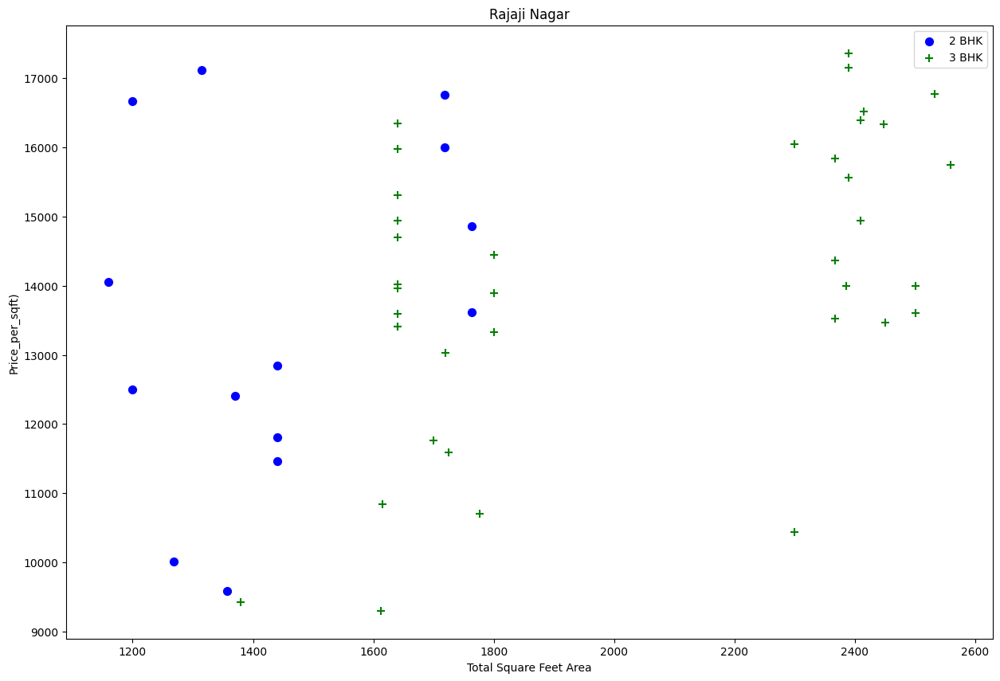

In [ ]:
def plot_scatter_chart(df,location):
    bhk2 = df[(df.location==location) & (df.bhk==2)]
    bhk3 = df[(df.location==location) & (df.bhk==3)]
    matplotlib.rcParams['figure.figsize'] = (15,10)
    plt.scatter(bhk2.total_sqft,bhk2.price_per_sqft,color='blue',label='2 BHK', s=50)
    plt.scatter(bhk3.total_sqft,bhk3.price_per_sqft,marker='+', color='green',label='3 BHK', s=50)
    plt.xlabel("Total Square Feet Area")
    plt.ylabel("Price_per_sqft)")
    plt.title(location)
    plt.legend()
plot_scatter_chart(df_f_2,"Rajaji Nagar")

In [ ]:
def remove_bhk_outliers(df):
    exclude_indices = np.array([])
    for location, location_df in df.groupby('location'):
        bhk_stats = {}
        for bhk, bhk_df in location_df.groupby('bhk'):
            bhk_stats[bhk] = {
                'mean': np.mean(bhk_df.price_per_sqft),
                'std': np.std(bhk_df.price_per_sqft),
                'count': bhk_df.shape[0]
            }
        for bhk, bhk_df in location_df.groupby('bhk'):
            stats = bhk_stats.get(bhk-1)
            if stats and stats['count']>5:
                exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)
    return df.drop(exclude_indices,axis='index')

In [ ]:
df_f_3 = remove_bhk_outliers(df_f_2)
df_f_3.shape

(7353, 7)

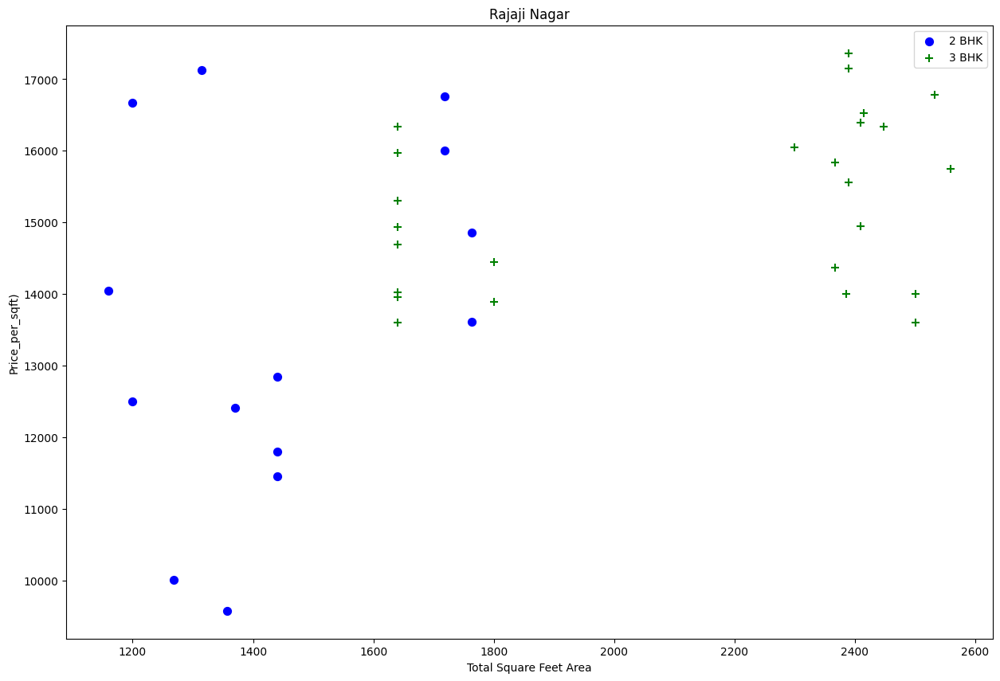

In [ ]:
plot_scatter_chart(df_f_3,"Rajaji Nagar")

Text(0, 0.5, 'Count')

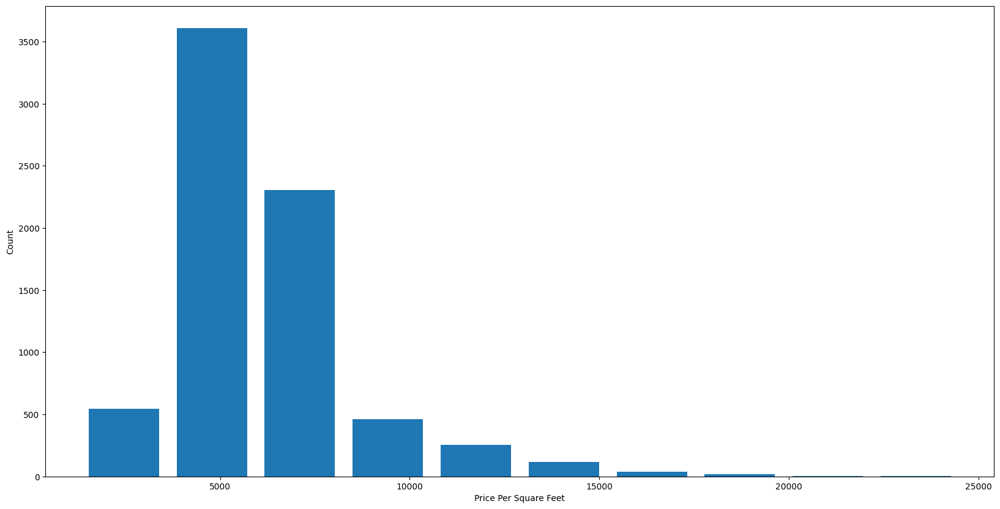

In [ ]:
#Histogram

matplotlib.rcParams["figure.figsize"] = (20,10)
plt.hist(df_f_3.price_per_sqft,rwidth=0.8)
plt.xlabel("Price Per Square Feet")
plt.ylabel("Count")

In [ ]:
df_f_3.bath.unique()

array([ 4.,  3.,  2.,  5.,  8.,  1.,  6.,  7.,  9., 12., 16., 13.])

In [ ]:
df_f_3[df_f_3.bath>10]

,location,size,total_sqft,bath,price,bhk,price_per_sqft
5306,Neeladri Nagar,10 BHK,4000.0,12.0,160.0,10,4000.000000
8530,other,10 BHK,12000.0,12.0,525.0,10,4375.000000
8619,other,16 BHK,10000.0,16.0,550.0,16,5500.000000
9352,other,11 BHK,6000.0,12.0,150.0,11,2500.000000
9683,other,13 BHK,5425.0,13.0,275.0,13,5069.124424


Text(0, 0.5, 'Count')

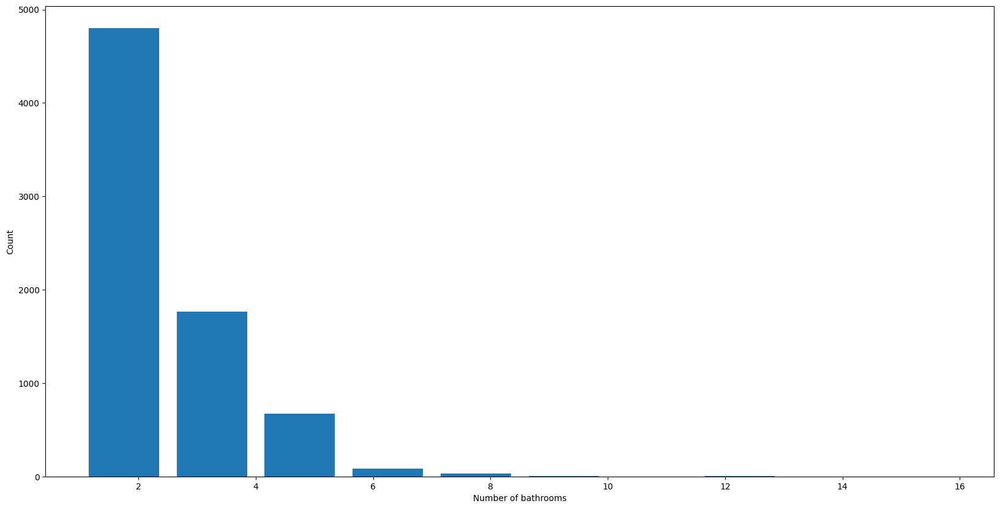

In [ ]:
plt.hist(df_f_3.bath,rwidth=0.8)
plt.xlabel("Number of bathrooms")
plt.ylabel("Count")

In [ ]:
df_f_3[df_f_3.bath>df_f_3.bhk+2]

,location,size,total_sqft,bath,price,bhk,price_per_sqft
1634,Chikkabanavar,4 Bedroom,2460.0,7.0,80.0,4,3252.032520
5267,Nagasandra,4 Bedroom,7000.0,8.0,450.0,4,6428.571429
6748,Thanisandra,3 BHK,1806.0,6.0,116.0,3,6423.034330
8455,other,6 BHK,11338.0,9.0,1000.0,6,8819.897689


In [ ]:
df_f_4 = df_f_3[df_f_3.bath<df_f_3.bhk+2]
df_f_4.shape

(7275, 7)

In [ ]:
dfv = df_f_4.drop(['size','price_per_sqft'],axis='columns')
dfv.head()

,location,total_sqft,bath,price,bhk
0,1st Block Jayanagar,2850.0,4.0,428.0,4
1,1st Block Jayanagar,1630.0,3.0,194.0,3
2,1st Block Jayanagar,1875.0,2.0,235.0,3
3,1st Block Jayanagar,1200.0,2.0,130.0,3
4,1st Block Jayanagar,1235.0,2.0,148.0,2




> Model Building



In [ ]:
dummies = pd.get_dummies(dfv.location).astype(int)
dummies.head()

,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,6th Phase JP Nagar,7th Phase JP Nagar,8th Phase JP Nagar,9th Phase JP Nagar,...,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur,other
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
dfv_1 = pd.concat([dfv,dummies.drop('other',axis='columns')],axis='columns')
dfv_1.head()

,location,total_sqft,bath,price,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,1st Block Jayanagar,2850.0,4.0,428.0,4,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1st Block Jayanagar,1630.0,3.0,194.0,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1st Block Jayanagar,1875.0,2.0,235.0,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1st Block Jayanagar,1200.0,2.0,130.0,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1st Block Jayanagar,1235.0,2.0,148.0,2,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
dfv_2 = dfv_1.drop('location',axis='columns')
dfv_2.head()

,total_sqft,bath,price,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,428.0,4,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,194.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,235.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,130.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,148.0,2,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
X = dfv_2.drop(['price'],axis='columns')
X.head()

,total_sqft,bath,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,6th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,4,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
y = dfv_2.price
y.head()

,price
0,428.0
1,194.0
2,235.0
3,130.0
4,148.0


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=10)

In [ ]:
from sklearn.linear_model import LinearRegression
lr_clf = LinearRegression()
lr_clf.fit(X_train,y_train)
lr_clf.score(X_test,y_test)

0.8300702721039399

In [ ]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
cross_val_score(LinearRegression(), X, y, cv=cv)

array([0.80702643, 0.77249195, 0.86466289, 0.83528873, 0.81806721])

In [ ]:
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor

def GSCV(X,y):
  algos = {
      'linear_regression' : {
          'model': LinearRegression(),
          'params': {
              # 'normalize': [True, False] # Removed the normalize parameter
              'fit_intercept': [True, False] # Added an example of a valid parameter
          }
      },
      'lasso': {
          'model': Lasso(),
          'params': {
              'alpha': [1,2],
              'selection': ['random', 'cyclic']
          }
      },
      'decision_tree': {
          'model': DecisionTreeRegressor(),
          'params': {
              'criterion' : ['mse','friedman_mse'],
              'splitter': ['best','random']
          }
      }
  }

  scores = []
  cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
  for algo_name, config in algos.items():
    gs =  GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
    gs.fit(X,y)
    scores.append({
        'model': algo_name,
        'best_score': gs.best_score_,
        'best_params': gs.best_params_
    })
  return pd.DataFrame(scores,columns=['model','best_score','best_params'])

GSCV(X,y)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
10 fits failed out of a total of 20.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_

,model,best_score,best_params
0,linear_regression,0.819696,{'fit_intercept': False}
1,lasso,0.679931,"{'alpha': 1, 'selection': 'cyclic'}"
2,decision_tree,0.700088,"{'criterion': 'friedman_mse', 'splitter': 'best'}"


In [ ]:
def predict_price(location,sqft,bath,bhk):
    loc_index = np.where(X.columns==location)[0][0]

    x=np.zeros(len(X.columns))
    x[0] = sqft
    x[1] = bath
    x[2] = bhk
    if loc_index >= 0:
        x[loc_index] = 1

    return lr_clf.predict([x])

predict_price('1st Phase JP Nagar',1000, 2,2)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([83.51389236])



> Save model



In [ ]:
import pickle
with open('banglore_home_prices_model.pickle','wb') as f:
    pickle.dump(lr_clf,f)

In [ ]:
#export other important infos
import json
columns = {
    'data_columns' : [col.lower() for col in X.columns]
}
with open("columns.json","w") as f:
    f.write(json.dumps(columns))



> Flask Server

Just for illustration



In [ ]:
from flask import Flask, request, jsonify
app = Flask(__name__)

@app.route('/predict_home_price',methods=['POST'])

def predict_home_price():
    total_sqft = float(request.form['total_sqft'])
    location = request.form['location']
    bhk = int(request.form['bhk'])
    bath = int(request.form['bath'])

    response = jsonify({
        'estimated_price': predict_price(location,total_sqft,bhk,bath)
    })
    response.headers.add('Access-Control-Allow-Origin', '*')

    return response

if __name__ == "__main__":
    print("Starting Python Flask Server For Home Price Prediction...")
    app.run()







---

